# Gắn Google Drive cục bộ

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Nhập tất cả các thư viện

In [ ]:
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 2.9 MB/s eta 0:00:00


In [ ]:
!pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 413.4/413.4 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 26.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 11.3 MB/s eta 0:00:00


In [ ]:
!pip install jpholiday

In [ ]:
# Nhập các thư viện
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')

from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder

import warnings
warnings.filterwarnings('ignore')

import datetime
import datetime as dt
import jpholiday
import optuna

# Tải dữ liệu

In [ ]:
# Tải dữ liệu huấn luyện
train_df = pd.read_csv('/content/drive/MyDrive/FUNIX/MON5/train_df.csv')

# Chuyển đổi dữ liệu sang datetime
train_df['date'] = pd.to_datetime(train_df['date'])

print(f'train_df.shape = {train_df.shape}')
train_df

train_df.shape = (132192, 13)


,id,date,tourist_area,spot_facility,tourist_arrivals,area,city,type,category,tourism_index,info,event,weather_index
0,0,2018-08-01,1,A,454,A,A,A,13,1750.0,A,A,40.05
1,1,2018-08-01,1,B,823,A,A,A,13,1750.0,A,A,40.05
2,2,2018-08-01,1,C,149,A,A,A,13,1750.0,A,A,40.05
3,3,2018-08-01,1,D,157,A,A,A,13,1750.0,A,A,40.05
4,4,2018-08-01,1,E,14,A,A,A,13,1750.0,A,A,40.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...
132187,132187,2019-05-31,9,D,149,A,A,C,6,1998.0,A,A,48.29
132188,132188,2019-05-31,9,E,56,A,A,C,6,1998.0,A,A,48.29
132189,132189,2019-05-31,9,F,353,A,A,C,6,1998.0,A,A,48.29
132190,132190,2019-05-31,9,G,35,A,A,C,6,1998.0,A,A,48.29


In [ ]:
# Tải dữ liệu kiểm tra
test_df = pd.read_csv('/content/drive/MyDrive/FUNIX/MON5/test_df.csv')

# Chuyển đổi dữ liệu sang datetime
test_df['date'] = pd.to_datetime(test_df['date'])

print(f'test_df.shape = {test_df.shape}')
test_df

test_df.shape = (13392, 12)


,id,date,tourist_area,spot_facility,area,city,type,category,tourism_index,info,event,weather_index
0,145584,2019-07-01,1,A,A,A,A,13,1362,A,A,NaN
1,145585,2019-07-01,1,B,A,A,A,13,1362,A,A,NaN
2,145586,2019-07-01,1,C,A,A,A,13,1362,A,A,NaN
3,145587,2019-07-01,1,D,A,A,A,13,1362,A,A,NaN
4,145588,2019-07-01,1,E,A,A,A,13,1362,A,A,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
13387,158971,2019-07-31,9,D,A,A,C,6,2040,A,A,50.21
13388,158972,2019-07-31,9,E,A,A,C,6,2040,A,A,50.21
13389,158973,2019-07-31,9,F,A,A,C,6,2040,A,A,50.21
13390,158974,2019-07-31,9,G,A,A,C,6,2040,A,A,50.21


In [ ]:
# Tải file submission
submission = pd.read_csv('/content/drive/MyDrive/FUNIX/MON5/submission.csv')

print(f'submission.shape = {submission.shape}')
submission

submission.shape = (13392, 2)


,id,tourist_arrivals
0,145584,0
1,145585,0
2,145586,0
3,145587,0
4,145588,0
...,...,...
13387,158971,0
13388,158972,0
13389,158973,0
13390,158974,0


# Mô tả dữ liệu

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 132192 entries, 0 to 132191
Data columns (total 13 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   id                132192 non-null  int64         
 1   date              132192 non-null  datetime64[ns]
 2   tourist_area      132192 non-null  int64         
 3   spot_facility     132192 non-null  object        
 4   tourist_arrivals  132192 non-null  int64         
 5   area              132192 non-null  object        
 6   city              132192 non-null  object        
 7   type              132192 non-null  object        
 8   category          132192 non-null  int64         
 9   tourism_index     128200 non-null  float64       
 10  info              132192 non-null  object        
 11  event             132192 non-null  object        
 12  weather_index     91152 non-null   float64       
dtypes: datetime64[ns](1), float64(2), int64(4), object(6)
memor

In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13392 entries, 0 to 13391
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             13392 non-null  int64         
 1   date           13392 non-null  datetime64[ns]
 2   tourist_area   13392 non-null  int64         
 3   spot_facility  13392 non-null  object        
 4   area           13392 non-null  object        
 5   city           13392 non-null  object        
 6   type           13392 non-null  object        
 7   category       13392 non-null  int64         
 8   tourism_index  13392 non-null  int64         
 9   info           13392 non-null  object        
 10  event          13392 non-null  object        
 11  weather_index  8208 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(4), object(6)
memory usage: 1.2+ MB


In [ ]:
def summary(df):
    '''
    đầu vào: dataframe
    đầu ra: thống kê dữ liệu: loại, % bị thiếu, duy nhất, tổng
    '''
    summary_df = pd.DataFrame(df.dtypes, columns=['dtypes'])
    summary_df['missing#'] = df.isna().sum()
    summary_df['missing%'] = (df.isna().sum())/len(df)
    summary_df['uniques'] = df.nunique().values
    summary_df['count'] = df.count().values
    return summary_df
# dữ liệu huấn luyện
summary(train_df).style.background_gradient(cmap='Blues')

,dtypes,missing#,missing%,uniques,count
id,int64,0,0.000000,132192,132192
date,datetime64[ns],0,0.000000,303,132192
tourist_area,int64,0,0.000000,54,132192
spot_facility,object,0,0.000000,8,132192
tourist_arrivals,int64,0,0.000000,3071,132192
area,object,0,0.000000,22,132192
city,object,0,0.000000,16,132192
type,object,0,0.000000,5,132192
category,int64,0,0.000000,17,132192
tourism_index,float64,3992,0.030198,3609,128200


In [ ]:
# dữ liệu kiểm tra
summary(test_df).style.background_gradient(cmap='Blues')

,dtypes,missing#,missing%,uniques,count
id,int64,0,0.000000,13392,13392
date,datetime64[ns],0,0.000000,31,13392
tourist_area,int64,0,0.000000,54,13392
spot_facility,object,0,0.000000,8,13392
area,object,0,0.000000,22,13392
city,object,0,0.000000,16,13392
type,object,0,0.000000,5,13392
category,int64,0,0.000000,17,13392
tourism_index,int64,0,0.000000,1216,13392
info,object,0,0.000000,2,13392


# Vẽ biểu đồ trực quan từng đặc trưng với mục tiêu

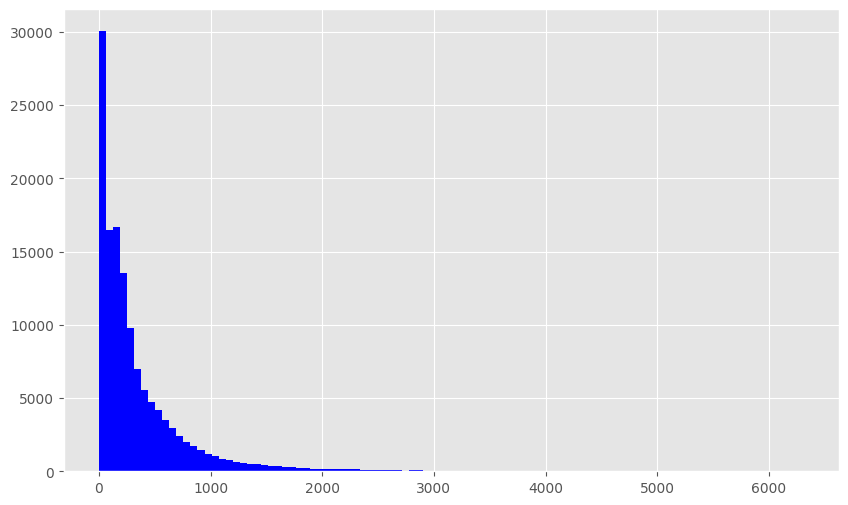

In [ ]:
# tourist_arrivals (output)
plt.figure(figsize=(10, 6))
plt.hist(train_df['tourist_arrivals'], bins=100, color='b')
plt.show()

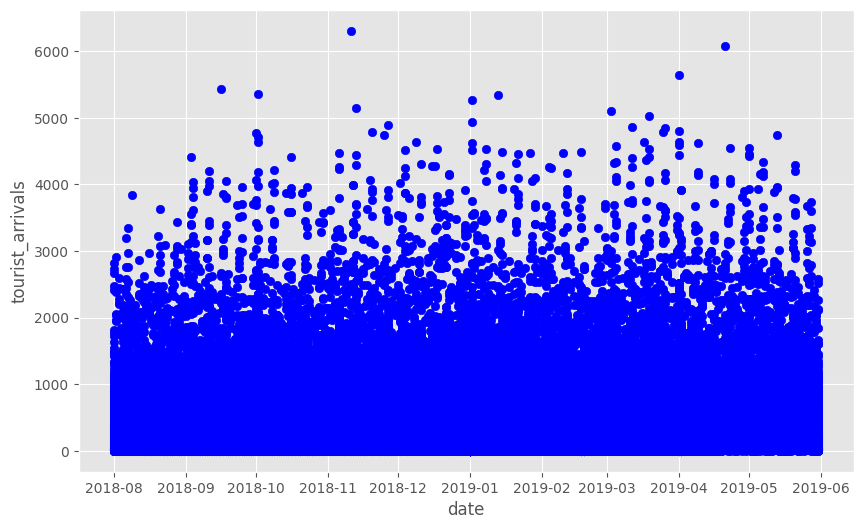

In [ ]:
# date
plt.figure(figsize = (10,6))
plt.scatter(train_df["date"], train_df["tourist_arrivals"], color='b')
plt.xlabel('date')
plt.ylabel('tourist_arrivals')
plt.show()

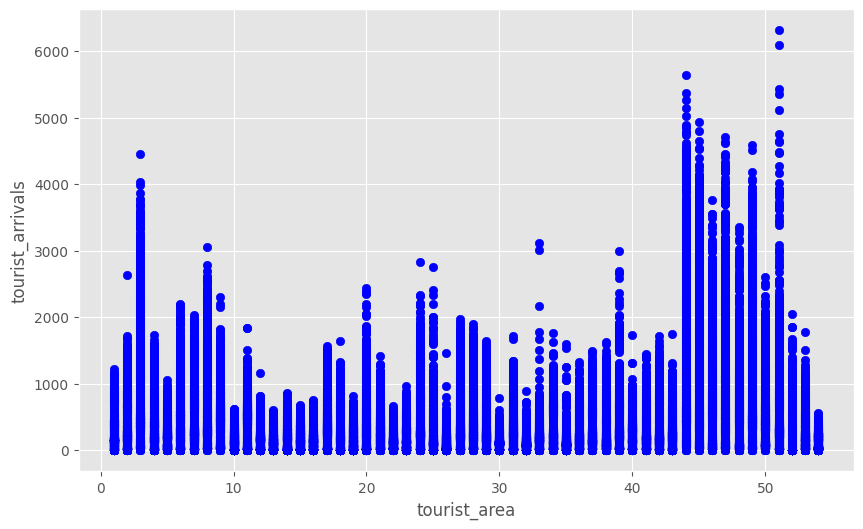

In [ ]:
# tourist_area
plt.figure(figsize = (10,6))
plt.scatter(train_df["tourist_area"], train_df["tourist_arrivals"], color='b')
plt.xlabel('tourist_area')
plt.ylabel('tourist_arrivals')
plt.show()

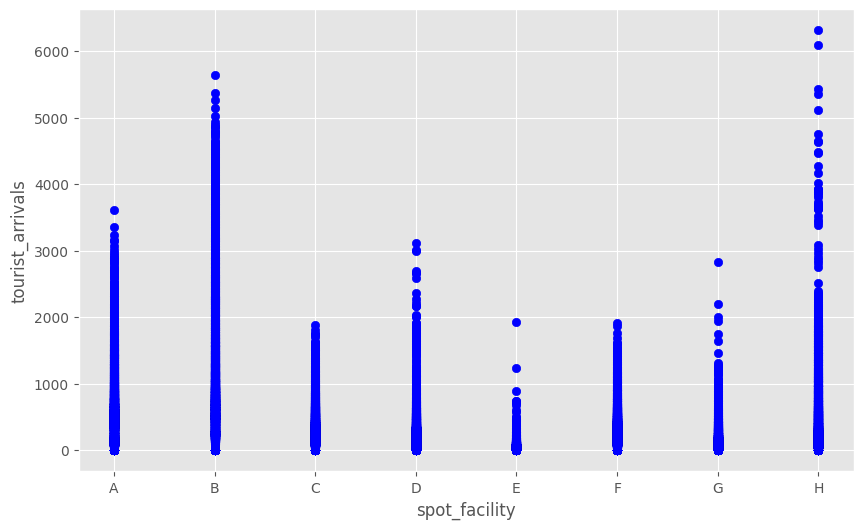

In [ ]:
# spot_facility
plt.figure(figsize = (10,6))
plt.scatter(train_df["spot_facility"], train_df["tourist_arrivals"], color='b')
plt.xlabel('spot_facility')
plt.ylabel('tourist_arrivals')
plt.show()

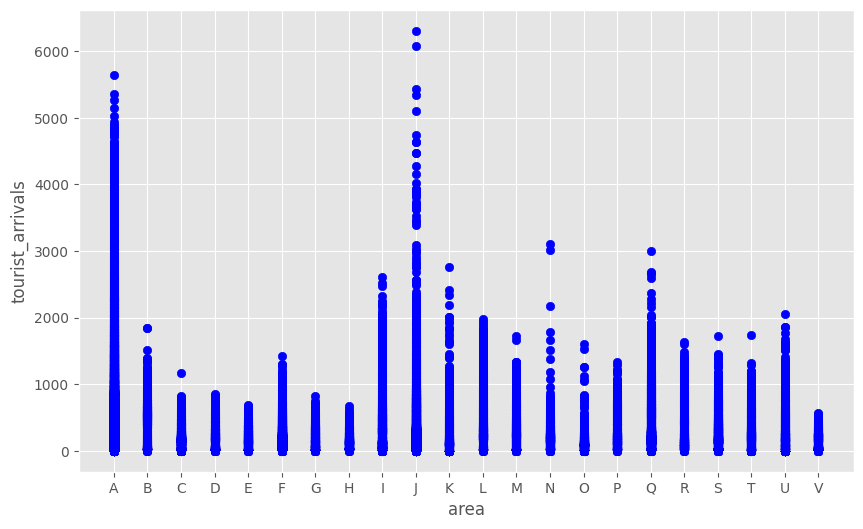

In [ ]:
# area
plt.figure(figsize = (10,6))
plt.scatter(train_df["area"], train_df["tourist_arrivals"], color='b')
plt.xlabel('area')
plt.ylabel('tourist_arrivals')
plt.show()

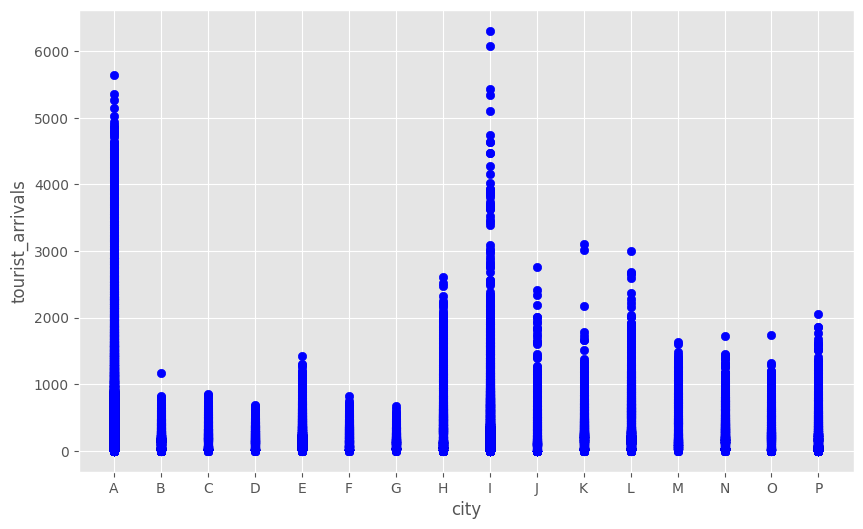

In [ ]:
# city
plt.figure(figsize = (10,6))
plt.scatter(train_df["city"], train_df["tourist_arrivals"], color='b')
plt.xlabel('city')
plt.ylabel('tourist_arrivals')
plt.show()

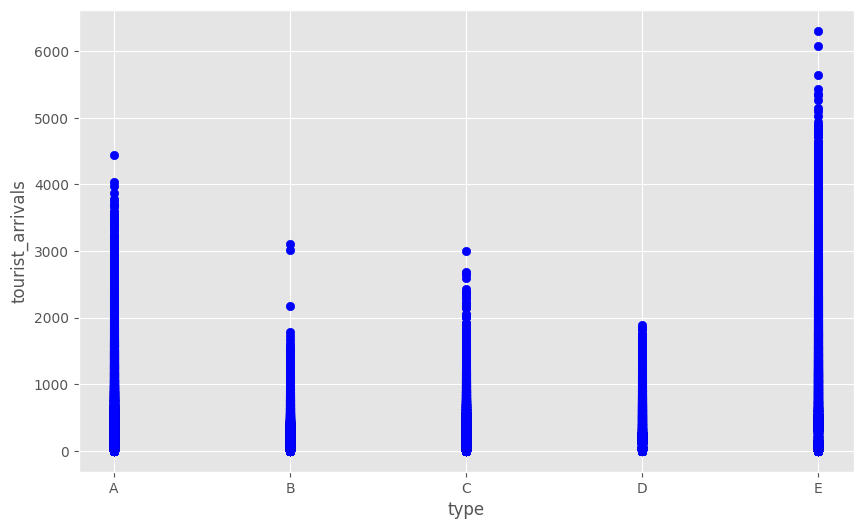

In [ ]:
# type
plt.figure(figsize = (10,6))
plt.scatter(train_df["type"], train_df["tourist_arrivals"], color='b')
plt.xlabel('type')
plt.ylabel('tourist_arrivals')
plt.show()

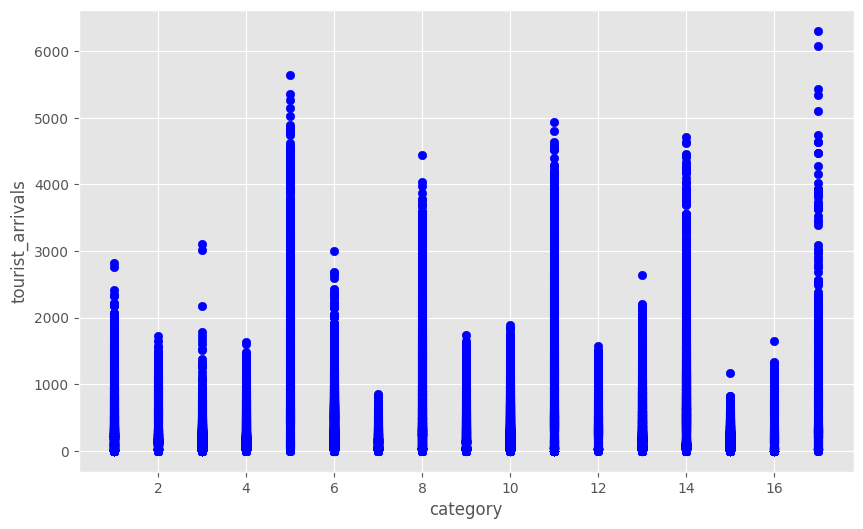

In [ ]:
# category
plt.figure(figsize = (10,6))
plt.scatter(train_df["category"], train_df["tourist_arrivals"], color='b')
plt.xlabel('category')
plt.ylabel('tourist_arrivals')
plt.show()

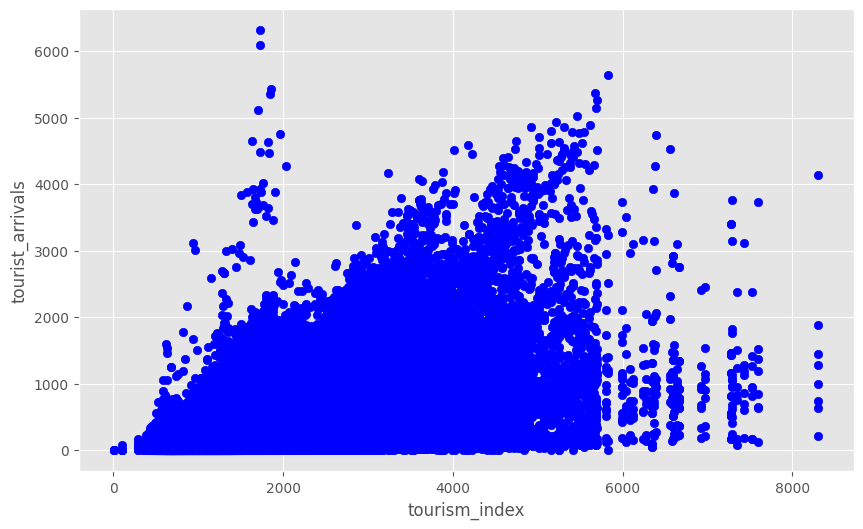

In [ ]:
# tourism_index
plt.figure(figsize = (10,6))
plt.scatter(train_df["tourism_index"], train_df["tourist_arrivals"], color='b')
plt.xlabel('tourism_index')
plt.ylabel('tourist_arrivals')
plt.show()

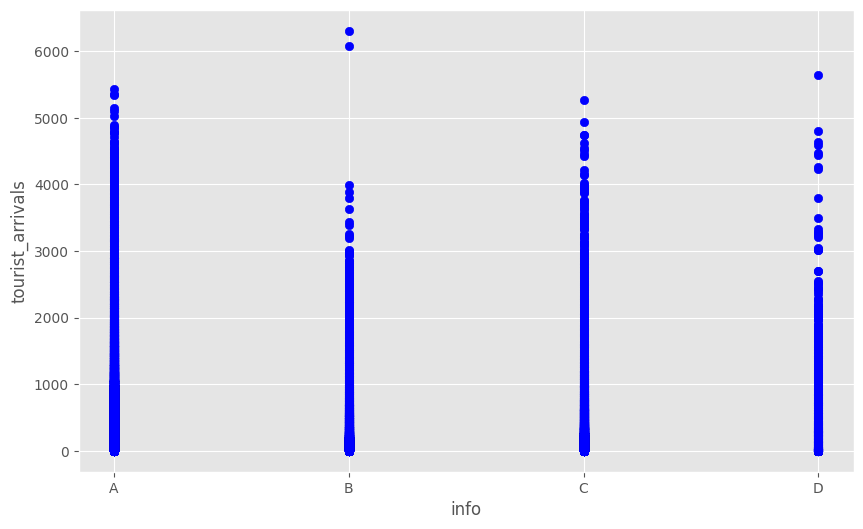

In [ ]:
# info
plt.figure(figsize = (10,6))
plt.scatter(train_df["info"], train_df["tourist_arrivals"], color='b')
plt.xlabel('info')
plt.ylabel('tourist_arrivals')
plt.show()

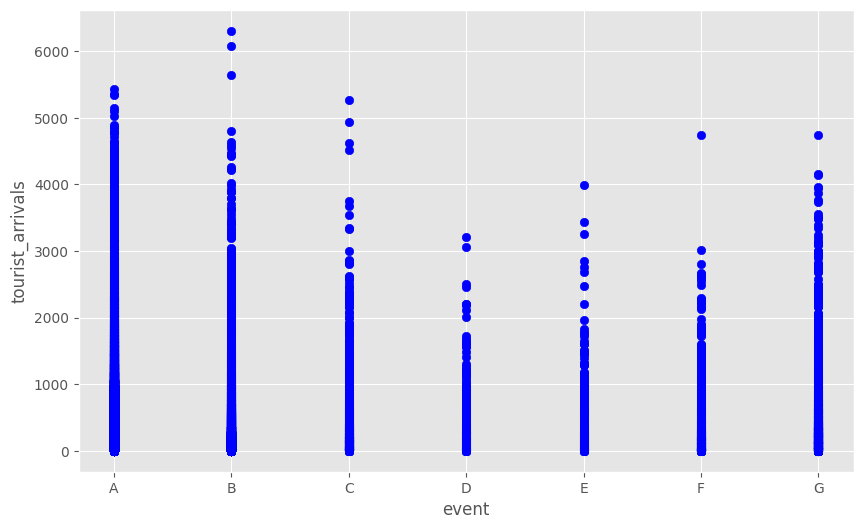

In [ ]:
# event
plt.figure(figsize = (10,6))
plt.scatter(train_df["event"], train_df["tourist_arrivals"], color='b')
plt.xlabel('event')
plt.ylabel('tourist_arrivals')
plt.show()

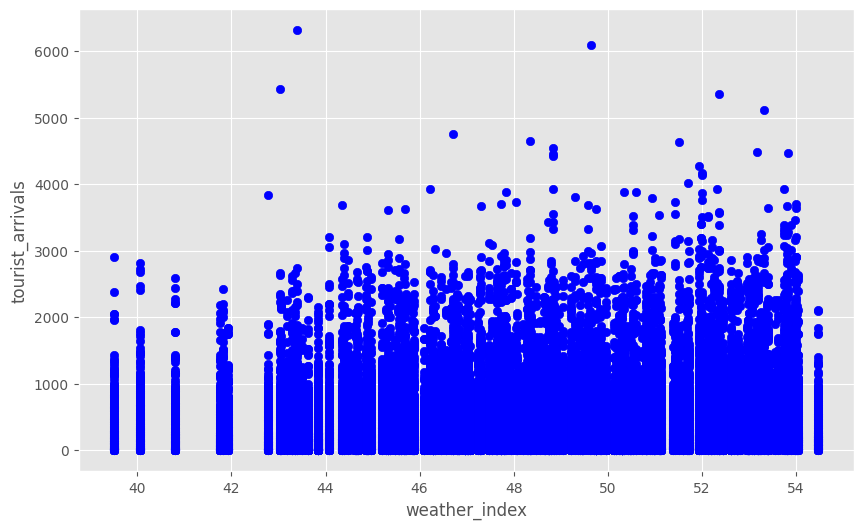

In [ ]:
# weather_index
plt.figure(figsize = (10,6))
plt.scatter(train_df["weather_index"], train_df["tourist_arrivals"], color='b')
plt.xlabel('weather_index')
plt.ylabel('tourist_arrivals')
plt.show()

# Biến đổi dữ liệu

In [ ]:
# tạo thêm đặc trưng year, month, day
train_df['year'] = train_df['date'].dt.year
train_df['month'] = train_df['date'].dt.month
train_df['day'] = train_df['date'].dt.day

test_df['year'] = test_df['date'].dt.year
test_df['month'] = test_df['date'].dt.month
test_df['day'] = test_df['date'].dt.day

In [ ]:
# Label Encoding cho các dữ liệu là object
category_list = train_df.columns[train_df.dtypes=='object'].values.tolist()
for category in category_list:
    train_df[category] = train_df[category].fillna('unknown')
    test_df[category] = test_df[category].fillna('unknown')
    # Label Encoder
    le_train = LabelEncoder()
    # fitting
    le_train = le_train.fit(train_df[category])
    # Encoding
    train_df[category] = le_train.transform(train_df[category])
    test_df[category] = le_train.transform(test_df[category])

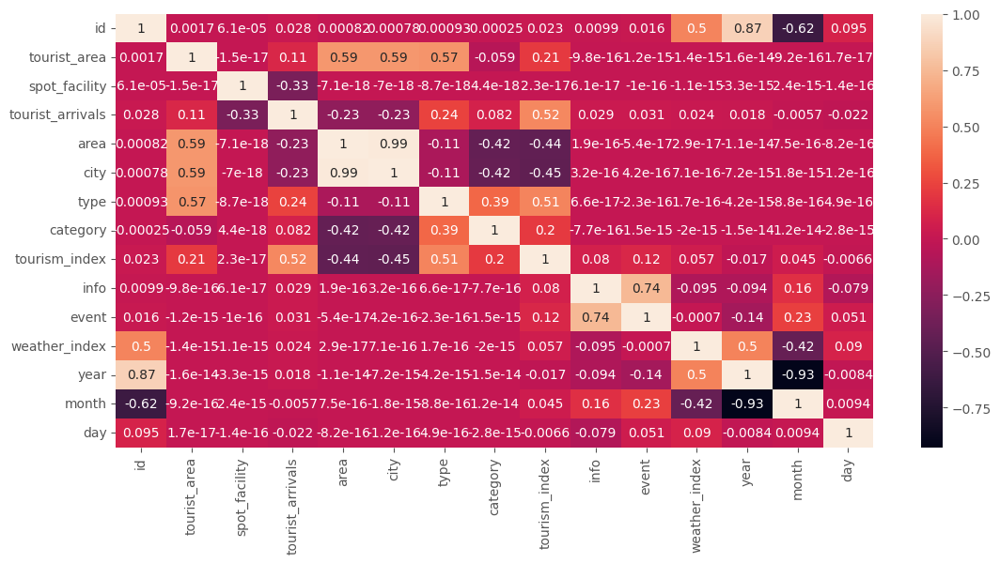

In [ ]:
# Tính toán ma trận tương quan
correlation_matrix = train_df.corr()

# Vẽ ma trận tương quan
plt.figure(figsize = (13,6))
sns.heatmap(correlation_matrix, annot=True)
plt.show()

In [ ]:
# Loại bỏ các giá trị bị thiếu của tourism_index
train_df = train_df.dropna(subset=['tourism_index'])
train_df

,id,date,tourist_area,spot_facility,tourist_arrivals,area,city,type,category,tourism_index,info,event,weather_index,year,month,day
0,0,2018-08-01,1,0,454,0,0,0,13,1750.0,0,0,40.05,2018,8,1
1,1,2018-08-01,1,1,823,0,0,0,13,1750.0,0,0,40.05,2018,8,1
2,2,2018-08-01,1,2,149,0,0,0,13,1750.0,0,0,40.05,2018,8,1
3,3,2018-08-01,1,3,157,0,0,0,13,1750.0,0,0,40.05,2018,8,1
4,4,2018-08-01,1,4,14,0,0,0,13,1750.0,0,0,40.05,2018,8,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132187,132187,2019-05-31,9,3,149,0,0,2,6,1998.0,0,0,48.29,2019,5,31
132188,132188,2019-05-31,9,4,56,0,0,2,6,1998.0,0,0,48.29,2019,5,31
132189,132189,2019-05-31,9,5,353,0,0,2,6,1998.0,0,0,48.29,2019,5,31
132190,132190,2019-05-31,9,6,35,0,0,2,6,1998.0,0,0,48.29,2019,5,31


# Tách dữ liệu thành train/valid data

In [ ]:
# Dữ liệu huấn luyện có thời gian từ 30/4/2019 trở về trước
train_hold_df = train_df[(train_df['date'] <= dt.datetime(2019,4,30))]

print(f'train_hold_df.shape = {train_hold_df.shape}')
train_hold_df.head()

train_hold_df.shape = (114808, 16)


,id,date,tourist_area,spot_facility,tourist_arrivals,area,city,type,category,tourism_index,info,event,weather_index,year,month,day
0,0,2018-08-01,1,0,454,0,0,0,13,1750.0,0,0,40.05,2018,8,1
1,1,2018-08-01,1,1,823,0,0,0,13,1750.0,0,0,40.05,2018,8,1
2,2,2018-08-01,1,2,149,0,0,0,13,1750.0,0,0,40.05,2018,8,1
3,3,2018-08-01,1,3,157,0,0,0,13,1750.0,0,0,40.05,2018,8,1
4,4,2018-08-01,1,4,14,0,0,0,13,1750.0,0,0,40.05,2018,8,1


In [ ]:
# Dữ liệu kiểm định có thời gian từ 1/5/2019 tới 31/5/2019
valid_hold_df = train_df[(train_df['date'] >= dt.datetime(2019,5,1)) & (train_df['date'] <= dt.datetime(2019,5,31))]

print(f'valid_hold_df.shape = {valid_hold_df.shape}')
valid_hold_df.head()

valid_hold_df.shape = (13392, 16)


,id,date,tourist_area,spot_facility,tourist_arrivals,area,city,type,category,tourism_index,info,event,weather_index,year,month,day
118800,118800,2019-05-01,1,0,116,0,0,0,13,481.0,2,1,48.83,2019,5,1
118801,118801,2019-05-01,1,1,326,0,0,0,13,481.0,2,1,48.83,2019,5,1
118802,118802,2019-05-01,1,2,52,0,0,0,13,481.0,2,1,48.83,2019,5,1
118803,118803,2019-05-01,1,3,67,0,0,0,13,481.0,2,1,48.83,2019,5,1
118804,118804,2019-05-01,1,4,7,0,0,0,13,481.0,2,1,48.83,2019,5,1


In [ ]:
# Dữ liệu huấn luyện
y_train_hold = train_hold_df['tourist_arrivals']
x_train_hold = train_hold_df.drop(['id', 'tourist_arrivals', 'date', 'weather_index'], axis=1)

# Dữ liệu kiểm định
y_valid_hold = valid_hold_df['tourist_arrivals']
x_valid_hold = valid_hold_df.drop(['id', 'tourist_arrivals', 'date', 'weather_index'], axis=1)

In [ ]:
x_train_hold

,tourist_area,spot_facility,area,city,type,category,tourism_index,info,event,year,month,day
0,1,0,0,0,0,13,1750.0,0,0,2018,8,1
1,1,1,0,0,0,13,1750.0,0,0,2018,8,1
2,1,2,0,0,0,13,1750.0,0,0,2018,8,1
3,1,3,0,0,0,13,1750.0,0,0,2018,8,1
4,1,4,0,0,0,13,1750.0,0,0,2018,8,1
...,...,...,...,...,...,...,...,...,...,...,...,...
118795,9,3,0,0,2,6,1962.0,0,0,2019,4,30
118796,9,4,0,0,2,6,1962.0,0,0,2019,4,30
118797,9,5,0,0,2,6,1962.0,0,0,2019,4,30
118798,9,6,0,0,2,6,1962.0,0,0,2019,4,30


# Lập mô hình với các tham số mặc định

## LightGBM

In [ ]:
# Xây dựng mô hình
model = LGBMRegressor(early_stopping_rounds=100)

# Fitting
model.fit(
        x_train_hold,
        y_train_hold,
        eval_set = [(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)]
)

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007796 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 435
[LightGBM] [Info] Number of data points in the train set: 114808, number of used features: 12
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score 357.880435
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[100]	training's l2: 13469.6	valid_1's l2: 11964.6


LGBMRegressor(early_stopping_rounds=100)

In [ ]:
# prediction của x_train_hold
y_pred_train_hold = model.predict(x_train_hold, num_iteration=model.best_iteration_)

# prediction của x_valid_hold
y_pred_valid_hold = model.predict(x_valid_hold, num_iteration=model.best_iteration_)

# RMSE
# tập huấn luyện
LGBM_rmse_train = np.sqrt(mean_squared_error(y_train_hold, y_pred_train_hold))

# tập kiểm định
LGBM_rmse_valid = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold))

print(f'\nRMSE(train)_LGBM = {LGBM_rmse_train:.4f}')
print(f'RMSE(valid)_LGBM = {LGBM_rmse_valid:.4f}\n')


RMSE(train)_LGBM = 116.0584
RMSE(valid)_LGBM = 109.3829



## XGBoost

In [ ]:
# Xây dựng mô hình
model_1 = XGBRegressor(early_stopping_rounds=100)

# Fitting
model_1.fit(
        x_train_hold,
        y_train_hold,
        eval_set = [(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)]
)

[0]	validation_0-rmse:341.76394	validation_1-rmse:337.33163
[1]	validation_0-rmse:269.49900	validation_1-rmse:263.46086
[2]	validation_0-rmse:223.16578	validation_1-rmse:215.21002
[3]	validation_0-rmse:193.14354	validation_1-rmse:184.19314
[4]	validation_0-rmse:172.92652	validation_1-rmse:163.05398
[5]	validation_0-rmse:160.05680	validation_1-rmse:149.67647
[6]	validation_0-rmse:151.26405	validation_1-rmse:140.03275
[7]	validation_0-rmse:146.09708	validation_1-rmse:135.36360
[8]	validation_0-rmse:141.56199	validation_1-rmse:131.49375
[9]	validation_0-rmse:138.21706	validation_1-rmse:128.36138
[10]	validation_0-rmse:136.07525	validation_1-rmse:126.81082
[11]	validation_0-rmse:134.63749	validation_1-rmse:125.95770
[12]	validation_0-rmse:132.16263	validation_1-rmse:123.43730
[13]	validation_0-rmse:130.85506	validation_1-rmse:122.59727
[14]	validation_0-rmse:130.23576	validation_1-rmse:122.67657
[15]	validation_0-rmse:128.00418	validation_1-rmse:121.12851
[16]	validation_0-rmse:126.60175	v

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=100,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
# prediction của x_train_hold
y_pred_train_hold_1 = model_1.predict(x_train_hold)

# prediction của x_valid_hold
y_pred_valid_hold_1 = model_1.predict(x_valid_hold)

# RMSE
# tập huấn luyện
XGB_rmse_train = np.sqrt(mean_squared_error(y_train_hold, y_pred_train_hold_1))

# tập kiểm định
XGB_rmse_valid = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold_1))

print(f'\nRMSE(train_data)_XGB = {XGB_rmse_train:.4f}')
print(f'RMSE(valid_data)_XGB = {XGB_rmse_valid:.4f}\n')


RMSE(train_data)_XGB = 98.4627
RMSE(valid_data)_XGB = 106.3468



## CatBoost

In [ ]:
# Xây dựng mô hình
model_0 = CatBoostRegressor(early_stopping_rounds=100)

# Fitting
model_0.fit(
        x_train_hold,
        y_train_hold,
        eval_set = [(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)]
)

Learning rate set to 0.107229
0:	learn: 417.0215600	test: 417.0215600	test1: 414.9744107	best: 414.9744107 (0)	total: 69.5ms	remaining: 1m 9s
1:	learn: 386.5236235	test: 386.5236235	test1: 384.1889443	best: 384.1889443 (1)	total: 86.9ms	remaining: 43.4s
2:	learn: 359.8704639	test: 359.8704639	test1: 357.0697876	best: 357.0697876 (2)	total: 104ms	remaining: 34.6s
3:	learn: 337.0266199	test: 337.0266199	test1: 333.8124432	best: 333.8124432 (3)	total: 121ms	remaining: 30.2s
4:	learn: 317.4798517	test: 317.4798517	test1: 313.6855048	best: 313.6855048 (4)	total: 138ms	remaining: 27.5s
5:	learn: 300.4202644	test: 300.4202644	test1: 296.0130491	best: 296.0130491 (5)	total: 155ms	remaining: 25.8s
6:	learn: 285.7802249	test: 285.7802249	test1: 280.8212789	best: 280.8212789 (6)	total: 172ms	remaining: 24.4s
7:	learn: 273.7816887	test: 273.7816887	test1: 268.2574911	best: 268.2574911 (7)	total: 194ms	remaining: 24s
8:	learn: 262.6668038	test: 262.6668038	test1: 256.4494025	best: 256.4494025 (8)	t

In [ ]:
# prediction của x_train_hold
y_pred_train_hold_0 = model_0.predict(x_train_hold)

# prediction của x_valid_hold
y_pred_valid_hold_0 = model_0.predict(x_valid_hold)

# RMSE
# tập huấn luyện
cat_rmse_train = np.sqrt(mean_squared_error(y_train_hold, y_pred_train_hold_0))

# tập kiểm định
cat_rmse_valid = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold_0))

print(f'\nRMSE(train_data)_cat = {cat_rmse_train:.4f}')
print(f'RMSE(valid_data)_cat = {cat_rmse_valid:.4f}\n')


RMSE(train_data)_cat = 100.8366
RMSE(valid_data)_cat = 102.6612



# Cải thiện mô hình

## Tạo các đặc trưng mới

In [ ]:
# Các ngày nghỉ lễ của Nhật
holiday = pd.Series(pd.date_range(start='2018-08-01',end='2019-07-31'))
holidays = pd.DataFrame({'holiday_name':holiday.apply(jpholiday.is_holiday_name),'date':holiday.values})
holidays = holidays[holidays['holiday_name'].notna()]
holidays['holiday'] = '1'
holidays['holiday'] = holidays['holiday'].astype('int64')
holidays = holidays.drop(['holiday_name'], axis=1)
holidays

,date,holiday
10,2018-08-11,1
47,2018-09-17,1
53,2018-09-23,1
54,2018-09-24,1
68,2018-10-08,1
94,2018-11-03,1
114,2018-11-23,1
144,2018-12-23,1
145,2018-12-24,1
153,2019-01-01,1


In [ ]:
# Hàm để thêm các đặc trưng mới vào tập dữ liệu
def DATE(df, holidays):
  '''
  đầu vào: dataframe, danh sách các ngày nghỉ lễ
  đầu ra: dataframe có các đặc trưng mới
  '''
  df['day_of_week'] = df['date'].dt.weekday
  df['day_of_year'] = df['date'].dt.dayofyear

  df['weekday'] = (df['day_of_week']<5)
  df['Monday'] = (df['day_of_week']==0)
  df['Tuesday'] = (df['day_of_week']==1)
  df['Wednesday'] = (df['day_of_week']==2)
  df['Thursday'] = (df['day_of_week']==3)
  df['Friday'] = (df['day_of_week']==4)
  df['Saturday'] = (df['day_of_week']==5)
  df['Sunday'] = (df['day_of_week']==6)

  df['Spring']=(df['month']>=3)&(df['month']<=5)
  df['Summer']=(df['month']>=6)&(df['month']<=8)
  df['Fall']=(df['month']>=9)&(df['month']<=11)
  df['Winter']=(df['month']>=12)|(df['month']<=2)

  df = pd.merge(df, holidays, on='date', how='left')
  df['holiday'] = df['holiday'].fillna(0)
  df.loc[df['day_of_week'] == 5, 'holiday'] = 1
  df.loc[df['day_of_week'] == 6, 'holiday'] = 1

  return df

In [ ]:
# Tập huấn luyện
train_df = DATE(train_df, holidays)
train_df

,id,date,tourist_area,spot_facility,tourist_arrivals,area,city,type,category,tourism_index,...,Wednesday,Thursday,Friday,Saturday,Sunday,Spring,Summer,Fall,Winter,holiday
0,0,2018-08-01,1,0,454,0,0,0,13,1750.0,...,True,False,False,False,False,False,True,False,False,0.0
1,1,2018-08-01,1,1,823,0,0,0,13,1750.0,...,True,False,False,False,False,False,True,False,False,0.0
2,2,2018-08-01,1,2,149,0,0,0,13,1750.0,...,True,False,False,False,False,False,True,False,False,0.0
3,3,2018-08-01,1,3,157,0,0,0,13,1750.0,...,True,False,False,False,False,False,True,False,False,0.0
4,4,2018-08-01,1,4,14,0,0,0,13,1750.0,...,True,False,False,False,False,False,True,False,False,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128195,132187,2019-05-31,9,3,149,0,0,2,6,1998.0,...,False,False,True,False,False,True,False,False,False,0.0
128196,132188,2019-05-31,9,4,56,0,0,2,6,1998.0,...,False,False,True,False,False,True,False,False,False,0.0
128197,132189,2019-05-31,9,5,353,0,0,2,6,1998.0,...,False,False,True,False,False,True,False,False,False,0.0
128198,132190,2019-05-31,9,6,35,0,0,2,6,1998.0,...,False,False,True,False,False,True,False,False,False,0.0


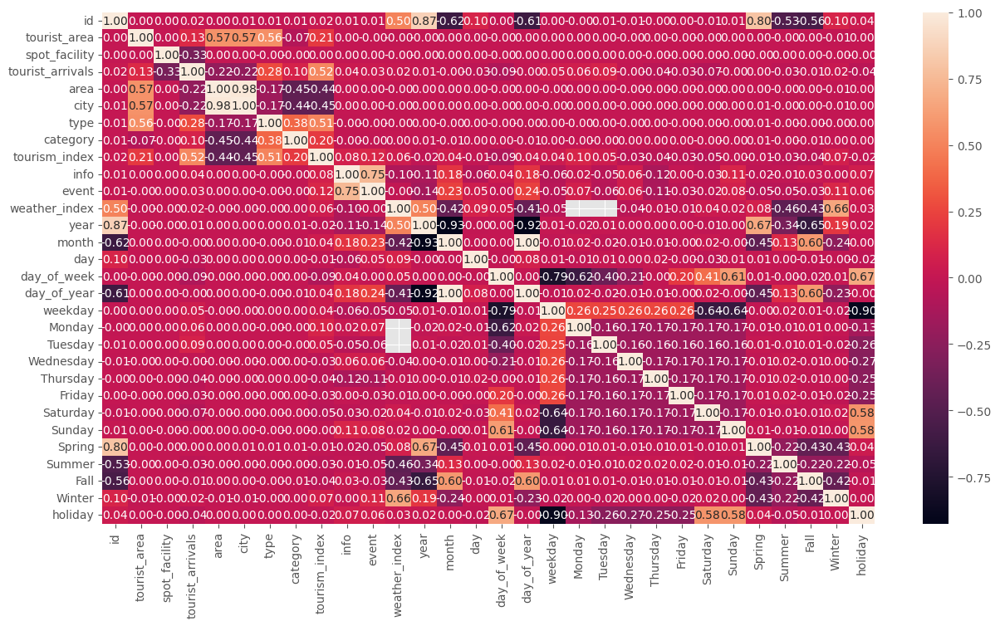

In [ ]:
# Tính toán ma trận tương quan
correlation_matrix_2 = train_df.corr()

# Vẽ ma trận tương quan
plt.figure(figsize = (15,8))
sns.heatmap(correlation_matrix_2, annot=True, fmt='.2f')
plt.show()

In [ ]:
correlation_matrix_2

,id,tourist_area,spot_facility,tourist_arrivals,area,city,type,category,tourism_index,info,...,Wednesday,Thursday,Friday,Saturday,Sunday,Spring,Summer,Fall,Winter,holiday
id,1.000000,3.392759e-03,6.107480e-05,0.016429,3.840690e-03,5.129437e-03,5.991549e-03,5.270689e-03,2.327124e-02,8.139334e-03,...,-5.333440e-03,-3.099354e-04,3.937707e-03,-8.761470e-03,7.797343e-03,7.978880e-01,-5.256148e-01,-5.631077e-01,1.007303e-01,4.302023e-02
tourist_area,0.003393,1.000000e+00,7.928775e-18,0.133587,5.672209e-01,5.663212e-01,5.550470e-01,-7.027793e-02,2.059396e-01,1.284026e-04,...,-1.199554e-04,1.598239e-04,-1.199554e-04,-1.448822e-04,3.696022e-05,3.344537e-03,-5.659403e-04,2.425890e-03,-5.447677e-03,6.955543e-04
spot_facility,0.000061,7.928775e-18,1.000000e+00,-0.333722,7.298113e-18,5.424107e-18,-2.690457e-18,-1.674207e-17,2.343964e-17,1.410439e-16,...,1.514821e-18,-7.314870e-17,-3.614913e-19,-1.055989e-17,-3.117387e-17,-1.844802e-15,3.680903e-16,2.062463e-15,-4.345666e-16,-8.557442e-17
tourist_arrivals,0.016429,1.335870e-01,-3.337223e-01,1.000000,-2.166182e-01,-2.188840e-01,2.771828e-01,9.526151e-02,5.197515e-01,3.636320e-02,...,-4.849954e-03,-4.405931e-02,-3.139980e-02,-6.868232e-02,-1.792024e-03,3.833373e-03,-2.579818e-02,-1.020717e-02,2.336613e-02,-4.075681e-02
area,0.003841,5.672209e-01,7.298113e-18,-0.216618,1.000000e+00,9.843215e-01,-1.721876e-01,-4.481810e-01,-4.424618e-01,1.032420e-03,...,-2.324245e-04,-7.604208e-05,-2.324245e-04,-1.507035e-04,1.707501e-04,4.460786e-03,-6.907325e-04,2.035184e-03,-6.107405e-03,1.018125e-03
city,0.005129,5.663212e-01,5.424107e-18,-0.218884,9.843215e-01,1.000000e+00,-1.676988e-01,-4.402653e-01,-4.504967e-01,1.428044e-03,...,-2.606270e-04,-1.335693e-04,-2.606270e-04,-1.246385e-04,1.926166e-04,5.254097e-03,-8.930317e-04,7.111229e-04,-5.454426e-03,1.105779e-03
type,0.005992,5.550470e-01,-2.690457e-18,0.277183,-1.721876e-01,-1.676988e-01,1.000000e+00,3.786110e-01,5.085077e-01,-9.133414e-04,...,-4.210032e-05,3.153880e-04,-4.210032e-05,-2.207480e-04,-2.284378e-05,6.443637e-03,-1.335028e-03,-1.645028e-03,-4.012781e-03,7.421625e-04
category,0.005271,-7.027793e-02,-1.674207e-17,0.095262,-4.481810e-01,-4.402653e-01,3.786110e-01,1.000000e+00,2.027160e-01,-1.868752e-03,...,1.502975e-04,1.440684e-04,1.502975e-04,-1.339002e-04,-7.328497e-05,5.439986e-03,-1.275909e-03,-6.228550e-03,1.552121e-03,1.828064e-04
tourism_index,0.023271,2.059396e-01,2.343964e-17,0.519752,-4.424618e-01,-4.504967e-01,5.085077e-01,2.027160e-01,1.000000e+00,7.996353e-02,...,-3.195745e-02,-4.120677e-02,-3.085448e-02,-4.925514e-02,-9.201875e-04,-8.608315e-03,-3.430575e-02,-4.176508e-02,7.318592e-02,-1.552045e-02
info,0.008139,1.284026e-04,1.410439e-16,0.036363,1.032420e-03,1.428044e-03,-9.133414e-04,-1.868752e-03,7.996353e-02,1.000000e+00,...,6.163883e-02,-1.150528e-01,2.336417e-03,-2.709926e-02,1.062190e-01,-2.176929e-02,-1.012772e-02,2.802482e-02,7.533841e-04,6.574318e-02


In [ ]:
# Tập kiểm tra
test_df = DATE(test_df, holidays)
test_df.head()

,id,date,tourist_area,spot_facility,area,city,type,category,tourism_index,info,...,Wednesday,Thursday,Friday,Saturday,Sunday,Spring,Summer,Fall,Winter,holiday
0,145584,2019-07-01,1,0,0,0,0,13,1362,0,...,False,False,False,False,False,False,True,False,False,0.0
1,145585,2019-07-01,1,1,0,0,0,13,1362,0,...,False,False,False,False,False,False,True,False,False,0.0
2,145586,2019-07-01,1,2,0,0,0,13,1362,0,...,False,False,False,False,False,False,True,False,False,0.0
3,145587,2019-07-01,1,3,0,0,0,13,1362,0,...,False,False,False,False,False,False,True,False,False,0.0
4,145588,2019-07-01,1,4,0,0,0,13,1362,0,...,False,False,False,False,False,False,True,False,False,0.0


### Tách dữ liệu mới thành train/valid data

In [ ]:
# Dữ liệu huấn luyện có thời gian từ 30/4/2019 trở về trước
train_hold_df = train_df[(train_df['date'] <= dt.datetime(2019,4,30))]

print(f'train_hold_df.shape = {train_hold_df.shape}')
train_hold_df.head()

train_hold_df.shape = (114808, 31)


,id,date,tourist_area,spot_facility,tourist_arrivals,area,city,type,category,tourism_index,...,Wednesday,Thursday,Friday,Saturday,Sunday,Spring,Summer,Fall,Winter,holiday
0,0,2018-08-01,1,0,454,0,0,0,13,1750.0,...,True,False,False,False,False,False,True,False,False,0.0
1,1,2018-08-01,1,1,823,0,0,0,13,1750.0,...,True,False,False,False,False,False,True,False,False,0.0
2,2,2018-08-01,1,2,149,0,0,0,13,1750.0,...,True,False,False,False,False,False,True,False,False,0.0
3,3,2018-08-01,1,3,157,0,0,0,13,1750.0,...,True,False,False,False,False,False,True,False,False,0.0
4,4,2018-08-01,1,4,14,0,0,0,13,1750.0,...,True,False,False,False,False,False,True,False,False,0.0


In [ ]:
# Dữ liệu kiểm định có thời gian từ 1/5/2019 tới 31/5/2019
valid_hold_df = train_df[(train_df['date'] >= dt.datetime(2019,5,1)) & (train_df['date'] <= dt.datetime(2019,5,31))]

print(f'valid_hold_df.shape = {valid_hold_df.shape}')
valid_hold_df.head()

valid_hold_df.shape = (13392, 31)


,id,date,tourist_area,spot_facility,tourist_arrivals,area,city,type,category,tourism_index,...,Wednesday,Thursday,Friday,Saturday,Sunday,Spring,Summer,Fall,Winter,holiday
114808,118800,2019-05-01,1,0,116,0,0,0,13,481.0,...,True,False,False,False,False,True,False,False,False,1.0
114809,118801,2019-05-01,1,1,326,0,0,0,13,481.0,...,True,False,False,False,False,True,False,False,False,1.0
114810,118802,2019-05-01,1,2,52,0,0,0,13,481.0,...,True,False,False,False,False,True,False,False,False,1.0
114811,118803,2019-05-01,1,3,67,0,0,0,13,481.0,...,True,False,False,False,False,True,False,False,False,1.0
114812,118804,2019-05-01,1,4,7,0,0,0,13,481.0,...,True,False,False,False,False,True,False,False,False,1.0


In [ ]:
# Tập huấn luyện
y_train_hold = train_hold_df['tourist_arrivals']
x_train_hold = train_hold_df.drop(['id', 'tourist_arrivals', 'date', 'weather_index'], axis=1)

# Tập kiểm định
y_valid_hold = valid_hold_df['tourist_arrivals']
x_valid_hold = valid_hold_df.drop(['id', 'tourist_arrivals', 'date', 'weather_index'], axis=1)

### Huấn luyện lại mô hình sau khi thêm đặc trưng mới

#### LightGBM

In [ ]:
# Xây dựng mô hình
model_new = LGBMRegressor(early_stopping_rounds=100)

# Fitting
model_new.fit(
        x_train_hold,
        y_train_hold,
        eval_set = [(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)]
)

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020852 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 720
[LightGBM] [Info] Number of data points in the train set: 114808, number of used features: 27
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score 357.880435
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[100]	training's l2: 8701.65	valid_1's l2: 9126.36


LGBMRegressor(early_stopping_rounds=100)

In [ ]:
# prediction của x_train_hold
y_pred_train_hold_new = model_new.predict(x_train_hold, num_iteration=model_new.best_iteration_)

# prediction của x_valid_hold
y_pred_valid_hold_new = model_new.predict(x_valid_hold, num_iteration=model_new.best_iteration_)

# RMSE
# tập huấn luyện
LGBM_rmse_train_new = np.sqrt(mean_squared_error(y_train_hold, y_pred_train_hold_new))

# tập kiểm định
LGBM_rmse_valid_new = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold_new))

print(f'\nRMSE(train)_LGBM_new = {LGBM_rmse_train_new:.4f}')
print(f'RMSE(valid)_LGBM_new = {LGBM_rmse_valid_new:.4f}\n')


RMSE(train)_LGBM_new = 93.2826
RMSE(valid)_LGBM_new = 95.5320



#### XGBoost

In [ ]:
# Xây dựng mô hình
model_1_new = XGBRegressor(early_stopping_rounds=100)
# Fitting
model_1_new.fit(
        x_train_hold,
        y_train_hold,
        eval_set = [(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)]
)

[0]	validation_0-rmse:340.49718	validation_1-rmse:337.38630
[1]	validation_0-rmse:266.52834	validation_1-rmse:260.75405
[2]	validation_0-rmse:217.95696	validation_1-rmse:212.76085
[3]	validation_0-rmse:186.24523	validation_1-rmse:179.66916
[4]	validation_0-rmse:162.20336	validation_1-rmse:156.63893
[5]	validation_0-rmse:149.32400	validation_1-rmse:144.52648
[6]	validation_0-rmse:139.81827	validation_1-rmse:134.76764
[7]	validation_0-rmse:132.48232	validation_1-rmse:128.26741
[8]	validation_0-rmse:126.93044	validation_1-rmse:124.11614
[9]	validation_0-rmse:123.55114	validation_1-rmse:121.88163
[10]	validation_0-rmse:120.85751	validation_1-rmse:120.18401
[11]	validation_0-rmse:118.73552	validation_1-rmse:118.34106
[12]	validation_0-rmse:116.73848	validation_1-rmse:116.39523
[13]	validation_0-rmse:114.65315	validation_1-rmse:115.82853
[14]	validation_0-rmse:113.60012	validation_1-rmse:114.51340
[15]	validation_0-rmse:112.39365	validation_1-rmse:113.71501
[16]	validation_0-rmse:111.49529	v

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=100,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
# prediction của x_train_hold
y_pred_train_hold_1_new = model_1_new.predict(x_train_hold)

# prediction của x_valid_hold
y_pred_valid_hold_1_new = model_1_new.predict(x_valid_hold)

# RMSE
# tập huấn luyện
XGB_rmse_train_new = np.sqrt(mean_squared_error(y_train_hold, y_pred_train_hold_1_new))

# tập kiểm định
XGB_rmse_valid_new = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold_1_new))

print(f'\nRMSE(train_data)_XGB_new = {XGB_rmse_train_new:.4f}')
print(f'RMSE(valid_data)_XGB_new = {XGB_rmse_valid_new:.4f}\n')


RMSE(train_data)_XGB_new = 73.0848
RMSE(valid_data)_XGB_new = 87.6590



#### CatBoost

In [ ]:
# Xây dựng mô hình
model_0_new = CatBoostRegressor(early_stopping_rounds=100)
# Fitting
model_0_new.fit(
        x_train_hold,
        y_train_hold,
        eval_set = [(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)]
)

Learning rate set to 0.107229
0:	learn: 416.9912187	test: 416.9912187	test1: 414.9260483	best: 414.9260483 (0)	total: 27.4ms	remaining: 27.4s
1:	learn: 386.3307012	test: 386.3307012	test1: 383.8400441	best: 383.8400441 (1)	total: 47.9ms	remaining: 23.9s
2:	learn: 360.2540090	test: 360.2540090	test1: 357.6698166	best: 357.6698166 (2)	total: 67.9ms	remaining: 22.6s
3:	learn: 337.3338727	test: 337.3338727	test1: 334.1972836	best: 334.1972836 (3)	total: 88.9ms	remaining: 22.1s
4:	learn: 317.5488809	test: 317.5488809	test1: 313.7598620	best: 313.7598620 (4)	total: 109ms	remaining: 21.7s
5:	learn: 299.9737373	test: 299.9737373	test1: 295.5993815	best: 295.5993815 (5)	total: 128ms	remaining: 21.1s
6:	learn: 285.1665386	test: 285.1665386	test1: 280.6785804	best: 280.6785804 (6)	total: 153ms	remaining: 21.6s
7:	learn: 272.5561148	test: 272.5561148	test1: 267.9369880	best: 267.9369880 (7)	total: 172ms	remaining: 21.3s
8:	learn: 261.6449355	test: 261.6449355	test1: 256.5231208	best: 256.5231208 (

In [ ]:
# prediction của x_train_hold
y_pred_train_hold_0_new = model_0_new.predict(x_train_hold)

# prediction của x_valid_hold
y_pred_valid_hold_0_new = model_0_new.predict(x_valid_hold)

# RMSE
# tập huấn luyện
cat_rmse_train_new = np.sqrt(mean_squared_error(y_train_hold, y_pred_train_hold_0_new))

# tập kiểm định
cat_rmse_valid_new = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold_0_new))

print(f'\nRMSE(train_data)_cat_new = {cat_rmse_train_new:.4f}')
print(f'RMSE(valid_data)_cat_new = {cat_rmse_valid_new:.4f}\n')


RMSE(train_data)_cat_new = 71.4610
RMSE(valid_data)_cat_new = 84.9158



## Tinh chỉnh các tham số

### LightGBM

#### Tuning_1

In [ ]:
# Thiết lập tham số cho mô hình
tuning_1_params = {
    'subsample': 0.5,
    'learning_rate': 0.05,
    'num_iterations' : 300,
    'max_depth' : 10,
}
tuning_1_params

{'subsample': 0.5,
 'learning_rate': 0.05,
 'num_iterations': 300,
 'max_depth': 10}

In [ ]:
# Xây dựng mô hình với tham số tuning_1_params
model_2 = LGBMRegressor(**tuning_1_params, early_stopping_rounds=100)

# Fitting
model_2.fit(
        x_train_hold,
        y_train_hold,
        eval_set = [(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)]
)

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 720
[LightGBM] [Info] Number of data points in the train set: 114808, number of used features: 27
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. 

LGBMRegressor(early_stopping_rounds=100, learning_rate=0.05, max_depth=10,
              num_iterations=300, subsample=0.5)

In [ ]:
# prediction của x_train_hold
y_pred_train_hold_2 = model_2.predict(x_train_hold, num_iteration=model_2.best_iteration_)

# prediction của x_valid_hold
y_pred_valid_hold_2 = model_2.predict(x_valid_hold, num_iteration=model_2.best_iteration_)

# RMSE
# tập huấn luyện
LGBM_rmse_train_2 = np.sqrt(mean_squared_error(y_train_hold, y_pred_train_hold_2))

# tập kiểm định
LGBM_rmse_valid_2 = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold_2))

print(f'\nRMSE(train)_LGBM_tuning_1 = {LGBM_rmse_train_2:.4f}')
print(f'RMSE(valid)_LGBM_tuning_1 = {LGBM_rmse_valid_2:.4f}\n')

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).

RMSE(train)_LGBM_tuning_1 = 86.3057
RMSE(valid)_LGBM_tuning_1 = 91.5148



#### Tuning_2

In [ ]:
# Thiết lập tham số cho mô hình
tuning_2_params = {
    'subsample': 0.9,
    'learning_rate': 0.2,
    'num_iterations' : 200,
    'max_depth' : 5,
}
tuning_2_params

{'subsample': 0.9, 'learning_rate': 0.2, 'num_iterations': 200, 'max_depth': 5}

In [ ]:
# Xây dựng mô hình với tham số tuning_2_params
model_4 = LGBMRegressor(**tuning_2_params, early_stopping_rounds=100)

# Fitting
model_4.fit(
        x_train_hold,
        y_train_hold,
        eval_set = [(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)]
)

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011929 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 720
[LightGBM] [Info] Number of data points in the train set: 114808, number of used features: 27
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. 

LGBMRegressor(early_stopping_rounds=100, learning_rate=0.2, max_depth=5,
              num_iterations=200, subsample=0.9)

In [ ]:
# prediction của x_train_hold
y_pred_train_hold_4 = model_4.predict(x_train_hold, num_iteration=model_4.best_iteration_)

# prediction của x_valid_hold
y_pred_valid_hold_4 = model_4.predict(x_valid_hold, num_iteration=model_4.best_iteration_)

# RMSE
# tập huấn luyện
LGBM_rmse_train_4 = np.sqrt(mean_squared_error(y_train_hold, y_pred_train_hold_4))

# tập kiểm định
LGBM_rmse_valid_4 = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold_4))

print(f'\nRMSE(train)_LGBM_tuning_2 = {LGBM_rmse_train_4:.4f}')
print(f'RMSE(valid)_LGBM_tuning_2 = {LGBM_rmse_valid_4:.4f}\n')

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).

RMSE(train)_LGBM_tuning_2 = 83.5161
RMSE(valid)_LGBM_tuning_2 = 87.8999



#### Tuning_optuna

In [ ]:
# Xác định hàm objective cần tối ưu hóa
def objective(trial):
  # Xác định các siêu tham số
  param = {
      'subsample': trial.suggest_float('subsample', 0.5, 1),
      'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.5, log=True),
      'num_iterations': trial.suggest_int('num_iterations', 100, 5000),
      'max_depth' : trial.suggest_int('max_depth', 5, 50)
  }
  # Tạo mô hình LightGBM với các siêu tham số đã đề xuất
  model = LGBMRegressor(**param, early_stopping_rounds = 100, verbose=0)
  # Huấn luyện mô hình
  model.fit(x_train_hold, y_train_hold, eval_set=[(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)])
  y_pred_valid_hold = model.predict(x_valid_hold, num_iteration=model.best_iteration_)
  # Tính RMSE của tập kiểm định
  rmse = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold))
  return rmse
# Tối ưu hóa
study = optuna.create_study(direction='minimize', study_name='Optimize hyperparameters')
study.optimize(objective, n_trials=100)
# In ra siêu tham số tốt nhất
print('Best trial:', study.best_trial.params)
optuna_lgbm_params = study.best_trial.params

[I 2023-12-18 09:16:04,667] A new study created in memory with name: Optimize hyperparameters


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:16:10,528] Trial 0 finished with value: 79.58608544380166 and parameters: {'subsample': 0.5957594670768838, 'learning_rate': 0.08047147284753471, 'num_iterations': 923, 'max_depth': 43}. Best is trial 0 with value: 79.58608544380166.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:16:31,736] Trial 1 finished with value: 81.03498539488675 and parameters: {'subsample': 0.8532413771905071, 'learning_rate': 0.018615173028315654, 'num_iterations': 3923, 'max_depth': 39}. Best is trial 0 with value: 79.58608544380166.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:16:37,894] Trial 2 finished with value: 78.69999174895968 and parameters: {'subsample': 0.8703824638078237, 'learning_rate': 0.1680836023287655, 'num_iterations': 2039, 'max_depth': 35}. Best is trial 2 with value: 78.69999174895968.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:16:55,595] Trial 3 finished with value: 77.67957111800285 and parameters: {'subsample': 0.8280467724080269, 'learning_rate': 0.06022386933351193, 'num_iterations': 3383, 'max_depth': 49}. Best is trial 3 with value: 77.67957111800285.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:17:13,383] Trial 4 finished with value: 81.06920802550617 and parameters: {'subsample': 0.5765271493524966, 'learning_rate': 0.02376849631376314, 'num_iterations': 2939, 'max_depth': 41}. Best is trial 3 with value: 77.67957111800285.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:17:21,088] Trial 5 finished with value: 80.17035544039781 and parameters: {'subsample': 0.534513827965543, 'learning_rate': 0.06722491755133941, 'num_iterations': 871, 'max_depth': 30}. Best is trial 3 with value: 77.67957111800285.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:17:28,505] Trial 6 finished with value: 78.63702745625731 and parameters: {'subsample': 0.5708124982224946, 'learning_rate': 0.08222539775488931, 'num_iterations': 1898, 'max_depth': 30}. Best is trial 3 with value: 77.67957111800285.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:17:33,064] Trial 7 finished with value: 81.46735621476576 and parameters: {'subsample': 0.9601804886688614, 'learning_rate': 0.4632786311103131, 'num_iterations': 1670, 'max_depth': 48}. Best is trial 3 with value: 77.67957111800285.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:17:42,509] Trial 8 finished with value: 92.83816076542308 and parameters: {'subsample': 0.6961730185898612, 'learning_rate': 0.01933601187734318, 'num_iterations': 702, 'max_depth': 21}. Best is trial 3 with value: 77.67957111800285.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:17:47,346] Trial 9 finished with value: 79.73009103501114 and parameters: {'subsample': 0.7862628068549417, 'learning_rate': 0.2602604777207239, 'num_iterations': 578, 'max_depth': 43}. Best is trial 3 with value: 77.67957111800285.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[I 2023-12-18 09:18:11,149] Trial 10 finished with value: 83.40499609353193 and parameters: {'subsample': 0.9854959714367609, 'learning_rate': 0.03787094356531042, 'num_iterations': 4720, 'max_depth': 5}. Best is trial 3 with value: 77.67957111800285.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:18:26,445] Trial 11 finished with value: 78.7780506426746 and parameters: {'subsample': 0.674455930804194, 'learning_rate': 0.07158257797229797, 'num_iterations': 3089, 'max_depth': 22}. Best is trial 3 with value: 77.67957111800285.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:18:35,581] Trial 12 finished with value: 79.28744074059601 and parameters: {'subsample': 0.7619503614386303, 'learning_rate': 0.12477369866155628, 'num_iterations': 3652, 'max_depth': 14}. Best is trial 3 with value: 77.67957111800285.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:18:51,780] Trial 13 finished with value: 78.89412850543773 and parameters: {'subsample': 0.6703267472693496, 'learning_rate': 0.038703734457751375, 'num_iterations': 2207, 'max_depth': 49}. Best is trial 3 with value: 77.67957111800285.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:19:05,960] Trial 14 finished with value: 88.48678477782163 and parameters: {'subsample': 0.8398974800155198, 'learning_rate': 0.011839715675735484, 'num_iterations': 1527, 'max_depth': 29}. Best is trial 3 with value: 77.67957111800285.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:19:28,953] Trial 15 finished with value: 78.05146686065305 and parameters: {'subsample': 0.920795015524678, 'learning_rate': 0.049331031970107284, 'num_iterations': 4918, 'max_depth': 34}. Best is trial 3 with value: 77.67957111800285.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:19:54,140] Trial 16 finished with value: 78.49843049417966 and parameters: {'subsample': 0.9244447107529646, 'learning_rate': 0.04082328068953182, 'num_iterations': 4902, 'max_depth': 36}. Best is trial 3 with value: 77.67957111800285.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:20:02,345] Trial 17 finished with value: 77.56406530362426 and parameters: {'subsample': 0.9099193446175572, 'learning_rate': 0.1341148842363106, 'num_iterations': 4188, 'max_depth': 50}. Best is trial 17 with value: 77.56406530362426.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:20:08,644] Trial 18 finished with value: 80.31808619341922 and parameters: {'subsample': 0.7843806029168339, 'learning_rate': 0.16063309122433192, 'num_iterations': 4115, 'max_depth': 50}. Best is trial 17 with value: 77.56406530362426.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:20:12,580] Trial 19 finished with value: 81.17035421243922 and parameters: {'subsample': 0.8976786144789465, 'learning_rate': 0.25325207003973815, 'num_iterations': 3203, 'max_depth': 45}. Best is trial 17 with value: 77.56406530362426.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:20:20,621] Trial 20 finished with value: 80.62946200191173 and parameters: {'subsample': 0.8190519038033823, 'learning_rate': 0.12751055116455443, 'num_iterations': 4338, 'max_depth': 23}. Best is trial 17 with value: 77.56406530362426.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:20:39,777] Trial 21 finished with value: 78.60780094343667 and parameters: {'subsample': 0.9357778557122144, 'learning_rate': 0.05087673449147711, 'num_iterations': 4500, 'max_depth': 35}. Best is trial 17 with value: 77.56406530362426.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:21:06,394] Trial 22 finished with value: 78.87030586216811 and parameters: {'subsample': 0.8923290245743014, 'learning_rate': 0.028723187178175593, 'num_iterations': 3656, 'max_depth': 46}. Best is trial 17 with value: 77.56406530362426.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:21:15,571] Trial 23 finished with value: 81.71117452579446 and parameters: {'subsample': 0.9985987540406007, 'learning_rate': 0.0559228370280066, 'num_iterations': 4993, 'max_depth': 38}. Best is trial 17 with value: 77.56406530362426.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:21:20,963] Trial 24 finished with value: 80.34422590844203 and parameters: {'subsample': 0.7277379207101353, 'learning_rate': 0.12152981122137026, 'num_iterations': 3544, 'max_depth': 50}. Best is trial 17 with value: 77.56406530362426.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:21:28,547] Trial 25 finished with value: 79.36422440750923 and parameters: {'subsample': 0.8208633189753618, 'learning_rate': 0.2421216373802825, 'num_iterations': 2718, 'max_depth': 16}. Best is trial 17 with value: 77.56406530362426.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:21:41,013] Trial 26 finished with value: 78.18037007911317 and parameters: {'subsample': 0.9225831491575707, 'learning_rate': 0.09055264210640528, 'num_iterations': 4220, 'max_depth': 33}. Best is trial 17 with value: 77.56406530362426.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:22:05,359] Trial 27 finished with value: 78.70967225677205 and parameters: {'subsample': 0.8851131055488805, 'learning_rate': 0.04737169096590869, 'num_iterations': 4608, 'max_depth': 43}. Best is trial 17 with value: 77.56406530362426.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:22:19,159] Trial 28 finished with value: 82.3387463646644 and parameters: {'subsample': 0.9576125826573081, 'learning_rate': 0.02990197292217724, 'num_iterations': 3947, 'max_depth': 47}. Best is trial 17 with value: 77.56406530362426.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:22:23,648] Trial 29 finished with value: 81.51635357982794 and parameters: {'subsample': 0.8095940308229261, 'learning_rate': 0.09878508041127572, 'num_iterations': 3391, 'max_depth': 26}. Best is trial 17 with value: 77.56406530362426.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:22:30,050] Trial 30 finished with value: 78.90507367664189 and parameters: {'subsample': 0.8582747680347563, 'learning_rate': 0.19239550566873798, 'num_iterations': 2480, 'max_depth': 41}. Best is trial 17 with value: 77.56406530362426.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:22:44,556] Trial 31 finished with value: 77.4316822880869 and parameters: {'subsample': 0.9203637450355753, 'learning_rate': 0.09385853445499472, 'num_iterations': 4286, 'max_depth': 33}. Best is trial 31 with value: 77.4316822880869.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:22:46,818] Trial 32 finished with value: 96.40914736758965 and parameters: {'subsample': 0.9057290574321661, 'learning_rate': 0.0704000100497157, 'num_iterations': 143, 'max_depth': 32}. Best is trial 31 with value: 77.4316822880869.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:22:55,850] Trial 33 finished with value: 78.38991580006129 and parameters: {'subsample': 0.9508009782500985, 'learning_rate': 0.10532163659799641, 'num_iterations': 3919, 'max_depth': 38}. Best is trial 31 with value: 77.4316822880869.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:23:04,175] Trial 34 finished with value: 79.12529105804242 and parameters: {'subsample': 0.8680825200421547, 'learning_rate': 0.16119662653760072, 'num_iterations': 4433, 'max_depth': 26}. Best is trial 31 with value: 77.4316822880869.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:23:20,294] Trial 35 finished with value: 78.60800935076283 and parameters: {'subsample': 0.8453554793375271, 'learning_rate': 0.05652230127073502, 'num_iterations': 3944, 'max_depth': 41}. Best is trial 31 with value: 77.4316822880869.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:23:24,534] Trial 36 finished with value: 80.71231202413986 and parameters: {'subsample': 0.9812602142605107, 'learning_rate': 0.34445922171346466, 'num_iterations': 4695, 'max_depth': 44}. Best is trial 31 with value: 77.4316822880869.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:23:38,275] Trial 37 finished with value: 78.46390323469826 and parameters: {'subsample': 0.9154982340096159, 'learning_rate': 0.06318567948203942, 'num_iterations': 3373, 'max_depth': 33}. Best is trial 31 with value: 77.4316822880869.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:23:52,942] Trial 38 finished with value: 77.35540283474212 and parameters: {'subsample': 0.874546072864161, 'learning_rate': 0.08588030747867689, 'num_iterations': 4218, 'max_depth': 39}. Best is trial 38 with value: 77.35540283474212.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:24:02,848] Trial 39 finished with value: 78.99587762298368 and parameters: {'subsample': 0.7934734902905076, 'learning_rate': 0.08269310001376441, 'num_iterations': 2868, 'max_depth': 39}. Best is trial 38 with value: 77.35540283474212.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:24:09,578] Trial 40 finished with value: 79.40496131967049 and parameters: {'subsample': 0.7451960467023288, 'learning_rate': 0.13920783549559787, 'num_iterations': 3784, 'max_depth': 47}. Best is trial 38 with value: 77.35540283474212.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:24:21,566] Trial 41 finished with value: 78.57219023779926 and parameters: {'subsample': 0.8754644274760944, 'learning_rate': 0.07879938969136215, 'num_iterations': 4199, 'max_depth': 36}. Best is trial 38 with value: 77.35540283474212.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:24:28,144] Trial 42 finished with value: 79.48481372541481 and parameters: {'subsample': 0.9398030162046798, 'learning_rate': 0.10695063584830293, 'num_iterations': 4411, 'max_depth': 41}. Best is trial 38 with value: 77.35540283474212.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:24:35,116] Trial 43 finished with value: 78.45734811751204 and parameters: {'subsample': 0.9708665585267033, 'learning_rate': 0.19885491796577703, 'num_iterations': 4830, 'max_depth': 31}. Best is trial 38 with value: 77.35540283474212.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:24:46,495] Trial 44 finished with value: 82.64534801685885 and parameters: {'subsample': 0.8386604024518336, 'learning_rate': 0.032436258697925234, 'num_iterations': 4202, 'max_depth': 28}. Best is trial 38 with value: 77.35540283474212.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:24:58,301] Trial 45 finished with value: 79.78263824692279 and parameters: {'subsample': 0.8685181149066172, 'learning_rate': 0.04558803876298394, 'num_iterations': 4647, 'max_depth': 35}. Best is trial 38 with value: 77.35540283474212.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:25:17,417] Trial 46 finished with value: 81.94378467717287 and parameters: {'subsample': 0.5209125111453732, 'learning_rate': 0.02138783380283533, 'num_iterations': 3834, 'max_depth': 43}. Best is trial 38 with value: 77.35540283474212.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:25:30,829] Trial 47 finished with value: 78.85599486476792 and parameters: {'subsample': 0.6292379557631416, 'learning_rate': 0.06329672849948953, 'num_iterations': 4064, 'max_depth': 48}. Best is trial 38 with value: 77.35540283474212.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:25:54,993] Trial 48 finished with value: 81.0565855400053 and parameters: {'subsample': 0.9109279887772121, 'learning_rate': 0.0139320370312369, 'num_iterations': 3141, 'max_depth': 38}. Best is trial 38 with value: 77.35540283474212.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:26:07,350] Trial 49 finished with value: 77.16597988708307 and parameters: {'subsample': 0.8939439179536915, 'learning_rate': 0.08475307014180761, 'num_iterations': 4778, 'max_depth': 45}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:26:18,924] Trial 50 finished with value: 77.66751432781437 and parameters: {'subsample': 0.7689617253106706, 'learning_rate': 0.08959883060389806, 'num_iterations': 3632, 'max_depth': 45}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:26:27,902] Trial 51 finished with value: 78.18040949502327 and parameters: {'subsample': 0.7602866702321528, 'learning_rate': 0.09244776021777465, 'num_iterations': 3536, 'max_depth': 45}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:26:38,237] Trial 52 finished with value: 78.67879407432991 and parameters: {'subsample': 0.7081840164438293, 'learning_rate': 0.0776801831387089, 'num_iterations': 4332, 'max_depth': 49}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:26:45,807] Trial 53 finished with value: 78.77132467045993 and parameters: {'subsample': 0.7758790949467995, 'learning_rate': 0.1158229061568151, 'num_iterations': 1202, 'max_depth': 47}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:26:52,301] Trial 54 finished with value: 78.96079739778722 and parameters: {'subsample': 0.8318225252822473, 'learning_rate': 0.14180511341135235, 'num_iterations': 3723, 'max_depth': 43}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:27:07,944] Trial 55 finished with value: 78.12730355025391 and parameters: {'subsample': 0.806472591340627, 'learning_rate': 0.0884285714200098, 'num_iterations': 4562, 'max_depth': 45}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:27:20,511] Trial 56 finished with value: 79.1071999119489 and parameters: {'subsample': 0.8813240287709218, 'learning_rate': 0.06972521293738083, 'num_iterations': 3372, 'max_depth': 50}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:27:24,333] Trial 57 finished with value: 78.74581833951618 and parameters: {'subsample': 0.8577603005035006, 'learning_rate': 0.1409544111390526, 'num_iterations': 4093, 'max_depth': 40}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:27:30,657] Trial 58 finished with value: 78.9367525971798 and parameters: {'subsample': 0.8956219901871845, 'learning_rate': 0.1880696027757013, 'num_iterations': 4791, 'max_depth': 48}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:27:50,056] Trial 59 finished with value: 77.55733957391338 and parameters: {'subsample': 0.9384757656494341, 'learning_rate': 0.057743412708564694, 'num_iterations': 2963, 'max_depth': 46}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:28:11,157] Trial 60 finished with value: 78.41739907829121 and parameters: {'subsample': 0.9353666240487076, 'learning_rate': 0.05500391750708944, 'num_iterations': 2935, 'max_depth': 43}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:28:22,289] Trial 61 finished with value: 83.7319502192045 and parameters: {'subsample': 0.9323211621810686, 'learning_rate': 0.04143189530154454, 'num_iterations': 2381, 'max_depth': 6}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:28:33,406] Trial 62 finished with value: 78.75459583979323 and parameters: {'subsample': 0.952567019604995, 'learning_rate': 0.10687727108733937, 'num_iterations': 3125, 'max_depth': 46}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:28:44,467] Trial 63 finished with value: 78.10515161943458 and parameters: {'subsample': 0.8865972828245069, 'learning_rate': 0.061741865981422436, 'num_iterations': 3561, 'max_depth': 50}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:28:55,117] Trial 64 finished with value: 78.15427191065285 and parameters: {'subsample': 0.9066020499826699, 'learning_rate': 0.0739314462680058, 'num_iterations': 4340, 'max_depth': 45}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:29:04,268] Trial 65 finished with value: 79.61744642776638 and parameters: {'subsample': 0.9693473223192433, 'learning_rate': 0.0948691676854017, 'num_iterations': 2721, 'max_depth': 42}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:29:26,334] Trial 66 finished with value: 78.53926130113848 and parameters: {'subsample': 0.8581544800730556, 'learning_rate': 0.03543156574656181, 'num_iterations': 3276, 'max_depth': 48}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:29:33,094] Trial 67 finished with value: 78.59458269956045 and parameters: {'subsample': 0.994475625834476, 'learning_rate': 0.12116014022726643, 'num_iterations': 3970, 'max_depth': 37}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:29:44,197] Trial 68 finished with value: 78.58189202123971 and parameters: {'subsample': 0.7380657176222739, 'learning_rate': 0.0805292980572527, 'num_iterations': 4984, 'max_depth': 46}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:29:57,118] Trial 69 finished with value: 78.91408354061029 and parameters: {'subsample': 0.8287375592940228, 'learning_rate': 0.05256919374036579, 'num_iterations': 1940, 'max_depth': 49}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:30:14,446] Trial 70 finished with value: 79.1622015410677 and parameters: {'subsample': 0.8067442520356163, 'learning_rate': 0.04319352209378263, 'num_iterations': 4524, 'max_depth': 40}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:30:22,805] Trial 71 finished with value: 78.88832780032163 and parameters: {'subsample': 0.9126968988202546, 'learning_rate': 0.07143538219211062, 'num_iterations': 4755, 'max_depth': 35}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:30:35,275] Trial 72 finished with value: 79.70694289681911 and parameters: {'subsample': 0.9284654926851985, 'learning_rate': 0.04949207929386472, 'num_iterations': 4242, 'max_depth': 30}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:30:46,405] Trial 73 finished with value: 79.23859153629456 and parameters: {'subsample': 0.9426991272524482, 'learning_rate': 0.05888925079660863, 'num_iterations': 2787, 'max_depth': 33}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:30:57,125] Trial 74 finished with value: 78.13284155488294 and parameters: {'subsample': 0.8904198107519634, 'learning_rate': 0.08624455493390054, 'num_iterations': 4925, 'max_depth': 44}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:31:07,842] Trial 75 finished with value: 77.19416496711351 and parameters: {'subsample': 0.9007559474175, 'learning_rate': 0.11394875114139107, 'num_iterations': 3012, 'max_depth': 47}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:31:18,859] Trial 76 finished with value: 77.59914376110994 and parameters: {'subsample': 0.8677531175773396, 'learning_rate': 0.1138071573660715, 'num_iterations': 3008, 'max_depth': 48}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:31:28,491] Trial 77 finished with value: 78.66007651920103 and parameters: {'subsample': 0.9028010312818695, 'learning_rate': 0.15031225164669287, 'num_iterations': 2576, 'max_depth': 47}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:31:36,319] Trial 78 finished with value: 77.99276504583777 and parameters: {'subsample': 0.6528169587559758, 'learning_rate': 0.11568665477235555, 'num_iterations': 3238, 'max_depth': 46}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:31:46,040] Trial 79 finished with value: 78.66221004832724 and parameters: {'subsample': 0.8734278275023555, 'learning_rate': 0.1024683598568313, 'num_iterations': 2999, 'max_depth': 42}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:31:52,042] Trial 80 finished with value: 79.11659024548464 and parameters: {'subsample': 0.9659883041177321, 'learning_rate': 0.1297394983082806, 'num_iterations': 3025, 'max_depth': 44}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:32:01,065] Trial 81 finished with value: 78.91930593883914 and parameters: {'subsample': 0.8466114480938995, 'learning_rate': 0.09453218851349253, 'num_iterations': 2561, 'max_depth': 49}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:32:08,348] Trial 82 finished with value: 77.36128452884911 and parameters: {'subsample': 0.9212649678968975, 'learning_rate': 0.11286561714561688, 'num_iterations': 3520, 'max_depth': 48}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:32:14,648] Trial 83 finished with value: 80.06354926645119 and parameters: {'subsample': 0.921251723305438, 'learning_rate': 0.17183397344333143, 'num_iterations': 2203, 'max_depth': 48}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:32:17,953] Trial 84 finished with value: 79.34015790486488 and parameters: {'subsample': 0.9439631884150634, 'learning_rate': 0.22567481192595473, 'num_iterations': 3465, 'max_depth': 47}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:32:28,989] Trial 85 finished with value: 78.74121562302412 and parameters: {'subsample': 0.8940868581774328, 'learning_rate': 0.10852525866733032, 'num_iterations': 3821, 'max_depth': 50}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:32:34,289] Trial 86 finished with value: 79.2492501035742 and parameters: {'subsample': 0.8685508144333656, 'learning_rate': 0.12952089876276304, 'num_iterations': 3676, 'max_depth': 45}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:32:44,380] Trial 87 finished with value: 79.1323237122163 and parameters: {'subsample': 0.9209976631531517, 'learning_rate': 0.08436639454475801, 'num_iterations': 4036, 'max_depth': 42}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:32:50,079] Trial 88 finished with value: 79.43477159981332 and parameters: {'subsample': 0.9030326966123928, 'learning_rate': 0.17117354175028135, 'num_iterations': 3279, 'max_depth': 44}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:33:01,401] Trial 89 finished with value: 77.98693081868018 and parameters: {'subsample': 0.5790525965820044, 'learning_rate': 0.1001413896242578, 'num_iterations': 2847, 'max_depth': 40}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:33:11,574] Trial 90 finished with value: 77.71959737409932 and parameters: {'subsample': 0.9538131433674263, 'learning_rate': 0.11594263402084654, 'num_iterations': 4438, 'max_depth': 48}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:33:29,239] Trial 91 finished with value: 77.60128439635804 and parameters: {'subsample': 0.8796137613021586, 'learning_rate': 0.06373532333655117, 'num_iterations': 3597, 'max_depth': 46}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:33:33,580] Trial 92 finished with value: 81.8009261151415 and parameters: {'subsample': 0.8750273734725027, 'learning_rate': 0.06694008252155814, 'num_iterations': 3579, 'max_depth': 49}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:33:46,566] Trial 93 finished with value: 77.76851290432276 and parameters: {'subsample': 0.8501980240900621, 'learning_rate': 0.07606951724614883, 'num_iterations': 3428, 'max_depth': 46}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:33:53,276] Trial 94 finished with value: 80.1715107485745 and parameters: {'subsample': 0.8861310934096701, 'learning_rate': 0.08905415478357072, 'num_iterations': 3807, 'max_depth': 50}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:34:00,489] Trial 95 finished with value: 79.48416166690558 and parameters: {'subsample': 0.9785637518681989, 'learning_rate': 0.15183073977047346, 'num_iterations': 3156, 'max_depth': 47}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:34:08,085] Trial 96 finished with value: 79.27528417830578 and parameters: {'subsample': 0.9140281524390083, 'learning_rate': 0.09917944356963135, 'num_iterations': 4174, 'max_depth': 45}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:34:23,353] Trial 97 finished with value: 78.05340789601854 and parameters: {'subsample': 0.862230791883534, 'learning_rate': 0.06533163531086282, 'num_iterations': 3899, 'max_depth': 46}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:34:31,025] Trial 98 finished with value: 78.71580994353721 and parameters: {'subsample': 0.8985004655570172, 'learning_rate': 0.12861204666269974, 'num_iterations': 2697, 'max_depth': 48}. Best is trial 49 with value: 77.16597988708307.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[I 2023-12-18 09:34:39,283] Trial 99 finished with value: 79.39690785626685 and parameters: {'subsample': 0.9309668764314576, 'learning_rate': 0.11150560791541765, 'num_iterations': 3714, 'max_depth': 43}. Best is trial 49 with value: 77.16597988708307.


Best trial: {'subsample': 0.8939439179536915, 'learning_rate': 0.08475307014180761, 'num_iterations': 4778, 'max_depth': 45}


In [ ]:
optuna_lgbm_params

{'subsample': 0.8939439179536915,
 'learning_rate': 0.08475307014180761,
 'num_iterations': 4778,
 'max_depth': 45}

In [ ]:
# Xây dựng mô hình với tham số optuna_lgbm_params
model_6 = LGBMRegressor(**optuna_lgbm_params, early_stopping_rounds=100)

# Fitting
model_6.fit(
        x_train_hold,
        y_train_hold,
        eval_set = [(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)]
)

[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017929 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 720
[LightGBM] [Info] Number of data points in the train set: 114808, number of used features: 27
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. 

LGBMRegressor(early_stopping_rounds=100, learning_rate=0.08475307014180761,
              max_depth=45, num_iterations=4778, subsample=0.8939439179536915)

In [ ]:
# prediction của x_train_hold
y_pred_train_hold_6 = model_6.predict(x_train_hold, num_iteration=model_6.best_iteration_)

# prediction của x_valid_hold
y_pred_valid_hold_6 = model_6.predict(x_valid_hold, num_iteration=model_6.best_iteration_)

# RMSE
# tập huấn luyện
LGBM_rmse_train_6 = np.sqrt(mean_squared_error(y_train_hold, y_pred_train_hold_6))

# tập kiểm định
LGBM_rmse_valid_6 = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold_6))

print(f'\nRMSE(train)_LGBM_tuning_optuna = {LGBM_rmse_train_6:.4f}')
print(f'RMSE(valid)_LGBM_tuning_optuna = {LGBM_rmse_valid_6:.4f}\n')

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).

RMSE(train)_LGBM_tuning_optuna = 53.8705
RMSE(valid)_LGBM_tuning_optuna = 77.1660



### XGBoost

#### Tuning_1

In [ ]:
# Thiết lập tham số cho mô hình
tuning_1_params_xgb = {
    'subsample': 0.8,
    'learning_rate': 0.05,
    'n_estimators' : 3000,
    'max_depth' : 5,
}
tuning_1_params_xgb

{'subsample': 0.8, 'learning_rate': 0.05, 'n_estimators': 3000, 'max_depth': 5}

In [ ]:
# Xây dựng mô hình với tham số tuning_1_params_xgb
model_3 = XGBRegressor(**tuning_1_params_xgb, early_stopping_rounds=100)
# Fitting
model_3.fit(
        x_train_hold,
        y_train_hold,
        eval_set = [(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)]
)

[0]	validation_0-rmse:434.50505	validation_1-rmse:432.68158
[1]	validation_0-rmse:417.75455	validation_1-rmse:415.98355
[2]	validation_0-rmse:401.93621	validation_1-rmse:399.87161
[3]	validation_0-rmse:387.00160	validation_1-rmse:384.82804
[4]	validation_0-rmse:372.93923	validation_1-rmse:370.35722
[5]	validation_0-rmse:359.83197	validation_1-rmse:357.19985
[6]	validation_0-rmse:347.35091	validation_1-rmse:344.19055
[7]	validation_0-rmse:335.72146	validation_1-rmse:331.98136
[8]	validation_0-rmse:324.76436	validation_1-rmse:320.77340
[9]	validation_0-rmse:314.21779	validation_1-rmse:310.12464
[10]	validation_0-rmse:304.42674	validation_1-rmse:299.85748
[11]	validation_0-rmse:295.30450	validation_1-rmse:290.57505
[12]	validation_0-rmse:286.65267	validation_1-rmse:281.52809
[13]	validation_0-rmse:278.48840	validation_1-rmse:273.29846
[14]	validation_0-rmse:270.78994	validation_1-rmse:265.37019
[15]	validation_0-rmse:263.59580	validation_1-rmse:258.02123
[16]	validation_0-rmse:256.80866	v

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=100,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.05, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=3000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
# prediction của x_train_hold
y_pred_train_hold_3 = model_3.predict(x_train_hold)

# prediction của x_valid_hold
y_pred_valid_hold_3 = model_3.predict(x_valid_hold)

# RMSE
# tập huấn luyện
XGB_rmse_train_3 = np.sqrt(mean_squared_error(y_train_hold, y_pred_train_hold_3))

# tập kiểm định
XGB_rmse_valid_3 = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold_3))

print(f'\nRMSE(train)_XGB_tuning_1 = {XGB_rmse_train_3:.4f}')
print(f'RMSE(valid)_XGB_tuning_1 = {XGB_rmse_valid_3:.4f}\n')


RMSE(train)_XGB_tuning_1 = 66.6718
RMSE(valid)_XGB_tuning_1 = 84.1746



#### Tuning_2

In [ ]:
# Thiết lập tham số cho mô hình
tuning_2_params_xgb = {
    'subsample': 0.95,
    'learning_rate': 0.05,
    'n_estimators' : 3500,
    'max_depth' : 5,
}
tuning_2_params_xgb

{'subsample': 0.95,
 'learning_rate': 0.05,
 'n_estimators': 3500,
 'max_depth': 5}

In [ ]:
# Xây dựng mô hình với tham số tuning_2_params_xgb
model_5 = XGBRegressor(**tuning_2_params_xgb, early_stopping_rounds=100)
# Fitting
model_5.fit(
        x_train_hold,
        y_train_hold,
        eval_set = [(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)]
)

[0]	validation_0-rmse:434.50679	validation_1-rmse:432.80749
[1]	validation_0-rmse:417.71072	validation_1-rmse:415.86607
[2]	validation_0-rmse:401.86059	validation_1-rmse:399.90968
[3]	validation_0-rmse:386.94442	validation_1-rmse:384.62514
[4]	validation_0-rmse:372.92300	validation_1-rmse:370.52766
[5]	validation_0-rmse:359.66976	validation_1-rmse:357.20396
[6]	validation_0-rmse:347.23629	validation_1-rmse:344.36896
[7]	validation_0-rmse:335.49529	validation_1-rmse:332.11395
[8]	validation_0-rmse:324.47926	validation_1-rmse:320.96815
[9]	validation_0-rmse:313.98892	validation_1-rmse:310.35037
[10]	validation_0-rmse:304.31794	validation_1-rmse:300.32132
[11]	validation_0-rmse:295.05589	validation_1-rmse:290.55699
[12]	validation_0-rmse:286.38901	validation_1-rmse:281.75287
[13]	validation_0-rmse:278.25023	validation_1-rmse:273.50233
[14]	validation_0-rmse:270.53509	validation_1-rmse:265.44990
[15]	validation_0-rmse:263.40968	validation_1-rmse:258.18578
[16]	validation_0-rmse:256.40374	v

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=100,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.05, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=3500, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
# prediction của x_train_hold
y_pred_train_hold_5 = model_5.predict(x_train_hold)

# prediction của x_valid_hold
y_pred_valid_hold_5 = model_5.predict(x_valid_hold)

# RMSE
# tập huấn luyện
XGB_rmse_train_5 = np.sqrt(mean_squared_error(y_train_hold, y_pred_train_hold_5))

# tập kiểm định
XGB_rmse_valid_5 = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold_5))

print(f'\nRMSE(train)_XGB_tuning_2 = {XGB_rmse_train_5:.4f}')
print(f'RMSE(valid)_XGB_tuning_2 = {XGB_rmse_valid_5:.4f}\n')


RMSE(train)_XGB_tuning_2 = 60.8322
RMSE(valid)_XGB_tuning_2 = 82.3032



#### Tuning_optuna

In [ ]:
# Xác định hàm objective cần tối ưu hóa
def objective_2(trial):
  # Xác định các siêu tham số
  param = {
      'n_estimators': trial.suggest_int('n_estimators', 3000, 5000),
      'subsample': trial.suggest_float('subsample', 0.5, 1),
      'learning_rate': trial.suggest_float('learning_rate', 0.05, 0.5, log=True),
      'max_depth' : trial.suggest_int('max_depth', 5, 40),
  }
  # Tạo mô hình XGBoost với các tham số đã đề xuất
  model = XGBRegressor(**param, early_stopping_rounds = 100, verbose=0)
  # Huấn luyện mô hình
  model.fit(x_train_hold, y_train_hold, eval_set=[(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)])
  y_pred_valid_hold = model.predict(x_valid_hold)
  # Tính RMSE của tập kiểm định
  rmse = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold))
  return rmse
# Tối ưu hóa
study_2 = optuna.create_study(direction='minimize', study_name='Optimize hyperparameters 2')
study_2.optimize(objective_2, n_trials=100)
# In ra siêu tham số tốt nhất
print('Best trial:', study_2.best_trial.params)
optuna_xgb_params = study_2.best_trial.params

[I 2023-12-18 06:15:27,023] A new study created in memory with name: Optimize hyperparameters 2


[0]	validation_0-rmse:380.24800	validation_1-rmse:378.49474
[1]	validation_0-rmse:320.51992	validation_1-rmse:318.92919
[2]	validation_0-rmse:271.07329	validation_1-rmse:269.78244
[3]	validation_0-rmse:230.18399	validation_1-rmse:229.90388
[4]	validation_0-rmse:196.47421	validation_1-rmse:198.44962
[5]	validation_0-rmse:168.64693	validation_1-rmse:172.32995
[6]	validation_0-rmse:145.66756	validation_1-rmse:152.16018
[7]	validation_0-rmse:126.78963	validation_1-rmse:135.91582
[8]	validation_0-rmse:111.46496	validation_1-rmse:123.33909
[9]	validation_0-rmse:98.46576	validation_1-rmse:114.07027
[10]	validation_0-rmse:87.84349	validation_1-rmse:107.78709
[11]	validation_0-rmse:79.53864	validation_1-rmse:102.77609
[12]	validation_0-rmse:72.30064	validation_1-rmse:98.78220
[13]	validation_0-rmse:66.41407	validation_1-rmse:95.90542
[14]	validation_0-rmse:61.49567	validation_1-rmse:94.09601
[15]	validation_0-rmse:57.52723	validation_1-rmse:92.76109
[16]	validation_0-rmse:54.07877	validation_1-

[I 2023-12-18 06:15:45,147] Trial 0 finished with value: 87.05399755112384 and parameters: {'n_estimators': 3062, 'subsample': 0.6375880669918812, 'learning_rate': 0.1712235062538138, 'max_depth': 14}. Best is trial 0 with value: 87.05399755112384.


[0]	validation_0-rmse:406.83883	validation_1-rmse:405.17623
[1]	validation_0-rmse:366.14525	validation_1-rmse:364.56281
[2]	validation_0-rmse:329.86844	validation_1-rmse:328.44710
[3]	validation_0-rmse:297.49141	validation_1-rmse:296.09565
[4]	validation_0-rmse:268.49101	validation_1-rmse:267.84727
[5]	validation_0-rmse:242.65160	validation_1-rmse:243.57214
[6]	validation_0-rmse:219.56512	validation_1-rmse:221.21924
[7]	validation_0-rmse:199.12027	validation_1-rmse:201.86948
[8]	validation_0-rmse:180.93071	validation_1-rmse:184.58052
[9]	validation_0-rmse:164.45295	validation_1-rmse:169.50123
[10]	validation_0-rmse:149.78351	validation_1-rmse:156.53546
[11]	validation_0-rmse:136.85305	validation_1-rmse:145.55632
[12]	validation_0-rmse:125.18502	validation_1-rmse:136.47152
[13]	validation_0-rmse:114.80586	validation_1-rmse:128.70274
[14]	validation_0-rmse:105.54395	validation_1-rmse:121.83399
[15]	validation_0-rmse:97.22391	validation_1-rmse:116.03856
[16]	validation_0-rmse:89.72691	val

[I 2023-12-18 06:17:47,217] Trial 1 finished with value: 88.84802403635656 and parameters: {'n_estimators': 3608, 'subsample': 0.6509665050718926, 'learning_rate': 0.10758993183052178, 'max_depth': 33}. Best is trial 0 with value: 87.05399755112384.


[0]	validation_0-rmse:404.89822	validation_1-rmse:402.87711
[1]	validation_0-rmse:363.40836	validation_1-rmse:361.29252
[2]	validation_0-rmse:326.86564	validation_1-rmse:324.16365
[3]	validation_0-rmse:294.97941	validation_1-rmse:291.99659
[4]	validation_0-rmse:267.18672	validation_1-rmse:263.79658
[5]	validation_0-rmse:242.93966	validation_1-rmse:240.02863
[6]	validation_0-rmse:221.94466	validation_1-rmse:218.92201
[7]	validation_0-rmse:203.67745	validation_1-rmse:200.77352
[8]	validation_0-rmse:187.68756	validation_1-rmse:185.20091
[9]	validation_0-rmse:173.78655	validation_1-rmse:171.77207
[10]	validation_0-rmse:161.85281	validation_1-rmse:160.45239
[11]	validation_0-rmse:151.58457	validation_1-rmse:150.51652
[12]	validation_0-rmse:142.60843	validation_1-rmse:142.44273
[13]	validation_0-rmse:134.91099	validation_1-rmse:135.47105
[14]	validation_0-rmse:128.17987	validation_1-rmse:129.40563
[15]	validation_0-rmse:122.45472	validation_1-rmse:124.32295
[16]	validation_0-rmse:117.64140	v

[I 2023-12-18 06:18:01,372] Trial 2 finished with value: 84.60722584142431 and parameters: {'n_estimators': 4433, 'subsample': 0.7940971126125707, 'learning_rate': 0.11691267833818009, 'max_depth': 8}. Best is trial 2 with value: 84.60722584142431.


[0]	validation_0-rmse:357.78544	validation_1-rmse:355.76425
[1]	validation_0-rmse:284.30825	validation_1-rmse:283.44526
[2]	validation_0-rmse:227.07400	validation_1-rmse:228.52799
[3]	validation_0-rmse:182.57764	validation_1-rmse:186.51022
[4]	validation_0-rmse:147.90252	validation_1-rmse:156.32210
[5]	validation_0-rmse:120.98619	validation_1-rmse:134.65318
[6]	validation_0-rmse:99.87965	validation_1-rmse:120.02588
[7]	validation_0-rmse:83.39285	validation_1-rmse:108.93175
[8]	validation_0-rmse:70.37054	validation_1-rmse:101.34844
[9]	validation_0-rmse:59.83322	validation_1-rmse:96.95377
[10]	validation_0-rmse:51.30914	validation_1-rmse:93.71789
[11]	validation_0-rmse:44.55228	validation_1-rmse:91.33185
[12]	validation_0-rmse:38.95452	validation_1-rmse:89.92060
[13]	validation_0-rmse:34.37609	validation_1-rmse:88.93300
[14]	validation_0-rmse:30.52020	validation_1-rmse:88.45780
[15]	validation_0-rmse:27.38965	validation_1-rmse:87.70653
[16]	validation_0-rmse:24.64946	validation_1-rmse:8

[I 2023-12-18 06:18:50,787] Trial 3 finished with value: 87.19809277900603 and parameters: {'n_estimators': 3784, 'subsample': 0.8456503443382106, 'learning_rate': 0.22225118517548514, 'max_depth': 19}. Best is trial 2 with value: 84.60722584142431.


[0]	validation_0-rmse:415.73333	validation_1-rmse:414.28999
[1]	validation_0-rmse:382.22529	validation_1-rmse:381.05321
[2]	validation_0-rmse:351.52816	validation_1-rmse:350.55720
[3]	validation_0-rmse:323.46492	validation_1-rmse:322.69035
[4]	validation_0-rmse:297.78286	validation_1-rmse:297.38880
[5]	validation_0-rmse:274.43455	validation_1-rmse:274.47422
[6]	validation_0-rmse:252.98812	validation_1-rmse:253.65377
[7]	validation_0-rmse:233.47302	validation_1-rmse:234.82159
[8]	validation_0-rmse:215.64819	validation_1-rmse:217.68940
[9]	validation_0-rmse:199.23396	validation_1-rmse:202.41610
[10]	validation_0-rmse:184.25483	validation_1-rmse:188.64156
[11]	validation_0-rmse:170.58476	validation_1-rmse:176.10127
[12]	validation_0-rmse:158.02805	validation_1-rmse:165.14055
[13]	validation_0-rmse:146.52270	validation_1-rmse:155.38603
[14]	validation_0-rmse:136.10298	validation_1-rmse:146.80966
[15]	validation_0-rmse:126.51944	validation_1-rmse:139.35577
[16]	validation_0-rmse:117.70517	v

[I 2023-12-18 06:20:56,090] Trial 4 finished with value: 89.27188865652795 and parameters: {'n_estimators': 3289, 'subsample': 0.8113691089004119, 'learning_rate': 0.08615131466853368, 'max_depth': 26}. Best is trial 2 with value: 84.60722584142431.


[0]	validation_0-rmse:246.74156	validation_1-rmse:246.71651
[1]	validation_0-rmse:143.70790	validation_1-rmse:150.99344
[2]	validation_0-rmse:92.68012	validation_1-rmse:112.24983
[3]	validation_0-rmse:66.00773	validation_1-rmse:100.29496
[4]	validation_0-rmse:50.33525	validation_1-rmse:98.08575
[5]	validation_0-rmse:40.15626	validation_1-rmse:96.24198
[6]	validation_0-rmse:32.63171	validation_1-rmse:96.31887
[7]	validation_0-rmse:27.45218	validation_1-rmse:96.94755
[8]	validation_0-rmse:23.50421	validation_1-rmse:97.42484
[9]	validation_0-rmse:20.23045	validation_1-rmse:97.14390
[10]	validation_0-rmse:17.25753	validation_1-rmse:96.49022
[11]	validation_0-rmse:14.98658	validation_1-rmse:96.94550
[12]	validation_0-rmse:13.07176	validation_1-rmse:96.97776
[13]	validation_0-rmse:11.30546	validation_1-rmse:96.98135
[14]	validation_0-rmse:9.79952	validation_1-rmse:96.83960
[15]	validation_0-rmse:8.58287	validation_1-rmse:97.06012
[16]	validation_0-rmse:7.57929	validation_1-rmse:97.20875
[17]

[I 2023-12-18 06:22:15,815] Trial 5 finished with value: 96.24198199840649 and parameters: {'n_estimators': 3131, 'subsample': 0.6502543468455231, 'learning_rate': 0.49425978446094854, 'max_depth': 37}. Best is trial 2 with value: 84.60722584142431.


[0]	validation_0-rmse:363.28998	validation_1-rmse:361.89622
[1]	validation_0-rmse:292.95536	validation_1-rmse:292.05524
[2]	validation_0-rmse:237.30709	validation_1-rmse:237.62722
[3]	validation_0-rmse:193.37336	validation_1-rmse:195.49428
[4]	validation_0-rmse:158.63821	validation_1-rmse:164.22552
[5]	validation_0-rmse:131.29592	validation_1-rmse:140.94844
[6]	validation_0-rmse:109.60641	validation_1-rmse:123.92854
[7]	validation_0-rmse:92.46779	validation_1-rmse:111.97418
[8]	validation_0-rmse:78.97113	validation_1-rmse:104.06798
[9]	validation_0-rmse:68.21438	validation_1-rmse:98.89196
[10]	validation_0-rmse:59.63406	validation_1-rmse:95.26260
[11]	validation_0-rmse:52.95650	validation_1-rmse:92.83390
[12]	validation_0-rmse:47.54779	validation_1-rmse:91.50293
[13]	validation_0-rmse:43.20029	validation_1-rmse:90.28151
[14]	validation_0-rmse:39.60984	validation_1-rmse:89.33355
[15]	validation_0-rmse:36.81824	validation_1-rmse:88.75373
[16]	validation_0-rmse:34.44021	validation_1-rmse:

[I 2023-12-18 06:22:32,823] Trial 6 finished with value: 88.23353070502283 and parameters: {'n_estimators': 4469, 'subsample': 0.9883827880920453, 'learning_rate': 0.20882256340644492, 'max_depth': 15}. Best is trial 2 with value: 84.60722584142431.


[0]	validation_0-rmse:371.94940	validation_1-rmse:372.10826
[1]	validation_0-rmse:308.16678	validation_1-rmse:307.91834
[2]	validation_0-rmse:257.10155	validation_1-rmse:256.39993
[3]	validation_0-rmse:216.82939	validation_1-rmse:216.23504
[4]	validation_0-rmse:185.12671	validation_1-rmse:185.71984
[5]	validation_0-rmse:160.16057	validation_1-rmse:161.93428
[6]	validation_0-rmse:140.65460	validation_1-rmse:143.71470
[7]	validation_0-rmse:125.96055	validation_1-rmse:129.88327
[8]	validation_0-rmse:113.95728	validation_1-rmse:119.31318
[9]	validation_0-rmse:104.64275	validation_1-rmse:111.61157
[10]	validation_0-rmse:97.90812	validation_1-rmse:106.59722
[11]	validation_0-rmse:92.71571	validation_1-rmse:102.45900
[12]	validation_0-rmse:88.58201	validation_1-rmse:99.55468
[13]	validation_0-rmse:85.33986	validation_1-rmse:97.32712
[14]	validation_0-rmse:82.36309	validation_1-rmse:95.59774
[15]	validation_0-rmse:80.50103	validation_1-rmse:94.87998
[16]	validation_0-rmse:78.32772	validation_1

[I 2023-12-18 06:22:43,370] Trial 7 finished with value: 87.10071104006006 and parameters: {'n_estimators': 4832, 'subsample': 0.7138282313103643, 'learning_rate': 0.19629996333629912, 'max_depth': 9}. Best is trial 2 with value: 84.60722584142431.


[0]	validation_0-rmse:378.18184	validation_1-rmse:374.83599
[1]	validation_0-rmse:318.45437	validation_1-rmse:314.90721
[2]	validation_0-rmse:270.75217	validation_1-rmse:267.18088
[3]	validation_0-rmse:232.06759	validation_1-rmse:228.37146
[4]	validation_0-rmse:201.52509	validation_1-rmse:198.01029
[5]	validation_0-rmse:177.13647	validation_1-rmse:174.70558
[6]	validation_0-rmse:157.59402	validation_1-rmse:155.68248
[7]	validation_0-rmse:142.62373	validation_1-rmse:141.03125
[8]	validation_0-rmse:130.62388	validation_1-rmse:130.21423
[9]	validation_0-rmse:121.29881	validation_1-rmse:122.47393
[10]	validation_0-rmse:114.35704	validation_1-rmse:116.46384
[11]	validation_0-rmse:108.63068	validation_1-rmse:112.05635
[12]	validation_0-rmse:104.29075	validation_1-rmse:109.59164
[13]	validation_0-rmse:100.53880	validation_1-rmse:106.55872
[14]	validation_0-rmse:97.63893	validation_1-rmse:104.11183
[15]	validation_0-rmse:95.18032	validation_1-rmse:103.46313
[16]	validation_0-rmse:93.06083	vali

[I 2023-12-18 06:22:57,350] Trial 8 finished with value: 83.62409219442313 and parameters: {'n_estimators': 3447, 'subsample': 0.9225532741541332, 'learning_rate': 0.18278175923468348, 'max_depth': 8}. Best is trial 8 with value: 83.62409219442313.


[0]	validation_0-rmse:266.50348	validation_1-rmse:265.56842
[1]	validation_0-rmse:162.23699	validation_1-rmse:167.31882
[2]	validation_0-rmse:103.72813	validation_1-rmse:121.28139
[3]	validation_0-rmse:69.22317	validation_1-rmse:103.78650
[4]	validation_0-rmse:48.09485	validation_1-rmse:96.64651
[5]	validation_0-rmse:34.30540	validation_1-rmse:94.29209
[6]	validation_0-rmse:24.98103	validation_1-rmse:93.32192
[7]	validation_0-rmse:18.41339	validation_1-rmse:92.55543
[8]	validation_0-rmse:13.87742	validation_1-rmse:92.18753
[9]	validation_0-rmse:10.50922	validation_1-rmse:92.06148
[10]	validation_0-rmse:8.11329	validation_1-rmse:92.10502
[11]	validation_0-rmse:6.25392	validation_1-rmse:92.08129
[12]	validation_0-rmse:4.83536	validation_1-rmse:92.10458
[13]	validation_0-rmse:3.77922	validation_1-rmse:92.09118
[14]	validation_0-rmse:2.96118	validation_1-rmse:92.04358
[15]	validation_0-rmse:2.33413	validation_1-rmse:92.10481
[16]	validation_0-rmse:1.83636	validation_1-rmse:92.10016
[17]	va

[I 2023-12-18 06:23:47,407] Trial 9 finished with value: 92.04358175300892 and parameters: {'n_estimators': 4763, 'subsample': 0.9631513869882766, 'learning_rate': 0.4381790425903105, 'max_depth': 28}. Best is trial 8 with value: 83.62409219442313.


[0]	validation_0-rmse:432.63646	validation_1-rmse:430.83193
[1]	validation_0-rmse:414.11283	validation_1-rmse:412.46613
[2]	validation_0-rmse:396.81795	validation_1-rmse:394.95447
[3]	validation_0-rmse:380.78522	validation_1-rmse:378.92078
[4]	validation_0-rmse:365.67483	validation_1-rmse:363.30498
[5]	validation_0-rmse:351.47220	validation_1-rmse:348.90230
[6]	validation_0-rmse:338.19853	validation_1-rmse:335.26177
[7]	validation_0-rmse:325.91022	validation_1-rmse:322.34767
[8]	validation_0-rmse:314.23913	validation_1-rmse:310.53856
[9]	validation_0-rmse:303.42415	validation_1-rmse:299.75404
[10]	validation_0-rmse:293.31714	validation_1-rmse:289.20614
[11]	validation_0-rmse:283.95805	validation_1-rmse:279.70442
[12]	validation_0-rmse:275.07224	validation_1-rmse:270.46561
[13]	validation_0-rmse:266.75738	validation_1-rmse:261.84308
[14]	validation_0-rmse:258.96187	validation_1-rmse:253.70406
[15]	validation_0-rmse:251.78610	validation_1-rmse:246.39237
[16]	validation_0-rmse:245.00838	v

[I 2023-12-18 06:24:13,586] Trial 10 finished with value: 88.56739006805982 and parameters: {'n_estimators': 4076, 'subsample': 0.517695082356146, 'learning_rate': 0.055389947004509534, 'max_depth': 5}. Best is trial 8 with value: 83.62409219442313.


[0]	validation_0-rmse:415.30189	validation_1-rmse:413.46191
[1]	validation_0-rmse:382.87274	validation_1-rmse:380.51285
[2]	validation_0-rmse:354.27777	validation_1-rmse:351.58798
[3]	validation_0-rmse:329.20858	validation_1-rmse:326.15894
[4]	validation_0-rmse:307.07693	validation_1-rmse:303.82391
[5]	validation_0-rmse:287.59706	validation_1-rmse:283.34890
[6]	validation_0-rmse:270.74237	validation_1-rmse:266.22365
[7]	validation_0-rmse:255.74495	validation_1-rmse:250.43909
[8]	validation_0-rmse:242.57651	validation_1-rmse:236.96425
[9]	validation_0-rmse:231.19342	validation_1-rmse:224.91797
[10]	validation_0-rmse:221.50257	validation_1-rmse:214.89318
[11]	validation_0-rmse:213.06327	validation_1-rmse:206.31456
[12]	validation_0-rmse:204.86213	validation_1-rmse:197.63714
[13]	validation_0-rmse:197.46950	validation_1-rmse:190.05163
[14]	validation_0-rmse:191.34963	validation_1-rmse:183.79877
[15]	validation_0-rmse:185.23572	validation_1-rmse:177.38683
[16]	validation_0-rmse:180.58943	v

[I 2023-12-18 06:24:40,273] Trial 11 finished with value: 83.86195325674171 and parameters: {'n_estimators': 4174, 'subsample': 0.8857767992902337, 'learning_rate': 0.10418201895563133, 'max_depth': 5}. Best is trial 8 with value: 83.62409219442313.


[0]	validation_0-rmse:317.65950	validation_1-rmse:315.58272
[1]	validation_0-rmse:226.55598	validation_1-rmse:225.76234
[2]	validation_0-rmse:165.11273	validation_1-rmse:168.44018
[3]	validation_0-rmse:123.72382	validation_1-rmse:133.71599
[4]	validation_0-rmse:96.28901	validation_1-rmse:113.73683
[5]	validation_0-rmse:78.18622	validation_1-rmse:103.03614
[6]	validation_0-rmse:66.03650	validation_1-rmse:96.46677
[7]	validation_0-rmse:58.17676	validation_1-rmse:93.63745
[8]	validation_0-rmse:52.33857	validation_1-rmse:92.42020
[9]	validation_0-rmse:48.20510	validation_1-rmse:91.67499
[10]	validation_0-rmse:45.53015	validation_1-rmse:91.05113
[11]	validation_0-rmse:43.03249	validation_1-rmse:90.71599
[12]	validation_0-rmse:40.99503	validation_1-rmse:90.54610
[13]	validation_0-rmse:39.61388	validation_1-rmse:90.64286
[14]	validation_0-rmse:38.33478	validation_1-rmse:90.75778
[15]	validation_0-rmse:37.16501	validation_1-rmse:90.62602
[16]	validation_0-rmse:36.04340	validation_1-rmse:90.709

[I 2023-12-18 06:24:49,299] Trial 12 finished with value: 90.54609951281773 and parameters: {'n_estimators': 4101, 'subsample': 0.8983124746359408, 'learning_rate': 0.31912578184885654, 'max_depth': 13}. Best is trial 8 with value: 83.62409219442313.


[0]	validation_0-rmse:424.70846	validation_1-rmse:422.88709
[1]	validation_0-rmse:399.60736	validation_1-rmse:397.41854
[2]	validation_0-rmse:376.83362	validation_1-rmse:374.53773
[3]	validation_0-rmse:355.82284	validation_1-rmse:352.62233
[4]	validation_0-rmse:336.83563	validation_1-rmse:333.53162
[5]	validation_0-rmse:319.65752	validation_1-rmse:315.51973
[6]	validation_0-rmse:303.99876	validation_1-rmse:299.49171
[7]	validation_0-rmse:289.88418	validation_1-rmse:285.24256
[8]	validation_0-rmse:277.03986	validation_1-rmse:272.32554
[9]	validation_0-rmse:265.18560	validation_1-rmse:260.30773
[10]	validation_0-rmse:254.87268	validation_1-rmse:249.72625
[11]	validation_0-rmse:244.81534	validation_1-rmse:239.22926
[12]	validation_0-rmse:235.87355	validation_1-rmse:229.84043
[13]	validation_0-rmse:228.02504	validation_1-rmse:221.80133
[14]	validation_0-rmse:220.89642	validation_1-rmse:214.53474
[15]	validation_0-rmse:214.47904	validation_1-rmse:208.14891
[16]	validation_0-rmse:208.81465	v

[I 2023-12-18 06:25:35,693] Trial 13 finished with value: 83.46929145559339 and parameters: {'n_estimators': 3511, 'subsample': 0.8652802161520715, 'learning_rate': 0.07760198831385533, 'max_depth': 5}. Best is trial 13 with value: 83.46929145559339.


[0]	validation_0-rmse:430.54153	validation_1-rmse:428.77136
[1]	validation_0-rmse:409.81540	validation_1-rmse:408.00586
[2]	validation_0-rmse:390.14449	validation_1-rmse:388.47409
[3]	validation_0-rmse:371.45442	validation_1-rmse:369.94283
[4]	validation_0-rmse:353.71605	validation_1-rmse:352.34657
[5]	validation_0-rmse:336.91558	validation_1-rmse:335.66572
[6]	validation_0-rmse:320.97555	validation_1-rmse:319.89292
[7]	validation_0-rmse:305.81821	validation_1-rmse:304.80256
[8]	validation_0-rmse:291.44858	validation_1-rmse:290.71777
[9]	validation_0-rmse:277.81144	validation_1-rmse:277.35844
[10]	validation_0-rmse:264.82904	validation_1-rmse:264.74600
[11]	validation_0-rmse:252.55373	validation_1-rmse:252.88416
[12]	validation_0-rmse:240.85774	validation_1-rmse:241.65843
[13]	validation_0-rmse:229.76441	validation_1-rmse:230.96099
[14]	validation_0-rmse:219.27371	validation_1-rmse:221.04474
[15]	validation_0-rmse:209.29156	validation_1-rmse:211.62588
[16]	validation_0-rmse:199.79192	v

[I 2023-12-18 06:26:58,559] Trial 14 finished with value: 88.99096642994459 and parameters: {'n_estimators': 3495, 'subsample': 0.9231101654675054, 'learning_rate': 0.051038932966417525, 'max_depth': 19}. Best is trial 13 with value: 83.46929145559339.


[0]	validation_0-rmse:420.05970	validation_1-rmse:419.25118
[1]	validation_0-rmse:390.32686	validation_1-rmse:389.42267
[2]	validation_0-rmse:362.89051	validation_1-rmse:361.63164
[3]	validation_0-rmse:337.61597	validation_1-rmse:336.55101
[4]	validation_0-rmse:314.32342	validation_1-rmse:313.33555
[5]	validation_0-rmse:292.93469	validation_1-rmse:291.99734
[6]	validation_0-rmse:273.23838	validation_1-rmse:272.04221
[7]	validation_0-rmse:255.20939	validation_1-rmse:254.02728
[8]	validation_0-rmse:238.67582	validation_1-rmse:237.59041
[9]	validation_0-rmse:223.35414	validation_1-rmse:222.52571
[10]	validation_0-rmse:209.43097	validation_1-rmse:208.53947
[11]	validation_0-rmse:196.63554	validation_1-rmse:196.09702
[12]	validation_0-rmse:184.80727	validation_1-rmse:184.82639
[13]	validation_0-rmse:174.05143	validation_1-rmse:174.79316
[14]	validation_0-rmse:164.21223	validation_1-rmse:165.61969
[15]	validation_0-rmse:155.23999	validation_1-rmse:157.07875
[16]	validation_0-rmse:146.98692	v

[I 2023-12-18 06:27:16,829] Trial 15 finished with value: 83.73936394781214 and parameters: {'n_estimators': 3728, 'subsample': 0.7453256540730091, 'learning_rate': 0.07755226763149421, 'max_depth': 10}. Best is trial 13 with value: 83.46929145559339.


[0]	validation_0-rmse:330.04211	validation_1-rmse:328.38496
[1]	validation_0-rmse:243.06731	validation_1-rmse:244.03276
[2]	validation_0-rmse:181.23661	validation_1-rmse:185.33355
[3]	validation_0-rmse:137.08672	validation_1-rmse:146.86180
[4]	validation_0-rmse:105.43393	validation_1-rmse:123.74726
[5]	validation_0-rmse:82.81672	validation_1-rmse:108.98575
[6]	validation_0-rmse:66.21187	validation_1-rmse:100.48759
[7]	validation_0-rmse:54.01782	validation_1-rmse:96.17734
[8]	validation_0-rmse:44.65086	validation_1-rmse:93.71112
[9]	validation_0-rmse:37.59847	validation_1-rmse:91.97611
[10]	validation_0-rmse:32.01458	validation_1-rmse:90.81338
[11]	validation_0-rmse:27.84558	validation_1-rmse:90.07976
[12]	validation_0-rmse:24.27765	validation_1-rmse:90.02720
[13]	validation_0-rmse:21.48798	validation_1-rmse:89.81133
[14]	validation_0-rmse:19.16952	validation_1-rmse:89.65685
[15]	validation_0-rmse:17.23743	validation_1-rmse:90.07686
[16]	validation_0-rmse:15.68129	validation_1-rmse:90.1

[I 2023-12-18 06:28:09,153] Trial 16 finished with value: 89.65684674554305 and parameters: {'n_estimators': 3458, 'subsample': 0.8542580591775608, 'learning_rate': 0.2879693900648057, 'max_depth': 19}. Best is trial 13 with value: 83.46929145559339.


[0]	validation_0-rmse:407.01767	validation_1-rmse:405.23769
[1]	validation_0-rmse:368.59351	validation_1-rmse:366.13609
[2]	validation_0-rmse:335.66462	validation_1-rmse:331.94829
[3]	validation_0-rmse:307.84699	validation_1-rmse:304.11587
[4]	validation_0-rmse:283.65210	validation_1-rmse:278.69061
[5]	validation_0-rmse:263.63964	validation_1-rmse:258.26205
[6]	validation_0-rmse:245.73675	validation_1-rmse:239.86626
[7]	validation_0-rmse:231.38582	validation_1-rmse:224.65741
[8]	validation_0-rmse:219.26553	validation_1-rmse:212.29250
[9]	validation_0-rmse:208.97816	validation_1-rmse:201.77357
[10]	validation_0-rmse:200.26750	validation_1-rmse:192.88438
[11]	validation_0-rmse:192.51486	validation_1-rmse:184.87673
[12]	validation_0-rmse:185.02683	validation_1-rmse:176.86733
[13]	validation_0-rmse:178.66488	validation_1-rmse:170.44304
[14]	validation_0-rmse:173.47642	validation_1-rmse:165.16928
[15]	validation_0-rmse:169.20509	validation_1-rmse:160.43147
[16]	validation_0-rmse:165.01975	v

[I 2023-12-18 06:28:37,077] Trial 17 finished with value: 81.12185494170139 and parameters: {'n_estimators': 3852, 'subsample': 0.9484810340533869, 'learning_rate': 0.12797644478072773, 'max_depth': 5}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:394.15806	validation_1-rmse:392.81875
[1]	validation_0-rmse:343.87092	validation_1-rmse:343.08197
[2]	validation_0-rmse:300.34585	validation_1-rmse:300.35038
[3]	validation_0-rmse:262.73271	validation_1-rmse:263.73886
[4]	validation_0-rmse:230.23236	validation_1-rmse:232.50748
[5]	validation_0-rmse:202.17207	validation_1-rmse:206.06850
[6]	validation_0-rmse:177.89935	validation_1-rmse:183.29538
[7]	validation_0-rmse:156.82065	validation_1-rmse:164.91059
[8]	validation_0-rmse:138.55814	validation_1-rmse:149.85228
[9]	validation_0-rmse:122.73126	validation_1-rmse:137.89953
[10]	validation_0-rmse:108.99110	validation_1-rmse:127.53153
[11]	validation_0-rmse:96.98071	validation_1-rmse:119.43057
[12]	validation_0-rmse:86.55692	validation_1-rmse:113.41394
[13]	validation_0-rmse:77.44420	validation_1-rmse:108.10261
[14]	validation_0-rmse:69.40067	validation_1-rmse:104.10592
[15]	validation_0-rmse:62.27618	validation_1-rmse:100.68626
[16]	validation_0-rmse:56.04654	validat

[I 2023-12-18 06:30:33,036] Trial 18 finished with value: 90.78397495312278 and parameters: {'n_estimators': 3866, 'subsample': 0.9977657613318891, 'learning_rate': 0.1358348220144345, 'max_depth': 25}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:419.95288	validation_1-rmse:418.06728
[1]	validation_0-rmse:390.03526	validation_1-rmse:388.05689
[2]	validation_0-rmse:362.43097	validation_1-rmse:360.41251
[3]	validation_0-rmse:336.93244	validation_1-rmse:335.03755
[4]	validation_0-rmse:313.42036	validation_1-rmse:312.02845
[5]	validation_0-rmse:291.81315	validation_1-rmse:290.55402
[6]	validation_0-rmse:271.83415	validation_1-rmse:270.92537
[7]	validation_0-rmse:253.40247	validation_1-rmse:252.85547
[8]	validation_0-rmse:236.44681	validation_1-rmse:236.16405
[9]	validation_0-rmse:220.78841	validation_1-rmse:220.90776
[10]	validation_0-rmse:206.41104	validation_1-rmse:207.02482
[11]	validation_0-rmse:193.14244	validation_1-rmse:194.40401
[12]	validation_0-rmse:180.87344	validation_1-rmse:183.01742
[13]	validation_0-rmse:169.59752	validation_1-rmse:172.46782
[14]	validation_0-rmse:159.28036	validation_1-rmse:163.19102
[15]	validation_0-rmse:149.76851	validation_1-rmse:154.70714
[16]	validation_0-rmse:141.02595	v

[I 2023-12-18 06:30:49,945] Trial 19 finished with value: 85.33106762605841 and parameters: {'n_estimators': 4369, 'subsample': 0.9477427466753217, 'learning_rate': 0.0764307267710024, 'max_depth': 12}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:402.02757	validation_1-rmse:399.95048
[1]	validation_0-rmse:360.24795	validation_1-rmse:357.79652
[2]	validation_0-rmse:325.48839	validation_1-rmse:321.89322
[3]	validation_0-rmse:296.03130	validation_1-rmse:291.53271
[4]	validation_0-rmse:271.46850	validation_1-rmse:266.46056
[5]	validation_0-rmse:251.20733	validation_1-rmse:245.81781
[6]	validation_0-rmse:233.76864	validation_1-rmse:227.22566
[7]	validation_0-rmse:219.91040	validation_1-rmse:212.38516
[8]	validation_0-rmse:208.32987	validation_1-rmse:200.51125
[9]	validation_0-rmse:198.41320	validation_1-rmse:190.19061
[10]	validation_0-rmse:189.67608	validation_1-rmse:181.40549
[11]	validation_0-rmse:182.67910	validation_1-rmse:174.62718
[12]	validation_0-rmse:176.13578	validation_1-rmse:167.96322
[13]	validation_0-rmse:170.22796	validation_1-rmse:161.53327
[14]	validation_0-rmse:165.46770	validation_1-rmse:156.45040
[15]	validation_0-rmse:160.52072	validation_1-rmse:152.25265
[16]	validation_0-rmse:156.96218	v

[I 2023-12-18 06:31:17,196] Trial 20 finished with value: 83.77339774845728 and parameters: {'n_estimators': 3895, 'subsample': 0.7909823916910286, 'learning_rate': 0.14232633522132898, 'max_depth': 5}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:426.63868	validation_1-rmse:424.50909
[1]	validation_0-rmse:402.54353	validation_1-rmse:400.30798
[2]	validation_0-rmse:380.02945	validation_1-rmse:377.59594
[3]	validation_0-rmse:358.95375	validation_1-rmse:356.48150
[4]	validation_0-rmse:339.21740	validation_1-rmse:336.76977
[5]	validation_0-rmse:320.80306	validation_1-rmse:318.29476
[6]	validation_0-rmse:303.59695	validation_1-rmse:300.99784
[7]	validation_0-rmse:287.58885	validation_1-rmse:284.80921
[8]	validation_0-rmse:272.57759	validation_1-rmse:269.61509
[9]	validation_0-rmse:258.51653	validation_1-rmse:255.53390
[10]	validation_0-rmse:245.46934	validation_1-rmse:242.54235
[11]	validation_0-rmse:233.36311	validation_1-rmse:230.69083
[12]	validation_0-rmse:221.94247	validation_1-rmse:219.37806
[13]	validation_0-rmse:211.25482	validation_1-rmse:208.74099
[14]	validation_0-rmse:201.39824	validation_1-rmse:199.11392
[15]	validation_0-rmse:192.21060	validation_1-rmse:190.24098
[16]	validation_0-rmse:183.73108	v

[I 2023-12-18 06:31:41,157] Trial 21 finished with value: 83.12283752714929 and parameters: {'n_estimators': 3323, 'subsample': 0.9091666909021483, 'learning_rate': 0.06212380114230697, 'max_depth': 9}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:425.61064	validation_1-rmse:423.67149
[1]	validation_0-rmse:400.60719	validation_1-rmse:398.36115
[2]	validation_0-rmse:377.21207	validation_1-rmse:375.05583
[3]	validation_0-rmse:355.35513	validation_1-rmse:353.08771
[4]	validation_0-rmse:334.92124	validation_1-rmse:332.95560
[5]	validation_0-rmse:315.89059	validation_1-rmse:313.94605
[6]	validation_0-rmse:298.11287	validation_1-rmse:296.17096
[7]	validation_0-rmse:281.50909	validation_1-rmse:279.66574
[8]	validation_0-rmse:266.03421	validation_1-rmse:264.18038
[9]	validation_0-rmse:251.60139	validation_1-rmse:249.74915
[10]	validation_0-rmse:238.10081	validation_1-rmse:236.46995
[11]	validation_0-rmse:225.59526	validation_1-rmse:224.13705
[12]	validation_0-rmse:213.85163	validation_1-rmse:212.70804
[13]	validation_0-rmse:202.96436	validation_1-rmse:202.28083
[14]	validation_0-rmse:192.81876	validation_1-rmse:192.35084
[15]	validation_0-rmse:183.35851	validation_1-rmse:183.25658
[16]	validation_0-rmse:174.61132	v

[I 2023-12-18 06:32:06,117] Trial 22 finished with value: 85.15866604399447 and parameters: {'n_estimators': 3233, 'subsample': 0.8492883142153691, 'learning_rate': 0.0639615165095138, 'max_depth': 10}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:413.54095	validation_1-rmse:411.78078
[1]	validation_0-rmse:378.26028	validation_1-rmse:376.47726
[2]	validation_0-rmse:346.24321	validation_1-rmse:344.85360
[3]	validation_0-rmse:317.03663	validation_1-rmse:315.84702
[4]	validation_0-rmse:290.53717	validation_1-rmse:289.55326
[5]	validation_0-rmse:266.43934	validation_1-rmse:266.21719
[6]	validation_0-rmse:244.54815	validation_1-rmse:244.85116
[7]	validation_0-rmse:224.67535	validation_1-rmse:225.95035
[8]	validation_0-rmse:206.59528	validation_1-rmse:208.87291
[9]	validation_0-rmse:190.19365	validation_1-rmse:193.76337
[10]	validation_0-rmse:175.23282	validation_1-rmse:180.03873
[11]	validation_0-rmse:161.71151	validation_1-rmse:167.94011
[12]	validation_0-rmse:149.37767	validation_1-rmse:157.01771
[13]	validation_0-rmse:138.10868	validation_1-rmse:147.55908
[14]	validation_0-rmse:127.95394	validation_1-rmse:139.08867
[15]	validation_0-rmse:118.66598	validation_1-rmse:131.53584
[16]	validation_0-rmse:110.17994	v

[I 2023-12-18 06:32:37,722] Trial 23 finished with value: 87.47268586809332 and parameters: {'n_estimators': 3641, 'subsample': 0.8935868836080004, 'learning_rate': 0.09090640454596831, 'max_depth': 16}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:426.40058	validation_1-rmse:424.16725
[1]	validation_0-rmse:402.26418	validation_1-rmse:399.92589
[2]	validation_0-rmse:379.76286	validation_1-rmse:377.26320
[3]	validation_0-rmse:358.97980	validation_1-rmse:356.03472
[4]	validation_0-rmse:339.62340	validation_1-rmse:336.39845
[5]	validation_0-rmse:321.67220	validation_1-rmse:318.24265
[6]	validation_0-rmse:305.00387	validation_1-rmse:301.62971
[7]	validation_0-rmse:289.53453	validation_1-rmse:285.70224
[8]	validation_0-rmse:275.21274	validation_1-rmse:271.21152
[9]	validation_0-rmse:261.84284	validation_1-rmse:257.87353
[10]	validation_0-rmse:249.60247	validation_1-rmse:245.58336
[11]	validation_0-rmse:238.10757	validation_1-rmse:233.94345
[12]	validation_0-rmse:227.60842	validation_1-rmse:223.72389
[13]	validation_0-rmse:217.86728	validation_1-rmse:213.81561
[14]	validation_0-rmse:208.83860	validation_1-rmse:204.84646
[15]	validation_0-rmse:200.36215	validation_1-rmse:196.32550
[16]	validation_0-rmse:192.70778	v

[I 2023-12-18 06:33:15,721] Trial 24 finished with value: 81.56326574685868 and parameters: {'n_estimators': 3317, 'subsample': 0.9453189926097726, 'learning_rate': 0.06510898412063335, 'max_depth': 7}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:426.11305	validation_1-rmse:424.24438
[1]	validation_0-rmse:401.50191	validation_1-rmse:399.57704
[2]	validation_0-rmse:378.46087	validation_1-rmse:376.47344
[3]	validation_0-rmse:356.86044	validation_1-rmse:354.95468
[4]	validation_0-rmse:336.62627	validation_1-rmse:334.81909
[5]	validation_0-rmse:317.71947	validation_1-rmse:316.09838
[6]	validation_0-rmse:300.01368	validation_1-rmse:298.38317
[7]	validation_0-rmse:283.39232	validation_1-rmse:281.93294
[8]	validation_0-rmse:267.89792	validation_1-rmse:266.41605
[9]	validation_0-rmse:253.35527	validation_1-rmse:251.97488
[10]	validation_0-rmse:239.76782	validation_1-rmse:238.55796
[11]	validation_0-rmse:227.03982	validation_1-rmse:226.12791
[12]	validation_0-rmse:215.11006	validation_1-rmse:214.73634
[13]	validation_0-rmse:203.95661	validation_1-rmse:203.79747
[14]	validation_0-rmse:193.56722	validation_1-rmse:193.78333
[15]	validation_0-rmse:183.88162	validation_1-rmse:184.60784
[16]	validation_0-rmse:174.83457	v

[I 2023-12-18 06:33:40,498] Trial 25 finished with value: 84.90043648246343 and parameters: {'n_estimators': 3322, 'subsample': 0.9473638801123314, 'learning_rate': 0.06221506482373537, 'max_depth': 11}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:424.88365	validation_1-rmse:422.85421
[1]	validation_0-rmse:399.35669	validation_1-rmse:397.20385
[2]	validation_0-rmse:375.57934	validation_1-rmse:373.06835
[3]	validation_0-rmse:353.58885	validation_1-rmse:350.63536
[4]	validation_0-rmse:333.17917	validation_1-rmse:330.16777
[5]	validation_0-rmse:314.29492	validation_1-rmse:311.13305
[6]	validation_0-rmse:296.56995	validation_1-rmse:293.24836
[7]	validation_0-rmse:280.30836	validation_1-rmse:276.88591
[8]	validation_0-rmse:265.30137	validation_1-rmse:261.92579
[9]	validation_0-rmse:251.29132	validation_1-rmse:247.68681
[10]	validation_0-rmse:238.27390	validation_1-rmse:234.81175
[11]	validation_0-rmse:226.40647	validation_1-rmse:222.97038
[12]	validation_0-rmse:215.22670	validation_1-rmse:211.82614
[13]	validation_0-rmse:205.07653	validation_1-rmse:201.75797
[14]	validation_0-rmse:195.55194	validation_1-rmse:192.45823
[15]	validation_0-rmse:186.79154	validation_1-rmse:183.91242
[16]	validation_0-rmse:178.80148	v

[I 2023-12-18 06:34:13,443] Trial 26 finished with value: 81.36106726017388 and parameters: {'n_estimators': 3019, 'subsample': 0.9685356447401883, 'learning_rate': 0.06744370091237306, 'max_depth': 8}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:399.31903	validation_1-rmse:397.71397
[1]	validation_0-rmse:352.87045	validation_1-rmse:351.44930
[2]	validation_0-rmse:312.16297	validation_1-rmse:310.82080
[3]	validation_0-rmse:276.49803	validation_1-rmse:275.81775
[4]	validation_0-rmse:245.28319	validation_1-rmse:246.24972
[5]	validation_0-rmse:218.03562	validation_1-rmse:220.23731
[6]	validation_0-rmse:194.08676	validation_1-rmse:197.38474
[7]	validation_0-rmse:173.18346	validation_1-rmse:177.86422
[8]	validation_0-rmse:154.84898	validation_1-rmse:161.29254
[9]	validation_0-rmse:138.78985	validation_1-rmse:147.58678
[10]	validation_0-rmse:124.76270	validation_1-rmse:136.03122
[11]	validation_0-rmse:112.42469	validation_1-rmse:126.13257
[12]	validation_0-rmse:101.55405	validation_1-rmse:118.42536
[13]	validation_0-rmse:92.01448	validation_1-rmse:112.17283
[14]	validation_0-rmse:83.67905	validation_1-rmse:107.02204
[15]	validation_0-rmse:76.31606	validation_1-rmse:103.03932
[16]	validation_0-rmse:69.82436	valid

[I 2023-12-18 06:34:45,936] Trial 27 finished with value: 87.15019424365457 and parameters: {'n_estimators': 3028, 'subsample': 0.9712409483408055, 'learning_rate': 0.12410040954276026, 'max_depth': 16}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:412.25376	validation_1-rmse:410.77465
[1]	validation_0-rmse:375.88731	validation_1-rmse:374.58250
[2]	validation_0-rmse:342.90855	validation_1-rmse:341.91242
[3]	validation_0-rmse:313.00771	validation_1-rmse:312.67546
[4]	validation_0-rmse:285.91910	validation_1-rmse:285.85789
[5]	validation_0-rmse:261.32869	validation_1-rmse:261.95185
[6]	validation_0-rmse:239.04426	validation_1-rmse:240.41919
[7]	validation_0-rmse:218.83583	validation_1-rmse:221.30022
[8]	validation_0-rmse:200.52981	validation_1-rmse:204.08449
[9]	validation_0-rmse:183.94081	validation_1-rmse:188.80818
[10]	validation_0-rmse:168.84520	validation_1-rmse:175.22409
[11]	validation_0-rmse:155.20086	validation_1-rmse:163.30861
[12]	validation_0-rmse:142.78009	validation_1-rmse:152.87698
[13]	validation_0-rmse:131.42625	validation_1-rmse:143.49701
[14]	validation_0-rmse:121.16689	validation_1-rmse:135.65063
[15]	validation_0-rmse:111.80025	validation_1-rmse:128.75653
[16]	validation_0-rmse:103.26507	v

[I 2023-12-18 06:36:09,930] Trial 28 finished with value: 90.3612728214491 and parameters: {'n_estimators': 3210, 'subsample': 0.999463709577123, 'learning_rate': 0.09356096330105328, 'max_depth': 21}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:389.96616	validation_1-rmse:389.69923
[1]	validation_0-rmse:338.24200	validation_1-rmse:337.55227
[2]	validation_0-rmse:295.27661	validation_1-rmse:294.32393
[3]	validation_0-rmse:259.96084	validation_1-rmse:258.26222
[4]	validation_0-rmse:230.91326	validation_1-rmse:228.95067
[5]	validation_0-rmse:206.97832	validation_1-rmse:204.89385
[6]	validation_0-rmse:187.59730	validation_1-rmse:185.26225
[7]	validation_0-rmse:171.99837	validation_1-rmse:169.40351
[8]	validation_0-rmse:159.16541	validation_1-rmse:156.48335
[9]	validation_0-rmse:148.29934	validation_1-rmse:146.21288
[10]	validation_0-rmse:139.85795	validation_1-rmse:138.09704
[11]	validation_0-rmse:133.16962	validation_1-rmse:132.10845
[12]	validation_0-rmse:127.32483	validation_1-rmse:126.68703
[13]	validation_0-rmse:122.54786	validation_1-rmse:123.21016
[14]	validation_0-rmse:118.22156	validation_1-rmse:119.39782
[15]	validation_0-rmse:115.18225	validation_1-rmse:117.16767
[16]	validation_0-rmse:112.65002	v

[I 2023-12-18 06:36:25,683] Trial 29 finished with value: 84.7908314801632 and parameters: {'n_estimators': 3056, 'subsample': 0.7100979127749744, 'learning_rate': 0.157974794347924, 'max_depth': 7}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:423.07541	validation_1-rmse:421.22970
[1]	validation_0-rmse:395.78716	validation_1-rmse:393.91102
[2]	validation_0-rmse:370.40924	validation_1-rmse:368.65558
[3]	validation_0-rmse:346.75315	validation_1-rmse:345.14434
[4]	validation_0-rmse:324.77811	validation_1-rmse:323.30125
[5]	validation_0-rmse:304.39265	validation_1-rmse:303.13533
[6]	validation_0-rmse:285.35395	validation_1-rmse:284.50074
[7]	validation_0-rmse:267.64948	validation_1-rmse:266.91988
[8]	validation_0-rmse:251.17224	validation_1-rmse:250.80103
[9]	validation_0-rmse:235.85990	validation_1-rmse:235.86236
[10]	validation_0-rmse:221.62398	validation_1-rmse:221.94245
[11]	validation_0-rmse:208.36612	validation_1-rmse:209.45334
[12]	validation_0-rmse:196.02051	validation_1-rmse:198.06052
[13]	validation_0-rmse:184.55163	validation_1-rmse:186.98495
[14]	validation_0-rmse:173.92847	validation_1-rmse:177.17389
[15]	validation_0-rmse:164.06563	validation_1-rmse:168.31745
[16]	validation_0-rmse:154.88094	v

[I 2023-12-18 06:36:45,135] Trial 30 finished with value: 87.93878535068379 and parameters: {'n_estimators': 3009, 'subsample': 0.9359299458956479, 'learning_rate': 0.06886708845490631, 'max_depth': 13}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:430.21496	validation_1-rmse:428.04498
[1]	validation_0-rmse:409.39041	validation_1-rmse:407.08030
[2]	validation_0-rmse:389.83027	validation_1-rmse:387.32514
[3]	validation_0-rmse:371.49042	validation_1-rmse:368.59664
[4]	validation_0-rmse:354.22896	validation_1-rmse:351.42457
[5]	validation_0-rmse:338.05420	validation_1-rmse:334.89851
[6]	validation_0-rmse:322.69366	validation_1-rmse:319.44473
[7]	validation_0-rmse:308.37394	validation_1-rmse:305.05240
[8]	validation_0-rmse:294.99477	validation_1-rmse:291.44822
[9]	validation_0-rmse:282.50728	validation_1-rmse:278.84736
[10]	validation_0-rmse:270.70451	validation_1-rmse:266.86599
[11]	validation_0-rmse:259.65261	validation_1-rmse:255.78499
[12]	validation_0-rmse:249.12530	validation_1-rmse:245.16640
[13]	validation_0-rmse:239.46616	validation_1-rmse:235.65379
[14]	validation_0-rmse:230.33557	validation_1-rmse:226.37925
[15]	validation_0-rmse:221.82853	validation_1-rmse:217.89662
[16]	validation_0-rmse:213.91597	v

[I 2023-12-18 06:37:28,452] Trial 31 finished with value: 81.72257471195252 and parameters: {'n_estimators': 3365, 'subsample': 0.9117785713367345, 'learning_rate': 0.05555241976501784, 'max_depth': 7}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:432.16690	validation_1-rmse:430.38232
[1]	validation_0-rmse:413.12306	validation_1-rmse:411.19507
[2]	validation_0-rmse:394.99391	validation_1-rmse:392.69213
[3]	validation_0-rmse:377.88794	validation_1-rmse:375.63141
[4]	validation_0-rmse:361.73460	validation_1-rmse:359.57979
[5]	validation_0-rmse:346.48429	validation_1-rmse:343.95859
[6]	validation_0-rmse:332.13204	validation_1-rmse:329.67841
[7]	validation_0-rmse:318.64943	validation_1-rmse:315.77907
[8]	validation_0-rmse:305.84343	validation_1-rmse:302.71284
[9]	validation_0-rmse:293.62118	validation_1-rmse:290.63871
[10]	validation_0-rmse:282.18759	validation_1-rmse:279.02768
[11]	validation_0-rmse:271.50426	validation_1-rmse:268.62528
[12]	validation_0-rmse:261.29339	validation_1-rmse:257.99876
[13]	validation_0-rmse:251.72299	validation_1-rmse:248.17230
[14]	validation_0-rmse:242.79061	validation_1-rmse:239.00946
[15]	validation_0-rmse:234.28929	validation_1-rmse:230.41280
[16]	validation_0-rmse:226.25038	v

[I 2023-12-18 06:38:01,400] Trial 32 finished with value: 83.02958579491097 and parameters: {'n_estimators': 3174, 'subsample': 0.5348812816395941, 'learning_rate': 0.05095100395114675, 'max_depth': 7}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:427.63336	validation_1-rmse:425.93508
[1]	validation_0-rmse:404.34548	validation_1-rmse:402.78448
[2]	validation_0-rmse:382.38213	validation_1-rmse:380.71632
[3]	validation_0-rmse:361.75143	validation_1-rmse:359.94770
[4]	validation_0-rmse:342.32674	validation_1-rmse:340.59088
[5]	validation_0-rmse:324.04414	validation_1-rmse:322.72582
[6]	validation_0-rmse:306.79021	validation_1-rmse:305.56189
[7]	validation_0-rmse:290.64210	validation_1-rmse:289.52764
[8]	validation_0-rmse:275.38113	validation_1-rmse:274.47353
[9]	validation_0-rmse:260.95063	validation_1-rmse:260.41202
[10]	validation_0-rmse:247.47425	validation_1-rmse:247.37360
[11]	validation_0-rmse:234.77121	validation_1-rmse:235.25331
[12]	validation_0-rmse:222.68568	validation_1-rmse:223.65670
[13]	validation_0-rmse:211.36565	validation_1-rmse:212.99907
[14]	validation_0-rmse:200.77922	validation_1-rmse:202.94753
[15]	validation_0-rmse:190.75768	validation_1-rmse:193.57084
[16]	validation_0-rmse:181.29065	v

[I 2023-12-18 06:40:22,035] Trial 33 finished with value: 85.96815107170532 and parameters: {'n_estimators': 3642, 'subsample': 0.5850015458693313, 'learning_rate': 0.0584953352653209, 'max_depth': 31}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:422.63426	validation_1-rmse:421.13579
[1]	validation_0-rmse:394.96344	validation_1-rmse:393.62168
[2]	validation_0-rmse:369.14540	validation_1-rmse:368.02300
[3]	validation_0-rmse:345.15038	validation_1-rmse:344.38992
[4]	validation_0-rmse:322.78417	validation_1-rmse:322.11869
[5]	validation_0-rmse:302.08660	validation_1-rmse:301.63378
[6]	validation_0-rmse:282.74180	validation_1-rmse:282.59355
[7]	validation_0-rmse:264.78148	validation_1-rmse:265.03171
[8]	validation_0-rmse:248.13389	validation_1-rmse:248.73172
[9]	validation_0-rmse:232.56206	validation_1-rmse:233.65523
[10]	validation_0-rmse:218.03672	validation_1-rmse:219.82667
[11]	validation_0-rmse:204.61537	validation_1-rmse:207.20567
[12]	validation_0-rmse:192.03785	validation_1-rmse:195.50290
[13]	validation_0-rmse:180.34806	validation_1-rmse:184.93974
[14]	validation_0-rmse:169.53019	validation_1-rmse:175.22574
[15]	validation_0-rmse:159.43567	validation_1-rmse:166.41521
[16]	validation_0-rmse:150.02573	v

[I 2023-12-18 06:43:26,918] Trial 34 finished with value: 88.53693130367203 and parameters: {'n_estimators': 3364, 'subsample': 0.815680601567197, 'learning_rate': 0.06988692947282249, 'max_depth': 40}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:413.32962	validation_1-rmse:410.84372
[1]	validation_0-rmse:378.49116	validation_1-rmse:375.26063
[2]	validation_0-rmse:347.33350	validation_1-rmse:343.83157
[3]	validation_0-rmse:319.38779	validation_1-rmse:315.58193
[4]	validation_0-rmse:294.69502	validation_1-rmse:290.99785
[5]	validation_0-rmse:272.66284	validation_1-rmse:268.96627
[6]	validation_0-rmse:253.16758	validation_1-rmse:249.57392
[7]	validation_0-rmse:235.49329	validation_1-rmse:231.42104
[8]	validation_0-rmse:220.12666	validation_1-rmse:216.07166
[9]	validation_0-rmse:206.29562	validation_1-rmse:202.06997
[10]	validation_0-rmse:194.18193	validation_1-rmse:189.90684
[11]	validation_0-rmse:183.37130	validation_1-rmse:179.28607
[12]	validation_0-rmse:173.94068	validation_1-rmse:169.59644
[13]	validation_0-rmse:165.55016	validation_1-rmse:161.27070
[14]	validation_0-rmse:158.05294	validation_1-rmse:154.12414
[15]	validation_0-rmse:151.60929	validation_1-rmse:147.72390
[16]	validation_0-rmse:145.96429	v

[I 2023-12-18 06:44:03,252] Trial 35 finished with value: 81.99495232126964 and parameters: {'n_estimators': 3138, 'subsample': 0.9731613162929352, 'learning_rate': 0.09800040887167613, 'max_depth': 7}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:404.74106	validation_1-rmse:402.64274
[1]	validation_0-rmse:362.53576	validation_1-rmse:360.35326
[2]	validation_0-rmse:325.17304	validation_1-rmse:323.32658
[3]	validation_0-rmse:292.02311	validation_1-rmse:290.37591
[4]	validation_0-rmse:262.65954	validation_1-rmse:261.27232
[5]	validation_0-rmse:236.74878	validation_1-rmse:236.06333
[6]	validation_0-rmse:213.74183	validation_1-rmse:213.64976
[7]	validation_0-rmse:193.48678	validation_1-rmse:194.36047
[8]	validation_0-rmse:175.62807	validation_1-rmse:177.42731
[9]	validation_0-rmse:159.87480	validation_1-rmse:162.80547
[10]	validation_0-rmse:145.92760	validation_1-rmse:150.44301
[11]	validation_0-rmse:133.73796	validation_1-rmse:139.91949
[12]	validation_0-rmse:122.89773	validation_1-rmse:130.85696
[13]	validation_0-rmse:113.38310	validation_1-rmse:123.18325
[14]	validation_0-rmse:105.04399	validation_1-rmse:116.51691
[15]	validation_0-rmse:97.73757	validation_1-rmse:111.00163
[16]	validation_0-rmse:91.25878	val

[I 2023-12-18 06:44:20,005] Trial 36 finished with value: 85.56417854699006 and parameters: {'n_estimators': 4294, 'subsample': 0.8757067018564588, 'learning_rate': 0.11257731726745461, 'max_depth': 12}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:420.06599	validation_1-rmse:417.69742
[1]	validation_0-rmse:390.66103	validation_1-rmse:387.86132
[2]	validation_0-rmse:363.79008	validation_1-rmse:360.86971
[3]	validation_0-rmse:339.50080	validation_1-rmse:336.08667
[4]	validation_0-rmse:317.25563	validation_1-rmse:313.77104
[5]	validation_0-rmse:296.92584	validation_1-rmse:293.26971
[6]	validation_0-rmse:278.29800	validation_1-rmse:274.68141
[7]	validation_0-rmse:261.64930	validation_1-rmse:257.57410
[8]	validation_0-rmse:246.23778	validation_1-rmse:242.45685
[9]	validation_0-rmse:232.35118	validation_1-rmse:228.64841
[10]	validation_0-rmse:219.89824	validation_1-rmse:216.27567
[11]	validation_0-rmse:208.47841	validation_1-rmse:204.46533
[12]	validation_0-rmse:198.20804	validation_1-rmse:194.08773
[13]	validation_0-rmse:188.96610	validation_1-rmse:184.96600
[14]	validation_0-rmse:180.43071	validation_1-rmse:176.27032
[15]	validation_0-rmse:172.82561	validation_1-rmse:168.71454
[16]	validation_0-rmse:165.88815	v

[I 2023-12-18 06:44:56,132] Trial 37 finished with value: 83.22414942003469 and parameters: {'n_estimators': 3563, 'subsample': 0.9457379314592765, 'learning_rate': 0.08105189531020414, 'max_depth': 7}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:353.41581	validation_1-rmse:352.28376
[1]	validation_0-rmse:278.64572	validation_1-rmse:277.49855
[2]	validation_0-rmse:222.37523	validation_1-rmse:221.42360
[3]	validation_0-rmse:180.34341	validation_1-rmse:180.09921
[4]	validation_0-rmse:149.32263	validation_1-rmse:151.37239
[5]	validation_0-rmse:126.67330	validation_1-rmse:131.28328
[6]	validation_0-rmse:110.05393	validation_1-rmse:118.10813
[7]	validation_0-rmse:98.19460	validation_1-rmse:108.88779
[8]	validation_0-rmse:89.30336	validation_1-rmse:102.70261
[9]	validation_0-rmse:82.48586	validation_1-rmse:98.63461
[10]	validation_0-rmse:77.74796	validation_1-rmse:95.83587
[11]	validation_0-rmse:73.92527	validation_1-rmse:93.20895
[12]	validation_0-rmse:71.03298	validation_1-rmse:91.73127
[13]	validation_0-rmse:68.89604	validation_1-rmse:91.24107
[14]	validation_0-rmse:66.92995	validation_1-rmse:90.92786
[15]	validation_0-rmse:65.46297	validation_1-rmse:90.39715
[16]	validation_0-rmse:64.07156	validation_1-rmse:

[I 2023-12-18 06:45:06,690] Trial 38 finished with value: 87.56672430083053 and parameters: {'n_estimators': 3744, 'subsample': 0.8182528047385071, 'learning_rate': 0.23864060661034361, 'max_depth': 10}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:422.77604	validation_1-rmse:420.89798
[1]	validation_0-rmse:395.26142	validation_1-rmse:393.40766
[2]	validation_0-rmse:369.63847	validation_1-rmse:367.93742
[3]	validation_0-rmse:345.77341	validation_1-rmse:344.21677
[4]	validation_0-rmse:323.61560	validation_1-rmse:322.29710
[5]	validation_0-rmse:303.02725	validation_1-rmse:301.91972
[6]	validation_0-rmse:283.83898	validation_1-rmse:283.01238
[7]	validation_0-rmse:265.99542	validation_1-rmse:265.54927
[8]	validation_0-rmse:249.46370	validation_1-rmse:249.28125
[9]	validation_0-rmse:234.02105	validation_1-rmse:234.00926
[10]	validation_0-rmse:219.64260	validation_1-rmse:220.56149
[11]	validation_0-rmse:206.34433	validation_1-rmse:207.78209
[12]	validation_0-rmse:193.91576	validation_1-rmse:196.22982
[13]	validation_0-rmse:182.34697	validation_1-rmse:185.49241
[14]	validation_0-rmse:171.64425	validation_1-rmse:175.82423
[15]	validation_0-rmse:161.68057	validation_1-rmse:166.86304
[16]	validation_0-rmse:152.42923	v

[I 2023-12-18 06:45:29,652] Trial 39 finished with value: 87.23602647199031 and parameters: {'n_estimators': 5000, 'subsample': 0.918604510696503, 'learning_rate': 0.06943928299369964, 'max_depth': 14}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:430.90769	validation_1-rmse:429.24912
[1]	validation_0-rmse:410.48991	validation_1-rmse:408.80790
[2]	validation_0-rmse:391.09300	validation_1-rmse:389.49425
[3]	validation_0-rmse:372.67006	validation_1-rmse:371.17942
[4]	validation_0-rmse:355.16848	validation_1-rmse:353.74333
[5]	validation_0-rmse:338.58376	validation_1-rmse:337.24713
[6]	validation_0-rmse:322.81646	validation_1-rmse:321.58472
[7]	validation_0-rmse:307.80510	validation_1-rmse:306.71350
[8]	validation_0-rmse:293.55788	validation_1-rmse:292.58684
[9]	validation_0-rmse:280.03377	validation_1-rmse:279.46137
[10]	validation_0-rmse:267.19319	validation_1-rmse:266.95430
[11]	validation_0-rmse:255.01347	validation_1-rmse:255.11068
[12]	validation_0-rmse:243.41140	validation_1-rmse:244.09956
[13]	validation_0-rmse:232.39492	validation_1-rmse:233.41059
[14]	validation_0-rmse:221.95264	validation_1-rmse:223.48004
[15]	validation_0-rmse:212.00953	validation_1-rmse:214.10926
[16]	validation_0-rmse:202.55643	v

[I 2023-12-18 06:46:34,553] Trial 40 finished with value: 88.77191121358369 and parameters: {'n_estimators': 3138, 'subsample': 0.9672244731670593, 'learning_rate': 0.050165429970491796, 'max_depth': 17}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:413.16874	validation_1-rmse:410.67948
[1]	validation_0-rmse:378.20444	validation_1-rmse:374.96788
[2]	validation_0-rmse:346.94980	validation_1-rmse:343.44090
[3]	validation_0-rmse:318.93113	validation_1-rmse:315.11122
[4]	validation_0-rmse:294.18156	validation_1-rmse:290.45450
[5]	validation_0-rmse:272.11329	validation_1-rmse:268.38729
[6]	validation_0-rmse:252.48758	validation_1-rmse:248.86829
[7]	validation_0-rmse:234.95031	validation_1-rmse:230.79529
[8]	validation_0-rmse:219.51796	validation_1-rmse:215.36724
[9]	validation_0-rmse:205.72335	validation_1-rmse:201.44916
[10]	validation_0-rmse:193.49999	validation_1-rmse:189.35907
[11]	validation_0-rmse:182.82448	validation_1-rmse:178.79475
[12]	validation_0-rmse:173.24294	validation_1-rmse:168.99065
[13]	validation_0-rmse:164.77571	validation_1-rmse:160.66649
[14]	validation_0-rmse:157.47499	validation_1-rmse:153.64170
[15]	validation_0-rmse:151.05157	validation_1-rmse:147.41125
[16]	validation_0-rmse:145.51558	v

[I 2023-12-18 06:47:10,469] Trial 41 finished with value: 81.57920409032319 and parameters: {'n_estimators': 3246, 'subsample': 0.9732231639583848, 'learning_rate': 0.09840568120690425, 'max_depth': 7}. Best is trial 17 with value: 81.12185494170139.


[0]	validation_0-rmse:417.07239	validation_1-rmse:414.63922
[1]	validation_0-rmse:385.01960	validation_1-rmse:382.40236
[2]	validation_0-rmse:355.87916	validation_1-rmse:352.87325
[3]	validation_0-rmse:329.48059	validation_1-rmse:326.51696
[4]	validation_0-rmse:305.55406	validation_1-rmse:302.06046
[5]	validation_0-rmse:283.91520	validation_1-rmse:280.33696
[6]	validation_0-rmse:264.20109	validation_1-rmse:260.46987
[7]	validation_0-rmse:246.42924	validation_1-rmse:242.80326
[8]	validation_0-rmse:230.42747	validation_1-rmse:226.75565
[9]	validation_0-rmse:215.93797	validation_1-rmse:212.43327
[10]	validation_0-rmse:202.74389	validation_1-rmse:199.25664
[11]	validation_0-rmse:190.84381	validation_1-rmse:187.90585
[12]	validation_0-rmse:180.08110	validation_1-rmse:177.33105
[13]	validation_0-rmse:170.48671	validation_1-rmse:168.06685
[14]	validation_0-rmse:161.76647	validation_1-rmse:159.74833
[15]	validation_0-rmse:154.06224	validation_1-rmse:152.28638
[16]	validation_0-rmse:147.17719	v

[I 2023-12-18 06:47:40,831] Trial 42 finished with value: 80.91245003960265 and parameters: {'n_estimators': 3407, 'subsample': 0.9731043253913687, 'learning_rate': 0.08649466357578486, 'max_depth': 8}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:402.08376	validation_1-rmse:399.69858
[1]	validation_0-rmse:358.15296	validation_1-rmse:355.38334
[2]	validation_0-rmse:319.79479	validation_1-rmse:317.16369
[3]	validation_0-rmse:286.38781	validation_1-rmse:283.93507
[4]	validation_0-rmse:257.31796	validation_1-rmse:254.85983
[5]	validation_0-rmse:231.99944	validation_1-rmse:229.95964
[6]	validation_0-rmse:210.03917	validation_1-rmse:208.19697
[7]	validation_0-rmse:191.00335	validation_1-rmse:189.40226
[8]	validation_0-rmse:174.43764	validation_1-rmse:173.36957
[9]	validation_0-rmse:160.22961	validation_1-rmse:159.56685
[10]	validation_0-rmse:148.05008	validation_1-rmse:148.52031
[11]	validation_0-rmse:137.30955	validation_1-rmse:138.70329
[12]	validation_0-rmse:128.05064	validation_1-rmse:130.94415
[13]	validation_0-rmse:120.22426	validation_1-rmse:123.94695
[14]	validation_0-rmse:113.44397	validation_1-rmse:118.29927
[15]	validation_0-rmse:107.62067	validation_1-rmse:113.89868
[16]	validation_0-rmse:102.80467	v

[I 2023-12-18 06:48:01,895] Trial 43 finished with value: 83.26311193951935 and parameters: {'n_estimators': 3427, 'subsample': 0.9789619036438615, 'learning_rate': 0.1214173064996088, 'max_depth': 9}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:421.29956	validation_1-rmse:419.57325
[1]	validation_0-rmse:393.49104	validation_1-rmse:391.36040
[2]	validation_0-rmse:368.48396	validation_1-rmse:366.13376
[3]	validation_0-rmse:345.91818	validation_1-rmse:342.65836
[4]	validation_0-rmse:325.57035	validation_1-rmse:322.08063
[5]	validation_0-rmse:307.44655	validation_1-rmse:303.09882
[6]	validation_0-rmse:291.12991	validation_1-rmse:286.53258
[7]	validation_0-rmse:276.53002	validation_1-rmse:271.35062
[8]	validation_0-rmse:263.45329	validation_1-rmse:258.16359
[9]	validation_0-rmse:251.60964	validation_1-rmse:245.76943
[10]	validation_0-rmse:241.00936	validation_1-rmse:234.93153
[11]	validation_0-rmse:231.87441	validation_1-rmse:225.53528
[12]	validation_0-rmse:222.97757	validation_1-rmse:216.19198
[13]	validation_0-rmse:215.58534	validation_1-rmse:208.78622
[14]	validation_0-rmse:208.97643	validation_1-rmse:201.99101
[15]	validation_0-rmse:202.38617	validation_1-rmse:195.33269
[16]	validation_0-rmse:197.02177	v

[I 2023-12-18 06:49:07,769] Trial 44 finished with value: 82.60720910814533 and parameters: {'n_estimators': 3217, 'subsample': 0.9550734441990932, 'learning_rate': 0.08718998953589888, 'max_depth': 5}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:410.39658	validation_1-rmse:408.05603
[1]	validation_0-rmse:373.02152	validation_1-rmse:370.37842
[2]	validation_0-rmse:339.67817	validation_1-rmse:336.73862
[3]	validation_0-rmse:309.96695	validation_1-rmse:306.81071
[4]	validation_0-rmse:283.74655	validation_1-rmse:280.58840
[5]	validation_0-rmse:260.28442	validation_1-rmse:256.81377
[6]	validation_0-rmse:239.66481	validation_1-rmse:236.15971
[7]	validation_0-rmse:221.22253	validation_1-rmse:217.72733
[8]	validation_0-rmse:204.95762	validation_1-rmse:201.48091
[9]	validation_0-rmse:190.46729	validation_1-rmse:187.29955
[10]	validation_0-rmse:177.93862	validation_1-rmse:175.18371
[11]	validation_0-rmse:166.84079	validation_1-rmse:164.53070
[12]	validation_0-rmse:157.10441	validation_1-rmse:155.20821
[13]	validation_0-rmse:148.65818	validation_1-rmse:147.40366
[14]	validation_0-rmse:141.10905	validation_1-rmse:140.22403
[15]	validation_0-rmse:134.44558	validation_1-rmse:134.25154
[16]	validation_0-rmse:128.61711	v

[I 2023-12-18 06:49:46,636] Trial 45 finished with value: 82.77465508272512 and parameters: {'n_estimators': 3952, 'subsample': 0.9980100017289304, 'learning_rate': 0.10291625388625465, 'max_depth': 8}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:387.46246	validation_1-rmse:385.20395
[1]	validation_0-rmse:332.80773	validation_1-rmse:330.64555
[2]	validation_0-rmse:286.72074	validation_1-rmse:285.00527
[3]	validation_0-rmse:247.87927	validation_1-rmse:246.12735
[4]	validation_0-rmse:215.33210	validation_1-rmse:214.61399
[5]	validation_0-rmse:188.07430	validation_1-rmse:188.38883
[6]	validation_0-rmse:165.14082	validation_1-rmse:166.91933
[7]	validation_0-rmse:145.95183	validation_1-rmse:149.30254
[8]	validation_0-rmse:130.23396	validation_1-rmse:135.39233
[9]	validation_0-rmse:117.07174	validation_1-rmse:124.81117
[10]	validation_0-rmse:106.13649	validation_1-rmse:116.28685
[11]	validation_0-rmse:97.14649	validation_1-rmse:109.23617
[12]	validation_0-rmse:89.60320	validation_1-rmse:104.46021
[13]	validation_0-rmse:83.35967	validation_1-rmse:100.75647
[14]	validation_0-rmse:78.34043	validation_1-rmse:97.72660
[15]	validation_0-rmse:74.05862	validation_1-rmse:94.82918
[16]	validation_0-rmse:70.42126	validatio

[I 2023-12-18 06:50:01,395] Trial 46 finished with value: 86.37875020702133 and parameters: {'n_estimators': 3119, 'subsample': 0.9220064553972523, 'learning_rate': 0.15421366027737324, 'max_depth': 11}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:410.89492	validation_1-rmse:409.21920
[1]	validation_0-rmse:374.31878	validation_1-rmse:372.41149
[2]	validation_0-rmse:342.67502	validation_1-rmse:339.65675
[3]	validation_0-rmse:314.74395	validation_1-rmse:311.36399
[4]	validation_0-rmse:290.26496	validation_1-rmse:286.62451
[5]	validation_0-rmse:268.70690	validation_1-rmse:265.23484
[6]	validation_0-rmse:249.46931	validation_1-rmse:245.17973
[7]	validation_0-rmse:232.76754	validation_1-rmse:227.99222
[8]	validation_0-rmse:218.51092	validation_1-rmse:213.83383
[9]	validation_0-rmse:205.78995	validation_1-rmse:201.26330
[10]	validation_0-rmse:194.72386	validation_1-rmse:189.97045
[11]	validation_0-rmse:185.34950	validation_1-rmse:180.41234
[12]	validation_0-rmse:176.78297	validation_1-rmse:172.05869
[13]	validation_0-rmse:169.00852	validation_1-rmse:164.29629
[14]	validation_0-rmse:162.49436	validation_1-rmse:157.82569
[15]	validation_0-rmse:156.23093	validation_1-rmse:151.30773
[16]	validation_0-rmse:151.65343	v

[I 2023-12-18 06:50:31,528] Trial 47 finished with value: 83.68390148106772 and parameters: {'n_estimators': 4530, 'subsample': 0.6825441249289802, 'learning_rate': 0.10993460441842182, 'max_depth': 6}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:380.90191	validation_1-rmse:378.05388
[1]	validation_0-rmse:322.32538	validation_1-rmse:319.72891
[2]	validation_0-rmse:274.56516	validation_1-rmse:272.18642
[3]	validation_0-rmse:235.68297	validation_1-rmse:233.11780
[4]	validation_0-rmse:203.96495	validation_1-rmse:201.90111
[5]	validation_0-rmse:178.41892	validation_1-rmse:177.36012
[6]	validation_0-rmse:157.12575	validation_1-rmse:156.67123
[7]	validation_0-rmse:140.13429	validation_1-rmse:140.96425
[8]	validation_0-rmse:126.76622	validation_1-rmse:129.16791
[9]	validation_0-rmse:116.19238	validation_1-rmse:119.80804
[10]	validation_0-rmse:107.97396	validation_1-rmse:113.31089
[11]	validation_0-rmse:100.94426	validation_1-rmse:107.68396
[12]	validation_0-rmse:95.48115	validation_1-rmse:104.03567
[13]	validation_0-rmse:91.07447	validation_1-rmse:101.14878
[14]	validation_0-rmse:87.45581	validation_1-rmse:98.94691
[15]	validation_0-rmse:84.73983	validation_1-rmse:97.08636
[16]	validation_0-rmse:82.26174	validati

[I 2023-12-18 06:50:45,322] Trial 48 finished with value: 85.37744356321068 and parameters: {'n_estimators': 3276, 'subsample': 0.8860106241643599, 'learning_rate': 0.17322143909577337, 'max_depth': 9}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:416.28337	validation_1-rmse:414.70877
[1]	validation_0-rmse:383.22961	validation_1-rmse:381.66758
[2]	validation_0-rmse:352.99169	validation_1-rmse:351.51897
[3]	validation_0-rmse:325.27363	validation_1-rmse:323.78796
[4]	validation_0-rmse:299.96686	validation_1-rmse:298.64064
[5]	validation_0-rmse:276.91298	validation_1-rmse:275.95833
[6]	validation_0-rmse:255.71169	validation_1-rmse:254.99144
[7]	validation_0-rmse:236.33871	validation_1-rmse:235.89011
[8]	validation_0-rmse:218.66346	validation_1-rmse:219.02777
[9]	validation_0-rmse:202.48917	validation_1-rmse:203.69661
[10]	validation_0-rmse:187.64531	validation_1-rmse:189.84501
[11]	validation_0-rmse:174.08496	validation_1-rmse:177.48488
[12]	validation_0-rmse:161.72918	validation_1-rmse:166.43682
[13]	validation_0-rmse:150.38981	validation_1-rmse:156.47589
[14]	validation_0-rmse:140.10226	validation_1-rmse:147.75879
[15]	validation_0-rmse:130.72329	validation_1-rmse:139.55045
[16]	validation_0-rmse:122.09025	v

[I 2023-12-18 06:51:09,592] Trial 49 finished with value: 86.60406763966195 and parameters: {'n_estimators': 3397, 'subsample': 0.9366711681113558, 'learning_rate': 0.08472899758601068, 'max_depth': 14}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:395.62984	validation_1-rmse:394.20704
[1]	validation_0-rmse:346.40716	validation_1-rmse:345.16119
[2]	validation_0-rmse:303.64088	validation_1-rmse:303.19356
[3]	validation_0-rmse:266.59873	validation_1-rmse:267.05063
[4]	validation_0-rmse:234.41612	validation_1-rmse:235.62684
[5]	validation_0-rmse:206.53516	validation_1-rmse:209.43700
[6]	validation_0-rmse:182.29525	validation_1-rmse:187.00652
[7]	validation_0-rmse:161.20038	validation_1-rmse:168.47857
[8]	validation_0-rmse:142.82725	validation_1-rmse:153.08177
[9]	validation_0-rmse:126.88381	validation_1-rmse:140.39084
[10]	validation_0-rmse:112.95877	validation_1-rmse:129.67295
[11]	validation_0-rmse:100.79125	validation_1-rmse:120.89029
[12]	validation_0-rmse:90.16788	validation_1-rmse:114.31620
[13]	validation_0-rmse:80.83921	validation_1-rmse:109.02917
[14]	validation_0-rmse:72.60893	validation_1-rmse:104.65298
[15]	validation_0-rmse:65.39294	validation_1-rmse:101.13258
[16]	validation_0-rmse:58.97854	valida

[I 2023-12-18 06:53:57,768] Trial 50 finished with value: 89.28962086569538 and parameters: {'n_estimators': 3577, 'subsample': 0.9823117129697096, 'learning_rate': 0.13246055804705603, 'max_depth': 35}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:430.17339	validation_1-rmse:428.24751
[1]	validation_0-rmse:409.35310	validation_1-rmse:407.29412
[2]	validation_0-rmse:389.69618	validation_1-rmse:387.23844
[3]	validation_0-rmse:371.32912	validation_1-rmse:368.41684
[4]	validation_0-rmse:354.05543	validation_1-rmse:351.19336
[5]	validation_0-rmse:337.87821	validation_1-rmse:334.66854
[6]	validation_0-rmse:322.49898	validation_1-rmse:319.22888
[7]	validation_0-rmse:308.20336	validation_1-rmse:304.84397
[8]	validation_0-rmse:294.84789	validation_1-rmse:291.31177
[9]	validation_0-rmse:282.31373	validation_1-rmse:278.63184
[10]	validation_0-rmse:270.42555	validation_1-rmse:266.68678
[11]	validation_0-rmse:259.42491	validation_1-rmse:255.58799
[12]	validation_0-rmse:248.95634	validation_1-rmse:244.96097
[13]	validation_0-rmse:239.22855	validation_1-rmse:235.39922
[14]	validation_0-rmse:230.15543	validation_1-rmse:226.17862
[15]	validation_0-rmse:221.74044	validation_1-rmse:217.80661
[16]	validation_0-rmse:213.74621	v

[I 2023-12-18 06:54:55,427] Trial 51 finished with value: 81.02751421790823 and parameters: {'n_estimators': 3281, 'subsample': 0.906952522742148, 'learning_rate': 0.055673663888526036, 'max_depth': 7}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:426.17415	validation_1-rmse:424.45749
[1]	validation_0-rmse:402.25775	validation_1-rmse:400.18716
[2]	validation_0-rmse:380.39853	validation_1-rmse:378.22133
[3]	validation_0-rmse:360.25394	validation_1-rmse:357.22078
[4]	validation_0-rmse:342.05848	validation_1-rmse:338.90917
[5]	validation_0-rmse:325.28623	validation_1-rmse:321.89232
[6]	validation_0-rmse:309.99265	validation_1-rmse:306.11795
[7]	validation_0-rmse:295.89963	validation_1-rmse:291.91248
[8]	validation_0-rmse:283.26506	validation_1-rmse:279.03518
[9]	validation_0-rmse:271.37676	validation_1-rmse:266.55492
[10]	validation_0-rmse:260.74741	validation_1-rmse:255.74176
[11]	validation_0-rmse:251.17378	validation_1-rmse:246.00217
[12]	validation_0-rmse:242.27954	validation_1-rmse:236.62327
[13]	validation_0-rmse:234.33436	validation_1-rmse:228.52770
[14]	validation_0-rmse:226.49555	validation_1-rmse:220.27391
[15]	validation_0-rmse:219.98314	validation_1-rmse:213.53947
[16]	validation_0-rmse:214.18811	v

[I 2023-12-18 06:56:08,202] Trial 52 finished with value: 82.10483490466143 and parameters: {'n_estimators': 3088, 'subsample': 0.9338122194414745, 'learning_rate': 0.07348127281104293, 'max_depth': 5}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:428.84204	validation_1-rmse:426.64955
[1]	validation_0-rmse:406.72172	validation_1-rmse:404.39705
[2]	validation_0-rmse:385.96261	validation_1-rmse:383.29068
[3]	validation_0-rmse:366.52635	validation_1-rmse:363.56430
[4]	validation_0-rmse:348.29444	validation_1-rmse:345.21455
[5]	validation_0-rmse:331.18013	validation_1-rmse:327.97592
[6]	validation_0-rmse:315.00106	validation_1-rmse:311.79503
[7]	validation_0-rmse:299.84453	validation_1-rmse:296.65105
[8]	validation_0-rmse:285.70134	validation_1-rmse:282.44655
[9]	validation_0-rmse:272.43590	validation_1-rmse:269.09013
[10]	validation_0-rmse:260.10485	validation_1-rmse:256.75154
[11]	validation_0-rmse:248.42774	validation_1-rmse:244.91456
[12]	validation_0-rmse:237.51235	validation_1-rmse:233.90434
[13]	validation_0-rmse:227.28244	validation_1-rmse:223.83207
[14]	validation_0-rmse:217.87310	validation_1-rmse:214.44593
[15]	validation_0-rmse:208.96663	validation_1-rmse:205.57710
[16]	validation_0-rmse:200.68520	v

[I 2023-12-18 06:57:08,683] Trial 53 finished with value: 83.05419636022022 and parameters: {'n_estimators': 3267, 'subsample': 0.9616930998082052, 'learning_rate': 0.057615295447432484, 'max_depth': 8}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:425.07471	validation_1-rmse:423.21634
[1]	validation_0-rmse:399.56408	validation_1-rmse:397.52095
[2]	validation_0-rmse:375.75955	validation_1-rmse:373.73363
[3]	validation_0-rmse:353.47638	validation_1-rmse:351.41484
[4]	validation_0-rmse:332.65812	validation_1-rmse:330.73212
[5]	validation_0-rmse:313.27225	validation_1-rmse:311.29030
[6]	validation_0-rmse:295.17977	validation_1-rmse:293.26807
[7]	validation_0-rmse:278.28452	validation_1-rmse:276.44224
[8]	validation_0-rmse:262.51578	validation_1-rmse:260.58762
[9]	validation_0-rmse:247.74889	validation_1-rmse:246.04860
[10]	validation_0-rmse:233.95534	validation_1-rmse:232.60005
[11]	validation_0-rmse:221.17540	validation_1-rmse:220.48238
[12]	validation_0-rmse:209.18738	validation_1-rmse:208.72902
[13]	validation_0-rmse:198.01753	validation_1-rmse:197.82276
[14]	validation_0-rmse:187.66856	validation_1-rmse:187.92283
[15]	validation_0-rmse:177.96998	validation_1-rmse:178.81322
[16]	validation_0-rmse:169.00256	v

[I 2023-12-18 06:57:36,814] Trial 54 finished with value: 85.03552320350153 and parameters: {'n_estimators': 3487, 'subsample': 0.9016918017643856, 'learning_rate': 0.06473376465846858, 'max_depth': 11}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:414.50437	validation_1-rmse:412.66066
[1]	validation_0-rmse:380.90563	validation_1-rmse:378.75875
[2]	validation_0-rmse:351.06928	validation_1-rmse:349.04398
[3]	validation_0-rmse:324.25392	validation_1-rmse:321.29913
[4]	validation_0-rmse:300.63092	validation_1-rmse:297.48480
[5]	validation_0-rmse:279.96358	validation_1-rmse:275.97826
[6]	validation_0-rmse:261.69263	validation_1-rmse:257.62993
[7]	validation_0-rmse:245.36247	validation_1-rmse:240.91829
[8]	validation_0-rmse:231.07325	validation_1-rmse:226.76451
[9]	validation_0-rmse:217.87215	validation_1-rmse:213.17201
[10]	validation_0-rmse:206.41812	validation_1-rmse:201.72167
[11]	validation_0-rmse:196.81407	validation_1-rmse:192.03490
[12]	validation_0-rmse:187.79003	validation_1-rmse:182.54817
[13]	validation_0-rmse:180.03446	validation_1-rmse:174.61662
[14]	validation_0-rmse:173.11069	validation_1-rmse:167.53862
[15]	validation_0-rmse:167.05973	validation_1-rmse:161.49518
[16]	validation_0-rmse:161.85241	v

[I 2023-12-18 06:58:15,335] Trial 55 finished with value: 82.77418186817607 and parameters: {'n_estimators': 3792, 'subsample': 0.8346268941099199, 'learning_rate': 0.09980827455397842, 'max_depth': 6}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:418.08432	validation_1-rmse:415.84108
[1]	validation_0-rmse:386.74667	validation_1-rmse:384.26544
[2]	validation_0-rmse:358.10392	validation_1-rmse:355.44760
[3]	validation_0-rmse:331.92540	validation_1-rmse:329.19574
[4]	validation_0-rmse:308.02476	validation_1-rmse:305.28730
[5]	validation_0-rmse:286.22898	validation_1-rmse:283.42905
[6]	validation_0-rmse:266.35570	validation_1-rmse:263.52744
[7]	validation_0-rmse:248.22227	validation_1-rmse:245.53902
[8]	validation_0-rmse:231.81060	validation_1-rmse:229.11789
[9]	validation_0-rmse:216.76215	validation_1-rmse:213.96786
[10]	validation_0-rmse:203.15428	validation_1-rmse:200.53565
[11]	validation_0-rmse:190.76796	validation_1-rmse:188.49355
[12]	validation_0-rmse:179.38520	validation_1-rmse:177.43328
[13]	validation_0-rmse:169.22567	validation_1-rmse:167.70804
[14]	validation_0-rmse:159.93371	validation_1-rmse:158.74326
[15]	validation_0-rmse:151.60460	validation_1-rmse:151.15503
[16]	validation_0-rmse:143.98517	v

[I 2023-12-18 06:58:45,109] Trial 56 finished with value: 82.91950655955075 and parameters: {'n_estimators': 4036, 'subsample': 0.8707941116033935, 'learning_rate': 0.08284083257682458, 'max_depth': 9}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:423.92805	validation_1-rmse:422.77736
[1]	validation_0-rmse:397.80752	validation_1-rmse:396.45764
[2]	validation_0-rmse:373.86348	validation_1-rmse:372.21830
[3]	validation_0-rmse:351.97152	validation_1-rmse:349.82369
[4]	validation_0-rmse:331.97356	validation_1-rmse:329.55882
[5]	validation_0-rmse:313.78051	validation_1-rmse:311.11156
[6]	validation_0-rmse:296.97912	validation_1-rmse:294.11088
[7]	validation_0-rmse:281.66304	validation_1-rmse:278.12242
[8]	validation_0-rmse:267.62441	validation_1-rmse:263.92301
[9]	validation_0-rmse:254.51262	validation_1-rmse:250.82955
[10]	validation_0-rmse:242.96683	validation_1-rmse:239.00236
[11]	validation_0-rmse:232.38708	validation_1-rmse:228.09592
[12]	validation_0-rmse:222.37334	validation_1-rmse:217.55489
[13]	validation_0-rmse:213.31883	validation_1-rmse:208.63061
[14]	validation_0-rmse:205.09365	validation_1-rmse:200.08647
[15]	validation_0-rmse:197.57499	validation_1-rmse:192.68330
[16]	validation_0-rmse:190.69885	v

[I 2023-12-18 06:59:28,516] Trial 57 finished with value: 81.82805057379957 and parameters: {'n_estimators': 3315, 'subsample': 0.7581647176814467, 'learning_rate': 0.07499491295886056, 'max_depth': 6}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:412.04039	validation_1-rmse:410.29550
[1]	validation_0-rmse:375.59126	validation_1-rmse:373.69306
[2]	validation_0-rmse:342.63962	validation_1-rmse:340.72005
[3]	validation_0-rmse:312.85535	validation_1-rmse:311.21724
[4]	validation_0-rmse:286.00805	validation_1-rmse:284.51559
[5]	validation_0-rmse:261.69874	validation_1-rmse:260.72592
[6]	validation_0-rmse:239.73374	validation_1-rmse:238.95246
[7]	validation_0-rmse:219.92439	validation_1-rmse:219.83547
[8]	validation_0-rmse:202.08233	validation_1-rmse:202.29207
[9]	validation_0-rmse:185.99909	validation_1-rmse:187.03195
[10]	validation_0-rmse:171.50205	validation_1-rmse:173.44799
[11]	validation_0-rmse:158.47761	validation_1-rmse:161.50068
[12]	validation_0-rmse:146.69275	validation_1-rmse:151.16660
[13]	validation_0-rmse:136.18695	validation_1-rmse:142.14056
[14]	validation_0-rmse:126.71597	validation_1-rmse:134.19047
[15]	validation_0-rmse:118.21028	validation_1-rmse:126.83922
[16]	validation_0-rmse:110.55749	v

[I 2023-12-18 06:59:45,977] Trial 58 finished with value: 84.60596209829272 and parameters: {'n_estimators': 3523, 'subsample': 0.9832426625569921, 'learning_rate': 0.09503169155676149, 'max_depth': 12}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:427.87855	validation_1-rmse:425.64740
[1]	validation_0-rmse:404.94025	validation_1-rmse:402.58209
[2]	validation_0-rmse:383.45616	validation_1-rmse:380.90913
[3]	validation_0-rmse:363.40193	validation_1-rmse:360.64558
[4]	validation_0-rmse:344.61176	validation_1-rmse:341.70196
[5]	validation_0-rmse:327.06856	validation_1-rmse:323.99190
[6]	validation_0-rmse:310.50806	validation_1-rmse:307.43896
[7]	validation_0-rmse:295.01492	validation_1-rmse:291.94482
[8]	validation_0-rmse:280.57985	validation_1-rmse:277.56287
[9]	validation_0-rmse:267.19351	validation_1-rmse:264.05539
[10]	validation_0-rmse:254.73139	validation_1-rmse:251.65951
[11]	validation_0-rmse:243.04119	validation_1-rmse:239.78483
[12]	validation_0-rmse:231.96817	validation_1-rmse:228.55772
[13]	validation_0-rmse:221.79543	validation_1-rmse:218.33714
[14]	validation_0-rmse:212.21998	validation_1-rmse:208.88535
[15]	validation_0-rmse:203.40138	validation_1-rmse:200.11839
[16]	validation_0-rmse:194.99186	v

[I 2023-12-18 07:00:35,113] Trial 59 finished with value: 82.34166999382187 and parameters: {'n_estimators': 4178, 'subsample': 0.9534758427362156, 'learning_rate': 0.059962786741598585, 'max_depth': 8}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:423.52519	validation_1-rmse:421.83029
[1]	validation_0-rmse:396.64002	validation_1-rmse:395.01162
[2]	validation_0-rmse:371.54674	validation_1-rmse:370.18416
[3]	validation_0-rmse:348.09270	validation_1-rmse:346.95673
[4]	validation_0-rmse:326.25369	validation_1-rmse:325.43495
[5]	validation_0-rmse:305.92073	validation_1-rmse:305.33020
[6]	validation_0-rmse:286.91307	validation_1-rmse:286.75179
[7]	validation_0-rmse:269.17493	validation_1-rmse:269.23989
[8]	validation_0-rmse:252.65179	validation_1-rmse:253.39962
[9]	validation_0-rmse:237.23466	validation_1-rmse:238.61409
[10]	validation_0-rmse:222.83824	validation_1-rmse:225.03187
[11]	validation_0-rmse:209.42911	validation_1-rmse:212.65668
[12]	validation_0-rmse:196.88358	validation_1-rmse:200.76833
[13]	validation_0-rmse:185.16746	validation_1-rmse:190.06803
[14]	validation_0-rmse:174.28107	validation_1-rmse:180.16312
[15]	validation_0-rmse:164.10435	validation_1-rmse:171.19132
[16]	validation_0-rmse:154.57661	v

[I 2023-12-18 07:03:06,873] Trial 60 finished with value: 88.98679129283539 and parameters: {'n_estimators': 3005, 'subsample': 0.9264357291317435, 'learning_rate': 0.06740012691416566, 'max_depth': 25}. Best is trial 42 with value: 80.91245003960265.


[0]	validation_0-rmse:430.51675	validation_1-rmse:428.74034
[1]	validation_0-rmse:410.10346	validation_1-rmse:408.18162
[2]	validation_0-rmse:390.91059	validation_1-rmse:388.81087
[3]	validation_0-rmse:373.10202	validation_1-rmse:371.00008
[4]	validation_0-rmse:356.32396	validation_1-rmse:354.08433
[5]	validation_0-rmse:340.56129	validation_1-rmse:337.88148
[6]	validation_0-rmse:325.84317	validation_1-rmse:323.06067
[7]	validation_0-rmse:312.21012	validation_1-rmse:308.86247
[8]	validation_0-rmse:299.53195	validation_1-rmse:296.24583
[9]	validation_0-rmse:287.57542	validation_1-rmse:284.03552
[10]	validation_0-rmse:276.50899	validation_1-rmse:272.93443
[11]	validation_0-rmse:266.03673	validation_1-rmse:262.48863
[12]	validation_0-rmse:256.20899	validation_1-rmse:252.27413
[13]	validation_0-rmse:247.05003	validation_1-rmse:243.25649
[14]	validation_0-rmse:238.51738	validation_1-rmse:234.49696
[15]	validation_0-rmse:230.54876	validation_1-rmse:226.59022
[16]	validation_0-rmse:223.23722	v

[I 2023-12-18 07:04:31,551] Trial 61 finished with value: 80.79694569924875 and parameters: {'n_estimators': 3343, 'subsample': 0.9072191835084981, 'learning_rate': 0.057317114927477694, 'max_depth': 6}. Best is trial 61 with value: 80.79694569924875.


[0]	validation_0-rmse:431.39990	validation_1-rmse:429.62690
[1]	validation_0-rmse:411.76918	validation_1-rmse:409.85767
[2]	validation_0-rmse:393.25450	validation_1-rmse:391.17351
[3]	validation_0-rmse:376.01124	validation_1-rmse:373.69649
[4]	validation_0-rmse:359.73463	validation_1-rmse:357.33533
[5]	validation_0-rmse:344.41598	validation_1-rmse:341.65971
[6]	validation_0-rmse:330.10667	validation_1-rmse:327.33338
[7]	validation_0-rmse:316.69781	validation_1-rmse:313.43500
[8]	validation_0-rmse:304.15261	validation_1-rmse:300.88353
[9]	validation_0-rmse:292.26094	validation_1-rmse:288.79029
[10]	validation_0-rmse:281.24987	validation_1-rmse:277.72199
[11]	validation_0-rmse:271.00440	validation_1-rmse:267.57629
[12]	validation_0-rmse:261.34855	validation_1-rmse:257.65903
[13]	validation_0-rmse:252.29120	validation_1-rmse:248.62470
[14]	validation_0-rmse:243.71793	validation_1-rmse:239.97075
[15]	validation_0-rmse:235.90266	validation_1-rmse:232.05283
[16]	validation_0-rmse:228.37230	v

[I 2023-12-18 07:05:59,808] Trial 62 finished with value: 80.44004434320411 and parameters: {'n_estimators': 3196, 'subsample': 0.9019288358034034, 'learning_rate': 0.05498097008305201, 'max_depth': 6}. Best is trial 62 with value: 80.44004434320411.


[0]	validation_0-rmse:433.10765	validation_1-rmse:431.50796
[1]	validation_0-rmse:415.07857	validation_1-rmse:413.24930
[2]	validation_0-rmse:398.14118	validation_1-rmse:396.22046
[3]	validation_0-rmse:382.30597	validation_1-rmse:380.09453
[4]	validation_0-rmse:367.43010	validation_1-rmse:365.10665
[5]	validation_0-rmse:353.46084	validation_1-rmse:350.62325
[6]	validation_0-rmse:340.49916	validation_1-rmse:337.52324
[7]	validation_0-rmse:328.28875	validation_1-rmse:324.76223
[8]	validation_0-rmse:316.90735	validation_1-rmse:313.23882
[9]	validation_0-rmse:306.05695	validation_1-rmse:302.15019
[10]	validation_0-rmse:296.05287	validation_1-rmse:292.05908
[11]	validation_0-rmse:286.74391	validation_1-rmse:282.27859
[12]	validation_0-rmse:277.96655	validation_1-rmse:273.05739
[13]	validation_0-rmse:269.66819	validation_1-rmse:264.62778
[14]	validation_0-rmse:261.93100	validation_1-rmse:256.49326
[15]	validation_0-rmse:254.82775	validation_1-rmse:249.20498
[16]	validation_0-rmse:247.90325	v

[I 2023-12-18 07:07:23,366] Trial 63 finished with value: 84.23501048048286 and parameters: {'n_estimators': 3421, 'subsample': 0.9006579410682953, 'learning_rate': 0.05398898026200494, 'max_depth': 5}. Best is trial 62 with value: 80.44004434320411.


[0]	validation_0-rmse:429.77713	validation_1-rmse:427.82458
[1]	validation_0-rmse:408.42595	validation_1-rmse:406.36773
[2]	validation_0-rmse:388.25381	validation_1-rmse:386.37565
[3]	validation_0-rmse:369.16462	validation_1-rmse:367.29280
[4]	validation_0-rmse:351.14699	validation_1-rmse:349.36525
[5]	validation_0-rmse:334.18283	validation_1-rmse:332.33154
[6]	validation_0-rmse:318.10987	validation_1-rmse:316.41689
[7]	validation_0-rmse:302.97036	validation_1-rmse:301.22364
[8]	validation_0-rmse:288.72860	validation_1-rmse:286.90343
[9]	validation_0-rmse:275.21929	validation_1-rmse:273.38815
[10]	validation_0-rmse:262.42430	validation_1-rmse:260.63751
[11]	validation_0-rmse:250.47064	validation_1-rmse:248.80659
[12]	validation_0-rmse:239.09396	validation_1-rmse:237.67884
[13]	validation_0-rmse:228.42625	validation_1-rmse:227.24375
[14]	validation_0-rmse:218.40880	validation_1-rmse:217.43131
[15]	validation_0-rmse:208.94563	validation_1-rmse:208.17274
[16]	validation_0-rmse:200.01360	v

[I 2023-12-18 07:07:56,909] Trial 64 finished with value: 84.19371646119518 and parameters: {'n_estimators': 3662, 'subsample': 0.8587507288172328, 'learning_rate': 0.05396245064309004, 'max_depth': 10}. Best is trial 62 with value: 80.44004434320411.


[0]	validation_0-rmse:428.97230	validation_1-rmse:427.19374
[1]	validation_0-rmse:407.15204	validation_1-rmse:405.43116
[2]	validation_0-rmse:386.85329	validation_1-rmse:384.91485
[3]	validation_0-rmse:367.92422	validation_1-rmse:365.80966
[4]	validation_0-rmse:350.21323	validation_1-rmse:347.75356
[5]	validation_0-rmse:333.91555	validation_1-rmse:331.35884
[6]	validation_0-rmse:318.73272	validation_1-rmse:315.65930
[7]	validation_0-rmse:304.60395	validation_1-rmse:300.99791
[8]	validation_0-rmse:291.47618	validation_1-rmse:287.89440
[9]	validation_0-rmse:279.18406	validation_1-rmse:275.56020
[10]	validation_0-rmse:267.88595	validation_1-rmse:264.09926
[11]	validation_0-rmse:257.31230	validation_1-rmse:253.30031
[12]	validation_0-rmse:247.30917	validation_1-rmse:242.80219
[13]	validation_0-rmse:238.22072	validation_1-rmse:233.83919
[14]	validation_0-rmse:229.64966	validation_1-rmse:225.06361
[15]	validation_0-rmse:221.86644	validation_1-rmse:217.33631
[16]	validation_0-rmse:214.54997	v

[I 2023-12-18 07:09:17,990] Trial 65 finished with value: 83.2607888457057 and parameters: {'n_estimators': 3185, 'subsample': 0.8354846511853218, 'learning_rate': 0.061504575432723994, 'max_depth': 6}. Best is trial 62 with value: 80.44004434320411.


[0]	validation_0-rmse:422.68545	validation_1-rmse:420.31698
[1]	validation_0-rmse:395.28243	validation_1-rmse:392.74105
[2]	validation_0-rmse:370.02733	validation_1-rmse:367.27331
[3]	validation_0-rmse:346.76756	validation_1-rmse:343.67099
[4]	validation_0-rmse:325.22052	validation_1-rmse:322.43785
[5]	validation_0-rmse:305.48030	validation_1-rmse:302.60053
[6]	validation_0-rmse:287.24799	validation_1-rmse:284.24949
[7]	validation_0-rmse:270.37178	validation_1-rmse:267.23397
[8]	validation_0-rmse:254.98498	validation_1-rmse:251.89994
[9]	validation_0-rmse:240.80870	validation_1-rmse:237.69775
[10]	validation_0-rmse:227.67257	validation_1-rmse:224.81606
[11]	validation_0-rmse:215.65631	validation_1-rmse:212.69293
[12]	validation_0-rmse:204.46140	validation_1-rmse:201.45166
[13]	validation_0-rmse:194.25634	validation_1-rmse:191.38003
[14]	validation_0-rmse:185.10488	validation_1-rmse:182.40215
[15]	validation_0-rmse:176.55883	validation_1-rmse:174.10350
[16]	validation_0-rmse:168.77556	v

[I 2023-12-18 07:09:58,262] Trial 66 finished with value: 82.42765750392101 and parameters: {'n_estimators': 3076, 'subsample': 0.8819384790280715, 'learning_rate': 0.0727402338586954, 'max_depth': 8}. Best is trial 62 with value: 80.44004434320411.


[0]	validation_0-rmse:427.63119	validation_1-rmse:425.61698
[1]	validation_0-rmse:404.77571	validation_1-rmse:402.58784
[2]	validation_0-rmse:383.51349	validation_1-rmse:381.32332
[3]	validation_0-rmse:363.93514	validation_1-rmse:361.38989
[4]	validation_0-rmse:345.73865	validation_1-rmse:343.23066
[5]	validation_0-rmse:328.69615	validation_1-rmse:325.90439
[6]	validation_0-rmse:312.93563	validation_1-rmse:309.59758
[7]	validation_0-rmse:298.50812	validation_1-rmse:294.63367
[8]	validation_0-rmse:285.05254	validation_1-rmse:281.19224
[9]	validation_0-rmse:272.61831	validation_1-rmse:268.72918
[10]	validation_0-rmse:261.11097	validation_1-rmse:256.82834
[11]	validation_0-rmse:250.48979	validation_1-rmse:246.23146
[12]	validation_0-rmse:240.63889	validation_1-rmse:235.92711
[13]	validation_0-rmse:231.53716	validation_1-rmse:226.83149
[14]	validation_0-rmse:223.10916	validation_1-rmse:218.45934
[15]	validation_0-rmse:214.99967	validation_1-rmse:210.23785
[16]	validation_0-rmse:207.83782	v

[I 2023-12-18 07:10:52,107] Trial 67 finished with value: 81.51487963814571 and parameters: {'n_estimators': 3355, 'subsample': 0.9418555112604318, 'learning_rate': 0.06478861672057362, 'max_depth': 6}. Best is trial 62 with value: 80.44004434320411.


[0]	validation_0-rmse:430.82723	validation_1-rmse:429.05880
[1]	validation_0-rmse:410.68131	validation_1-rmse:409.20108
[2]	validation_0-rmse:391.76877	validation_1-rmse:389.88348
[3]	validation_0-rmse:374.02249	validation_1-rmse:372.00523
[4]	validation_0-rmse:357.41286	validation_1-rmse:355.11000
[5]	validation_0-rmse:341.95441	validation_1-rmse:339.62577
[6]	validation_0-rmse:327.42843	validation_1-rmse:324.63408
[7]	validation_0-rmse:313.86264	validation_1-rmse:310.40244
[8]	validation_0-rmse:301.26090	validation_1-rmse:297.60559
[9]	validation_0-rmse:289.17751	validation_1-rmse:285.57598
[10]	validation_0-rmse:278.06987	validation_1-rmse:274.10529
[11]	validation_0-rmse:267.61809	validation_1-rmse:263.55820
[12]	validation_0-rmse:257.90573	validation_1-rmse:253.63254
[13]	validation_0-rmse:248.86799	validation_1-rmse:244.67387
[14]	validation_0-rmse:240.21689	validation_1-rmse:235.79726
[15]	validation_0-rmse:232.33809	validation_1-rmse:228.02935
[16]	validation_0-rmse:224.79846	v

[I 2023-12-18 07:12:43,746] Trial 68 finished with value: 82.22811734368825 and parameters: {'n_estimators': 3367, 'subsample': 0.7860051350827068, 'learning_rate': 0.056598903412901115, 'max_depth': 6}. Best is trial 62 with value: 80.44004434320411.


[0]	validation_0-rmse:430.47698	validation_1-rmse:428.41300
[1]	validation_0-rmse:409.76439	validation_1-rmse:407.59985
[2]	validation_0-rmse:390.20465	validation_1-rmse:387.84895
[3]	validation_0-rmse:371.70417	validation_1-rmse:369.28583
[4]	validation_0-rmse:354.20481	validation_1-rmse:351.83630
[5]	validation_0-rmse:337.73882	validation_1-rmse:335.30998
[6]	validation_0-rmse:322.14506	validation_1-rmse:319.71928
[7]	validation_0-rmse:307.45183	validation_1-rmse:305.07721
[8]	validation_0-rmse:293.58874	validation_1-rmse:291.15757
[9]	validation_0-rmse:280.40054	validation_1-rmse:277.88993
[10]	validation_0-rmse:268.01056	validation_1-rmse:265.39734
[11]	validation_0-rmse:256.36825	validation_1-rmse:253.93771
[12]	validation_0-rmse:245.30911	validation_1-rmse:242.91811
[13]	validation_0-rmse:234.91660	validation_1-rmse:232.48130
[14]	validation_0-rmse:225.13109	validation_1-rmse:222.79705
[15]	validation_0-rmse:215.95055	validation_1-rmse:213.79205
[16]	validation_0-rmse:207.28687	v

[I 2023-12-18 07:13:34,569] Trial 69 finished with value: 81.91357037073085 and parameters: {'n_estimators': 3169, 'subsample': 0.9094775337570996, 'learning_rate': 0.05284867653360986, 'max_depth': 9}. Best is trial 62 with value: 80.44004434320411.


[0]	validation_0-rmse:424.46294	validation_1-rmse:422.75765
[1]	validation_0-rmse:398.34904	validation_1-rmse:396.70367
[2]	validation_0-rmse:373.95427	validation_1-rmse:372.47204
[3]	validation_0-rmse:351.10780	validation_1-rmse:349.82948
[4]	validation_0-rmse:329.77567	validation_1-rmse:328.78249
[5]	validation_0-rmse:309.88019	validation_1-rmse:309.14294
[6]	validation_0-rmse:291.23852	validation_1-rmse:291.02134
[7]	validation_0-rmse:273.77919	validation_1-rmse:273.72487
[8]	validation_0-rmse:257.49071	validation_1-rmse:257.87073
[9]	validation_0-rmse:242.26747	validation_1-rmse:243.08956
[10]	validation_0-rmse:228.01211	validation_1-rmse:229.59861
[11]	validation_0-rmse:214.66995	validation_1-rmse:217.07073
[12]	validation_0-rmse:202.16228	validation_1-rmse:205.77675
[13]	validation_0-rmse:190.47211	validation_1-rmse:194.97991
[14]	validation_0-rmse:179.55553	validation_1-rmse:185.03464
[15]	validation_0-rmse:169.33988	validation_1-rmse:176.01974
[16]	validation_0-rmse:159.78631	v

[I 2023-12-18 07:15:48,895] Trial 70 finished with value: 90.26743905493217 and parameters: {'n_estimators': 3451, 'subsample': 0.9352326818498755, 'learning_rate': 0.06520254052541286, 'max_depth': 22}. Best is trial 62 with value: 80.44004434320411.


[0]	validation_0-rmse:431.04127	validation_1-rmse:429.33692
[1]	validation_0-rmse:411.25829	validation_1-rmse:409.27598
[2]	validation_0-rmse:392.82292	validation_1-rmse:390.74646
[3]	validation_0-rmse:375.67031	validation_1-rmse:373.16743
[4]	validation_0-rmse:359.62432	validation_1-rmse:356.94235
[5]	validation_0-rmse:344.86249	validation_1-rmse:342.03458
[6]	validation_0-rmse:331.07828	validation_1-rmse:327.59143
[7]	validation_0-rmse:318.29793	validation_1-rmse:314.58432
[8]	validation_0-rmse:306.31021	validation_1-rmse:302.47212
[9]	validation_0-rmse:295.20793	validation_1-rmse:291.20614
[10]	validation_0-rmse:284.85683	validation_1-rmse:280.68811
[11]	validation_0-rmse:275.13636	validation_1-rmse:270.41572
[12]	validation_0-rmse:266.31513	validation_1-rmse:261.14302
[13]	validation_0-rmse:258.09412	validation_1-rmse:252.73983
[14]	validation_0-rmse:250.50038	validation_1-rmse:245.01639
[15]	validation_0-rmse:243.40209	validation_1-rmse:237.79197
[16]	validation_0-rmse:236.50300	v

[I 2023-12-18 07:17:53,363] Trial 71 finished with value: 83.17443411628166 and parameters: {'n_estimators': 3336, 'subsample': 0.9537754049464371, 'learning_rate': 0.059692400239446046, 'max_depth': 5}. Best is trial 62 with value: 80.44004434320411.


[0]	validation_0-rmse:419.64150	validation_1-rmse:417.21684
[1]	validation_0-rmse:389.66374	validation_1-rmse:387.08013
[2]	validation_0-rmse:362.27179	validation_1-rmse:359.53174
[3]	validation_0-rmse:337.28967	validation_1-rmse:334.01163
[4]	validation_0-rmse:314.39297	validation_1-rmse:311.01007
[5]	validation_0-rmse:293.55925	validation_1-rmse:290.06032
[6]	validation_0-rmse:274.53404	validation_1-rmse:270.83673
[7]	validation_0-rmse:257.00642	validation_1-rmse:253.07203
[8]	validation_0-rmse:241.20961	validation_1-rmse:237.49210
[9]	validation_0-rmse:226.65508	validation_1-rmse:222.99981
[10]	validation_0-rmse:213.56420	validation_1-rmse:209.90882
[11]	validation_0-rmse:201.72287	validation_1-rmse:198.32799
[12]	validation_0-rmse:190.70827	validation_1-rmse:187.77831
[13]	validation_0-rmse:180.69539	validation_1-rmse:178.14736
[14]	validation_0-rmse:171.67525	validation_1-rmse:169.45356
[15]	validation_0-rmse:163.52396	validation_1-rmse:161.45369
[16]	validation_0-rmse:156.21428	v

[I 2023-12-18 07:18:34,576] Trial 72 finished with value: 82.51815854098281 and parameters: {'n_estimators': 3287, 'subsample': 0.9403975146660193, 'learning_rate': 0.08023502369522013, 'max_depth': 8}. Best is trial 62 with value: 80.44004434320411.


[0]	validation_0-rmse:424.64440	validation_1-rmse:422.70092
[1]	validation_0-rmse:398.79259	validation_1-rmse:396.68152
[2]	validation_0-rmse:374.73366	validation_1-rmse:372.66550
[3]	validation_0-rmse:352.24432	validation_1-rmse:350.12566
[4]	validation_0-rmse:331.32346	validation_1-rmse:329.27149
[5]	validation_0-rmse:311.84677	validation_1-rmse:309.87744
[6]	validation_0-rmse:293.69022	validation_1-rmse:291.98702
[7]	validation_0-rmse:276.78249	validation_1-rmse:274.95748
[8]	validation_0-rmse:261.03927	validation_1-rmse:259.42073
[9]	validation_0-rmse:246.37087	validation_1-rmse:244.96726
[10]	validation_0-rmse:232.76931	validation_1-rmse:231.57030
[11]	validation_0-rmse:220.14417	validation_1-rmse:219.15608
[12]	validation_0-rmse:208.34752	validation_1-rmse:207.82955
[13]	validation_0-rmse:197.42579	validation_1-rmse:197.20482
[14]	validation_0-rmse:187.32067	validation_1-rmse:187.52741
[15]	validation_0-rmse:177.94223	validation_1-rmse:178.67840
[16]	validation_0-rmse:169.21356	v

[I 2023-12-18 07:19:07,189] Trial 73 finished with value: 84.87735028293983 and parameters: {'n_estimators': 3520, 'subsample': 0.8922319589281341, 'learning_rate': 0.06615876560872715, 'max_depth': 10}. Best is trial 62 with value: 80.44004434320411.


[0]	validation_0-rmse:297.22864	validation_1-rmse:292.08440
[1]	validation_0-rmse:209.87751	validation_1-rmse:204.75265
[2]	validation_0-rmse:163.68807	validation_1-rmse:159.41170
[3]	validation_0-rmse:137.71070	validation_1-rmse:135.70152
[4]	validation_0-rmse:122.82287	validation_1-rmse:121.37961
[5]	validation_0-rmse:114.80601	validation_1-rmse:115.82454
[6]	validation_0-rmse:109.66387	validation_1-rmse:111.19469
[7]	validation_0-rmse:105.93765	validation_1-rmse:108.23777
[8]	validation_0-rmse:102.68166	validation_1-rmse:105.30331
[9]	validation_0-rmse:100.96958	validation_1-rmse:103.94621
[10]	validation_0-rmse:99.55072	validation_1-rmse:102.65918
[11]	validation_0-rmse:98.22031	validation_1-rmse:102.21769
[12]	validation_0-rmse:97.04501	validation_1-rmse:101.14207
[13]	validation_0-rmse:95.71062	validation_1-rmse:100.38744
[14]	validation_0-rmse:93.99995	validation_1-rmse:98.58126
[15]	validation_0-rmse:92.70819	validation_1-rmse:98.75340
[16]	validation_0-rmse:92.18368	validation

[I 2023-12-18 07:19:26,242] Trial 74 finished with value: 84.42058113194922 and parameters: {'n_estimators': 3216, 'subsample': 0.9146047558867835, 'learning_rate': 0.4003332391187793, 'max_depth': 7}. Best is trial 62 with value: 80.44004434320411.


[0]	validation_0-rmse:425.54636	validation_1-rmse:423.57012
[1]	validation_0-rmse:400.92390	validation_1-rmse:398.79645
[2]	validation_0-rmse:378.14756	validation_1-rmse:375.99594
[3]	validation_0-rmse:357.29834	validation_1-rmse:354.64807
[4]	validation_0-rmse:337.99430	validation_1-rmse:335.07733
[5]	validation_0-rmse:320.18581	validation_1-rmse:317.00444
[6]	validation_0-rmse:303.85294	validation_1-rmse:300.08489
[7]	validation_0-rmse:288.73459	validation_1-rmse:284.90309
[8]	validation_0-rmse:274.81069	validation_1-rmse:270.51413
[9]	validation_0-rmse:262.25589	validation_1-rmse:258.04415
[10]	validation_0-rmse:250.71852	validation_1-rmse:246.44355
[11]	validation_0-rmse:240.08118	validation_1-rmse:235.94738
[12]	validation_0-rmse:230.12107	validation_1-rmse:225.97219
[13]	validation_0-rmse:221.09111	validation_1-rmse:216.75254
[14]	validation_0-rmse:212.85301	validation_1-rmse:208.56448
[15]	validation_0-rmse:205.19875	validation_1-rmse:200.65357
[16]	validation_0-rmse:197.99512	v

[I 2023-12-18 07:20:22,747] Trial 75 finished with value: 80.4383990195247 and parameters: {'n_estimators': 3146, 'subsample': 0.9906223784328813, 'learning_rate': 0.07024865362029105, 'max_depth': 6}. Best is trial 75 with value: 80.4383990195247.


[0]	validation_0-rmse:425.03889	validation_1-rmse:423.05699
[1]	validation_0-rmse:399.99342	validation_1-rmse:397.85752
[2]	validation_0-rmse:376.86912	validation_1-rmse:374.72207
[3]	validation_0-rmse:355.73457	validation_1-rmse:353.08695
[4]	validation_0-rmse:336.18482	validation_1-rmse:333.53022
[5]	validation_0-rmse:318.19327	validation_1-rmse:315.42699
[6]	validation_0-rmse:301.69224	validation_1-rmse:298.34824
[7]	validation_0-rmse:286.54139	validation_1-rmse:282.53353
[8]	validation_0-rmse:272.65245	validation_1-rmse:268.74550
[9]	validation_0-rmse:260.01633	validation_1-rmse:255.67007
[10]	validation_0-rmse:248.39971	validation_1-rmse:244.09031
[11]	validation_0-rmse:237.65010	validation_1-rmse:233.25265
[12]	validation_0-rmse:227.71546	validation_1-rmse:223.09857
[13]	validation_0-rmse:218.59557	validation_1-rmse:214.11348
[14]	validation_0-rmse:210.47044	validation_1-rmse:205.65646
[15]	validation_0-rmse:202.97729	validation_1-rmse:198.12184
[16]	validation_0-rmse:195.99403	v

[I 2023-12-18 07:22:05,598] Trial 76 finished with value: 80.07075430290585 and parameters: {'n_estimators': 3081, 'subsample': 0.9900700257627709, 'learning_rate': 0.07158261278796114, 'max_depth': 6}. Best is trial 76 with value: 80.07075430290585.


[0]	validation_0-rmse:427.09475	validation_1-rmse:425.38561
[1]	validation_0-rmse:403.96213	validation_1-rmse:401.95888
[2]	validation_0-rmse:382.74816	validation_1-rmse:380.75949
[3]	validation_0-rmse:363.34334	validation_1-rmse:360.90197
[4]	validation_0-rmse:345.38096	validation_1-rmse:342.70841
[5]	validation_0-rmse:328.85171	validation_1-rmse:325.42135
[6]	validation_0-rmse:313.69230	validation_1-rmse:310.06321
[7]	validation_0-rmse:300.01450	validation_1-rmse:295.95794
[8]	validation_0-rmse:287.52386	validation_1-rmse:283.42280
[9]	validation_0-rmse:275.88453	validation_1-rmse:271.47246
[10]	validation_0-rmse:265.13935	validation_1-rmse:260.14174
[11]	validation_0-rmse:255.30007	validation_1-rmse:250.12087
[12]	validation_0-rmse:246.30456	validation_1-rmse:240.74202
[13]	validation_0-rmse:238.21434	validation_1-rmse:232.51421
[14]	validation_0-rmse:230.68312	validation_1-rmse:224.88842
[15]	validation_0-rmse:224.06541	validation_1-rmse:217.93137
[16]	validation_0-rmse:217.57800	v

[I 2023-12-18 07:24:06,028] Trial 77 finished with value: 83.22004263717535 and parameters: {'n_estimators': 3073, 'subsample': 0.9877529216587662, 'learning_rate': 0.0708011863011729, 'max_depth': 5}. Best is trial 76 with value: 80.07075430290585.


[0]	validation_0-rmse:413.70358	validation_1-rmse:412.05927
[1]	validation_0-rmse:378.58451	validation_1-rmse:376.74206
[2]	validation_0-rmse:346.67405	validation_1-rmse:345.14867
[3]	validation_0-rmse:317.68085	validation_1-rmse:316.26928
[4]	validation_0-rmse:291.37680	validation_1-rmse:290.31268
[5]	validation_0-rmse:267.46753	validation_1-rmse:266.99416
[6]	validation_0-rmse:245.76338	validation_1-rmse:245.85647
[7]	validation_0-rmse:226.03265	validation_1-rmse:226.86136
[8]	validation_0-rmse:208.20589	validation_1-rmse:209.74308
[9]	validation_0-rmse:191.93407	validation_1-rmse:194.20826
[10]	validation_0-rmse:177.22586	validation_1-rmse:180.61707
[11]	validation_0-rmse:163.93452	validation_1-rmse:168.20532
[12]	validation_0-rmse:151.89291	validation_1-rmse:157.35355
[13]	validation_0-rmse:140.93386	validation_1-rmse:147.82672
[14]	validation_0-rmse:131.03139	validation_1-rmse:139.30150
[15]	validation_0-rmse:122.06732	validation_1-rmse:131.71937
[16]	validation_0-rmse:113.94110	v

[I 2023-12-18 07:24:29,695] Trial 78 finished with value: 86.46806268556024 and parameters: {'n_estimators': 3039, 'subsample': 0.9971409333842414, 'learning_rate': 0.0907650565100053, 'max_depth': 13}. Best is trial 76 with value: 80.07075430290585.


[0]	validation_0-rmse:420.26418	validation_1-rmse:418.42577
[1]	validation_0-rmse:390.64495	validation_1-rmse:388.74915
[2]	validation_0-rmse:363.32891	validation_1-rmse:361.30534
[3]	validation_0-rmse:338.18485	validation_1-rmse:336.36329
[4]	validation_0-rmse:315.05813	validation_1-rmse:313.06156
[5]	validation_0-rmse:293.70510	validation_1-rmse:291.77415
[6]	validation_0-rmse:274.13616	validation_1-rmse:272.45050
[7]	validation_0-rmse:256.12026	validation_1-rmse:254.63725
[8]	validation_0-rmse:239.60568	validation_1-rmse:238.43679
[9]	validation_0-rmse:224.37937	validation_1-rmse:223.38183
[10]	validation_0-rmse:210.45461	validation_1-rmse:209.76692
[11]	validation_0-rmse:197.68726	validation_1-rmse:197.10999
[12]	validation_0-rmse:185.90040	validation_1-rmse:185.63996
[13]	validation_0-rmse:175.15633	validation_1-rmse:175.37270
[14]	validation_0-rmse:165.25830	validation_1-rmse:165.90635
[15]	validation_0-rmse:156.25343	validation_1-rmse:157.55493
[16]	validation_0-rmse:147.99881	v

[I 2023-12-18 07:25:05,572] Trial 79 finished with value: 84.34869450013424 and parameters: {'n_estimators': 3136, 'subsample': 0.9699249776693596, 'learning_rate': 0.07660099595257829, 'max_depth': 10}. Best is trial 76 with value: 80.07075430290585.


[0]	validation_0-rmse:363.11420	validation_1-rmse:361.60467
[1]	validation_0-rmse:292.91450	validation_1-rmse:291.76198
[2]	validation_0-rmse:237.54414	validation_1-rmse:237.38369
[3]	validation_0-rmse:194.09372	validation_1-rmse:196.45926
[4]	validation_0-rmse:159.78238	validation_1-rmse:166.02671
[5]	validation_0-rmse:132.71919	validation_1-rmse:143.58042
[6]	validation_0-rmse:111.37747	validation_1-rmse:127.79080
[7]	validation_0-rmse:94.60336	validation_1-rmse:116.06063
[8]	validation_0-rmse:81.24069	validation_1-rmse:108.09672
[9]	validation_0-rmse:70.29198	validation_1-rmse:103.14009
[10]	validation_0-rmse:61.45700	validation_1-rmse:100.19831
[11]	validation_0-rmse:54.51657	validation_1-rmse:96.91272
[12]	validation_0-rmse:48.42831	validation_1-rmse:95.03987
[13]	validation_0-rmse:43.37599	validation_1-rmse:94.17031
[14]	validation_0-rmse:39.14138	validation_1-rmse:93.37291
[15]	validation_0-rmse:35.57696	validation_1-rmse:93.57381
[16]	validation_0-rmse:32.38229	validation_1-rms

[I 2023-12-18 07:27:02,404] Trial 80 finished with value: 92.36869937425386 and parameters: {'n_estimators': 3098, 'subsample': 0.6197119496293868, 'learning_rate': 0.2115660478880013, 'max_depth': 31}. Best is trial 76 with value: 80.07075430290585.


[0]	validation_0-rmse:428.49779	validation_1-rmse:426.49825
[1]	validation_0-rmse:406.37956	validation_1-rmse:404.23368
[2]	validation_0-rmse:385.73532	validation_1-rmse:383.36060
[3]	validation_0-rmse:366.66780	validation_1-rmse:364.06527
[4]	validation_0-rmse:348.83216	validation_1-rmse:345.86741
[5]	validation_0-rmse:332.17815	validation_1-rmse:329.27104
[6]	validation_0-rmse:316.87032	validation_1-rmse:313.53755
[7]	validation_0-rmse:302.55749	validation_1-rmse:298.72008
[8]	validation_0-rmse:289.31269	validation_1-rmse:285.37926
[9]	validation_0-rmse:276.98781	validation_1-rmse:273.05067
[10]	validation_0-rmse:265.53975	validation_1-rmse:261.05729
[11]	validation_0-rmse:254.98587	validation_1-rmse:250.55819
[12]	validation_0-rmse:245.14379	validation_1-rmse:240.36420
[13]	validation_0-rmse:235.99874	validation_1-rmse:231.23097
[14]	validation_0-rmse:227.40242	validation_1-rmse:222.66652
[15]	validation_0-rmse:219.48994	validation_1-rmse:214.58183
[16]	validation_0-rmse:212.18002	v

[I 2023-12-18 07:28:07,566] Trial 81 finished with value: 82.21666099409168 and parameters: {'n_estimators': 3165, 'subsample': 0.9596611583808017, 'learning_rate': 0.062487391307134016, 'max_depth': 6}. Best is trial 76 with value: 80.07075430290585.


[0]	validation_0-rmse:428.92508	validation_1-rmse:426.87288
[1]	validation_0-rmse:406.91385	validation_1-rmse:404.63661
[2]	validation_0-rmse:386.21505	validation_1-rmse:383.72197
[3]	validation_0-rmse:366.81719	validation_1-rmse:364.24326
[4]	validation_0-rmse:348.59313	validation_1-rmse:345.67828
[5]	validation_0-rmse:331.47732	validation_1-rmse:328.54566
[6]	validation_0-rmse:315.34040	validation_1-rmse:312.33115
[7]	validation_0-rmse:300.30910	validation_1-rmse:297.23189
[8]	validation_0-rmse:286.13719	validation_1-rmse:283.14260
[9]	validation_0-rmse:272.98406	validation_1-rmse:269.86928
[10]	validation_0-rmse:260.66477	validation_1-rmse:257.53260
[11]	validation_0-rmse:249.01597	validation_1-rmse:245.71342
[12]	validation_0-rmse:238.10007	validation_1-rmse:234.71872
[13]	validation_0-rmse:227.87860	validation_1-rmse:224.61918
[14]	validation_0-rmse:218.39670	validation_1-rmse:215.19232
[15]	validation_0-rmse:209.48290	validation_1-rmse:206.37941
[16]	validation_0-rmse:201.13171	v

[I 2023-12-18 07:29:45,155] Trial 82 finished with value: 82.91913267536472 and parameters: {'n_estimators': 3242, 'subsample': 0.9888867555829081, 'learning_rate': 0.05738446236675164, 'max_depth': 8}. Best is trial 76 with value: 80.07075430290585.


[0]	validation_0-rmse:432.42493	validation_1-rmse:430.47726
[1]	validation_0-rmse:413.72133	validation_1-rmse:411.74581
[2]	validation_0-rmse:395.99206	validation_1-rmse:393.75730
[3]	validation_0-rmse:379.42404	validation_1-rmse:377.15779
[4]	validation_0-rmse:363.75878	validation_1-rmse:361.19498
[5]	validation_0-rmse:349.05810	validation_1-rmse:346.26372
[6]	validation_0-rmse:335.25212	validation_1-rmse:332.02626
[7]	validation_0-rmse:322.24975	validation_1-rmse:319.10429
[8]	validation_0-rmse:310.01699	validation_1-rmse:306.83718
[9]	validation_0-rmse:298.45148	validation_1-rmse:294.92951
[10]	validation_0-rmse:287.61640	validation_1-rmse:283.96595
[11]	validation_0-rmse:277.39566	validation_1-rmse:273.38266
[12]	validation_0-rmse:267.84933	validation_1-rmse:263.85112
[13]	validation_0-rmse:258.94971	validation_1-rmse:254.53239
[14]	validation_0-rmse:250.48093	validation_1-rmse:246.17694
[15]	validation_0-rmse:242.46779	validation_1-rmse:238.22944
[16]	validation_0-rmse:234.90847	v

[I 2023-12-18 07:31:36,421] Trial 83 finished with value: 80.64152249429237 and parameters: {'n_estimators': 3388, 'subsample': 0.963833126545529, 'learning_rate': 0.05219282180982085, 'max_depth': 6}. Best is trial 76 with value: 80.07075430290585.


[0]	validation_0-rmse:432.42281	validation_1-rmse:430.52029
[1]	validation_0-rmse:413.56811	validation_1-rmse:411.49648
[2]	validation_0-rmse:395.64610	validation_1-rmse:393.28835
[3]	validation_0-rmse:378.77175	validation_1-rmse:376.31537
[4]	validation_0-rmse:362.72689	validation_1-rmse:359.85420
[5]	validation_0-rmse:347.67308	validation_1-rmse:344.57580
[6]	validation_0-rmse:333.36502	validation_1-rmse:330.11013
[7]	validation_0-rmse:319.82261	validation_1-rmse:316.23682
[8]	validation_0-rmse:307.09811	validation_1-rmse:303.45518
[9]	validation_0-rmse:295.13262	validation_1-rmse:291.32336
[10]	validation_0-rmse:283.85691	validation_1-rmse:280.00554
[11]	validation_0-rmse:273.20367	validation_1-rmse:269.23594
[12]	validation_0-rmse:263.00509	validation_1-rmse:258.89858
[13]	validation_0-rmse:253.53392	validation_1-rmse:249.40681
[14]	validation_0-rmse:244.54275	validation_1-rmse:240.41957
[15]	validation_0-rmse:235.91594	validation_1-rmse:231.65359
[16]	validation_0-rmse:227.99980	v

[I 2023-12-18 07:33:37,328] Trial 84 finished with value: 81.46907131853877 and parameters: {'n_estimators': 3198, 'subsample': 0.9645713900326158, 'learning_rate': 0.05005361007665681, 'max_depth': 7}. Best is trial 76 with value: 80.07075430290585.


[0]	validation_0-rmse:430.57258	validation_1-rmse:428.54218
[1]	validation_0-rmse:409.96158	validation_1-rmse:407.87105
[2]	validation_0-rmse:390.47531	validation_1-rmse:388.25409
[3]	validation_0-rmse:372.02327	validation_1-rmse:369.70615
[4]	validation_0-rmse:354.60771	validation_1-rmse:352.18827
[5]	validation_0-rmse:338.18375	validation_1-rmse:335.73364
[6]	validation_0-rmse:322.65183	validation_1-rmse:320.25948
[7]	validation_0-rmse:307.96517	validation_1-rmse:305.39893
[8]	validation_0-rmse:294.12426	validation_1-rmse:291.48124
[9]	validation_0-rmse:281.03868	validation_1-rmse:278.32663
[10]	validation_0-rmse:268.69054	validation_1-rmse:265.93360
[11]	validation_0-rmse:257.05036	validation_1-rmse:254.35723
[12]	validation_0-rmse:246.00225	validation_1-rmse:243.45886
[13]	validation_0-rmse:235.58390	validation_1-rmse:233.03178
[14]	validation_0-rmse:225.81039	validation_1-rmse:223.14749
[15]	validation_0-rmse:216.64239	validation_1-rmse:214.06561
[16]	validation_0-rmse:207.94207	v

[I 2023-12-18 07:34:34,107] Trial 85 finished with value: 82.56382628528814 and parameters: {'n_estimators': 3045, 'subsample': 0.9243340438849992, 'learning_rate': 0.05260490351906808, 'max_depth': 9}. Best is trial 76 with value: 80.07075430290585.


[0]	validation_0-rmse:430.99804	validation_1-rmse:429.25144
[1]	validation_0-rmse:411.01205	validation_1-rmse:409.23898
[2]	validation_0-rmse:392.17881	validation_1-rmse:390.20840
[3]	validation_0-rmse:374.64049	validation_1-rmse:372.42685
[4]	validation_0-rmse:358.22764	validation_1-rmse:355.75633
[5]	validation_0-rmse:342.66684	validation_1-rmse:339.84381
[6]	validation_0-rmse:328.13921	validation_1-rmse:325.32890
[7]	validation_0-rmse:314.61766	validation_1-rmse:311.45180
[8]	validation_0-rmse:301.92433	validation_1-rmse:298.31791
[9]	validation_0-rmse:290.03992	validation_1-rmse:286.45171
[10]	validation_0-rmse:278.93146	validation_1-rmse:275.27119
[11]	validation_0-rmse:268.60495	validation_1-rmse:264.51036
[12]	validation_0-rmse:258.92883	validation_1-rmse:254.91051
[13]	validation_0-rmse:249.80115	validation_1-rmse:245.57919
[14]	validation_0-rmse:241.37420	validation_1-rmse:237.18160
[15]	validation_0-rmse:233.31385	validation_1-rmse:228.81296
[16]	validation_0-rmse:225.73204	v

[I 2023-12-18 07:36:33,050] Trial 86 finished with value: 80.89270309577279 and parameters: {'n_estimators': 3003, 'subsample': 0.9751256006859906, 'learning_rate': 0.056018767731952086, 'max_depth': 6}. Best is trial 76 with value: 80.07075430290585.


[0]	validation_0-rmse:432.00259	validation_1-rmse:430.30235
[1]	validation_0-rmse:413.02583	validation_1-rmse:411.15814
[2]	validation_0-rmse:395.30789	validation_1-rmse:393.46569
[3]	validation_0-rmse:378.77742	validation_1-rmse:376.49442
[4]	validation_0-rmse:363.26851	validation_1-rmse:360.84938
[5]	validation_0-rmse:348.81627	validation_1-rmse:346.05204
[6]	validation_0-rmse:335.42333	validation_1-rmse:332.48438
[7]	validation_0-rmse:322.84021	validation_1-rmse:319.32483
[8]	validation_0-rmse:311.08102	validation_1-rmse:307.44593
[9]	validation_0-rmse:300.15669	validation_1-rmse:296.29148
[10]	validation_0-rmse:289.92661	validation_1-rmse:285.55464
[11]	validation_0-rmse:280.33949	validation_1-rmse:275.77860
[12]	validation_0-rmse:271.53696	validation_1-rmse:266.79759
[13]	validation_0-rmse:263.13102	validation_1-rmse:258.00820
[14]	validation_0-rmse:255.54548	validation_1-rmse:250.10162
[15]	validation_0-rmse:248.19968	validation_1-rmse:242.58175
[16]	validation_0-rmse:241.66376	v

[I 2023-12-18 07:40:16,724] Trial 87 finished with value: 80.01144051309174 and parameters: {'n_estimators': 3390, 'subsample': 0.9808478462621928, 'learning_rate': 0.05699607677705586, 'max_depth': 5}. Best is trial 87 with value: 80.01144051309174.


[0]	validation_0-rmse:432.40394	validation_1-rmse:430.69432
[1]	validation_0-rmse:413.78101	validation_1-rmse:411.84896
[2]	validation_0-rmse:396.37859	validation_1-rmse:394.48854
[3]	validation_0-rmse:380.13572	validation_1-rmse:377.84822
[4]	validation_0-rmse:364.82832	validation_1-rmse:362.41316
[5]	validation_0-rmse:350.66969	validation_1-rmse:347.78328
[6]	validation_0-rmse:337.39851	validation_1-rmse:334.33791
[7]	validation_0-rmse:324.96503	validation_1-rmse:321.33609
[8]	validation_0-rmse:313.33026	validation_1-rmse:309.55152
[9]	validation_0-rmse:302.34598	validation_1-rmse:297.92256
[10]	validation_0-rmse:292.23814	validation_1-rmse:287.75482
[11]	validation_0-rmse:282.78899	validation_1-rmse:278.13680
[12]	validation_0-rmse:273.91173	validation_1-rmse:269.14174
[13]	validation_0-rmse:265.51643	validation_1-rmse:260.34000
[14]	validation_0-rmse:257.82994	validation_1-rmse:252.31653
[15]	validation_0-rmse:250.77630	validation_1-rmse:245.06367
[16]	validation_0-rmse:244.04775	v

[I 2023-12-18 07:42:58,775] Trial 88 finished with value: 82.09760624050038 and parameters: {'n_estimators': 3398, 'subsample': 0.9879727372205325, 'learning_rate': 0.055833042383224854, 'max_depth': 5}. Best is trial 87 with value: 80.01144051309174.


[0]	validation_0-rmse:429.09159	validation_1-rmse:427.10141
[1]	validation_0-rmse:407.47313	validation_1-rmse:405.35238
[2]	validation_0-rmse:387.24971	validation_1-rmse:385.08726
[3]	validation_0-rmse:368.60721	validation_1-rmse:366.07810
[4]	validation_0-rmse:351.09821	validation_1-rmse:348.48190
[5]	validation_0-rmse:334.69810	validation_1-rmse:331.66474
[6]	validation_0-rmse:319.52435	validation_1-rmse:316.54855
[7]	validation_0-rmse:305.43950	validation_1-rmse:301.88202
[8]	validation_0-rmse:292.25584	validation_1-rmse:288.46217
[9]	validation_0-rmse:280.05817	validation_1-rmse:276.36355
[10]	validation_0-rmse:268.72797	validation_1-rmse:264.95988
[11]	validation_0-rmse:258.13964	validation_1-rmse:254.05757
[12]	validation_0-rmse:248.25365	validation_1-rmse:244.25535
[13]	validation_0-rmse:239.16393	validation_1-rmse:234.82440
[14]	validation_0-rmse:230.49031	validation_1-rmse:226.11872
[15]	validation_0-rmse:222.60563	validation_1-rmse:217.99025
[16]	validation_0-rmse:215.35707	v

[I 2023-12-18 07:45:39,618] Trial 89 finished with value: 80.69366861953345 and parameters: {'n_estimators': 3277, 'subsample': 0.9800517264979012, 'learning_rate': 0.06093897694382309, 'max_depth': 6}. Best is trial 87 with value: 80.01144051309174.


[0]	validation_0-rmse:429.23518	validation_1-rmse:427.48247
[1]	validation_0-rmse:407.70354	validation_1-rmse:405.81307
[2]	validation_0-rmse:387.52346	validation_1-rmse:385.40392
[3]	validation_0-rmse:368.94710	validation_1-rmse:366.61358
[4]	validation_0-rmse:351.61021	validation_1-rmse:348.99947
[5]	validation_0-rmse:335.20718	validation_1-rmse:332.25955
[6]	validation_0-rmse:320.06512	validation_1-rmse:317.11480
[7]	validation_0-rmse:306.03113	validation_1-rmse:302.70750
[8]	validation_0-rmse:292.84189	validation_1-rmse:289.00555
[9]	validation_0-rmse:280.61383	validation_1-rmse:276.88201
[10]	validation_0-rmse:269.28088	validation_1-rmse:265.54522
[11]	validation_0-rmse:258.76621	validation_1-rmse:254.60848
[12]	validation_0-rmse:248.79473	validation_1-rmse:244.57537
[13]	validation_0-rmse:239.72160	validation_1-rmse:235.40688
[14]	validation_0-rmse:231.19594	validation_1-rmse:226.87379
[15]	validation_0-rmse:223.22252	validation_1-rmse:218.69389
[16]	validation_0-rmse:215.92206	v

[I 2023-12-18 07:47:54,350] Trial 90 finished with value: 80.1436037794013 and parameters: {'n_estimators': 3471, 'subsample': 0.975348476652123, 'learning_rate': 0.060653603855055915, 'max_depth': 6}. Best is trial 87 with value: 80.01144051309174.


[0]	validation_0-rmse:429.57566	validation_1-rmse:427.62346
[1]	validation_0-rmse:408.38767	validation_1-rmse:406.36001
[2]	validation_0-rmse:388.55585	validation_1-rmse:386.45452
[3]	validation_0-rmse:370.11234	validation_1-rmse:367.60115
[4]	validation_0-rmse:352.79515	validation_1-rmse:350.20454
[5]	validation_0-rmse:336.75071	validation_1-rmse:334.12952
[6]	validation_0-rmse:321.82943	validation_1-rmse:319.08491
[7]	validation_0-rmse:307.87028	validation_1-rmse:305.13047
[8]	validation_0-rmse:294.76400	validation_1-rmse:291.50946
[9]	validation_0-rmse:282.66601	validation_1-rmse:278.80160
[10]	validation_0-rmse:271.39395	validation_1-rmse:267.53401
[11]	validation_0-rmse:260.88908	validation_1-rmse:257.14304
[12]	validation_0-rmse:251.11382	validation_1-rmse:247.12113
[13]	validation_0-rmse:241.91063	validation_1-rmse:237.81805
[14]	validation_0-rmse:233.38031	validation_1-rmse:229.24966
[15]	validation_0-rmse:225.46781	validation_1-rmse:221.01517
[16]	validation_0-rmse:218.10280	v

[I 2023-12-18 07:50:17,410] Trial 91 finished with value: 81.60798087969599 and parameters: {'n_estimators': 3476, 'subsample': 0.9983631502049534, 'learning_rate': 0.05964494485026617, 'max_depth': 6}. Best is trial 87 with value: 80.01144051309174.


[0]	validation_0-rmse:430.19686	validation_1-rmse:428.66647
[1]	validation_0-rmse:409.63064	validation_1-rmse:407.91889
[2]	validation_0-rmse:390.54111	validation_1-rmse:388.66769
[3]	validation_0-rmse:372.86490	validation_1-rmse:370.54590
[4]	validation_0-rmse:356.40798	validation_1-rmse:353.94210
[5]	validation_0-rmse:341.23848	validation_1-rmse:338.56306
[6]	validation_0-rmse:326.93539	validation_1-rmse:323.48218
[7]	validation_0-rmse:313.84041	validation_1-rmse:310.31415
[8]	validation_0-rmse:301.66326	validation_1-rmse:297.58163
[9]	validation_0-rmse:290.35825	validation_1-rmse:286.12168
[10]	validation_0-rmse:279.97127	validation_1-rmse:275.52939
[11]	validation_0-rmse:270.31449	validation_1-rmse:265.69420
[12]	validation_0-rmse:261.23457	validation_1-rmse:256.09896
[13]	validation_0-rmse:252.96474	validation_1-rmse:247.30102
[14]	validation_0-rmse:245.39547	validation_1-rmse:239.60312
[15]	validation_0-rmse:238.08968	validation_1-rmse:232.17400
[16]	validation_0-rmse:231.52817	v

[I 2023-12-18 07:53:50,345] Trial 92 finished with value: 81.4641792871578 and parameters: {'n_estimators': 3308, 'subsample': 0.9770236860410946, 'learning_rate': 0.0621852304898156, 'max_depth': 5}. Best is trial 87 with value: 80.01144051309174.


[0]	validation_0-rmse:431.49926	validation_1-rmse:429.38699
[1]	validation_0-rmse:411.85505	validation_1-rmse:409.36249
[2]	validation_0-rmse:393.25089	validation_1-rmse:390.47232
[3]	validation_0-rmse:375.81079	validation_1-rmse:372.65265
[4]	validation_0-rmse:359.31912	validation_1-rmse:356.07822
[5]	validation_0-rmse:343.77885	validation_1-rmse:340.40180
[6]	validation_0-rmse:329.07777	validation_1-rmse:325.62204
[7]	validation_0-rmse:315.18457	validation_1-rmse:311.42694
[8]	validation_0-rmse:302.17055	validation_1-rmse:298.31949
[9]	validation_0-rmse:289.98389	validation_1-rmse:285.98905
[10]	validation_0-rmse:278.42951	validation_1-rmse:274.44936
[11]	validation_0-rmse:267.51440	validation_1-rmse:263.54309
[12]	validation_0-rmse:257.18318	validation_1-rmse:253.05364
[13]	validation_0-rmse:247.64021	validation_1-rmse:243.57859
[14]	validation_0-rmse:238.58577	validation_1-rmse:234.40534
[15]	validation_0-rmse:230.02501	validation_1-rmse:225.98423
[16]	validation_0-rmse:222.05340	v

[I 2023-12-18 07:55:44,245] Trial 93 finished with value: 80.44525416997338 and parameters: {'n_estimators': 3562, 'subsample': 0.9617959589719697, 'learning_rate': 0.05226778360567788, 'max_depth': 7}. Best is trial 87 with value: 80.01144051309174.


[0]	validation_0-rmse:432.37972	validation_1-rmse:430.28413
[1]	validation_0-rmse:413.48169	validation_1-rmse:411.31910
[2]	validation_0-rmse:395.61721	validation_1-rmse:393.27347
[3]	validation_0-rmse:378.79051	validation_1-rmse:376.20988
[4]	validation_0-rmse:362.83396	validation_1-rmse:360.10260
[5]	validation_0-rmse:347.76895	validation_1-rmse:344.69330
[6]	validation_0-rmse:333.38025	validation_1-rmse:330.26932
[7]	validation_0-rmse:319.83309	validation_1-rmse:316.40742
[8]	validation_0-rmse:307.06711	validation_1-rmse:303.59082
[9]	validation_0-rmse:295.10520	validation_1-rmse:291.42265
[10]	validation_0-rmse:283.83123	validation_1-rmse:280.06736
[11]	validation_0-rmse:273.01293	validation_1-rmse:269.10434
[12]	validation_0-rmse:262.81186	validation_1-rmse:258.72674
[13]	validation_0-rmse:253.30898	validation_1-rmse:249.36142
[14]	validation_0-rmse:244.39010	validation_1-rmse:240.31586
[15]	validation_0-rmse:235.92420	validation_1-rmse:231.77279
[16]	validation_0-rmse:227.89084	v

[I 2023-12-18 07:57:55,275] Trial 94 finished with value: 81.48068467423677 and parameters: {'n_estimators': 3589, 'subsample': 0.9589475174588613, 'learning_rate': 0.050060588333739664, 'max_depth': 7}. Best is trial 87 with value: 80.01144051309174.


[0]	validation_0-rmse:432.04514	validation_1-rmse:430.13316
[1]	validation_0-rmse:412.92838	validation_1-rmse:410.93543
[2]	validation_0-rmse:394.98423	validation_1-rmse:392.89231
[3]	validation_0-rmse:378.14419	validation_1-rmse:375.63885
[4]	validation_0-rmse:362.22718	validation_1-rmse:359.67346
[5]	validation_0-rmse:347.41122	validation_1-rmse:344.60657
[6]	validation_0-rmse:333.30807	validation_1-rmse:330.29896
[7]	validation_0-rmse:320.14377	validation_1-rmse:317.13274
[8]	validation_0-rmse:307.72909	validation_1-rmse:304.24772
[9]	validation_0-rmse:296.11012	validation_1-rmse:292.61658
[10]	validation_0-rmse:285.18983	validation_1-rmse:281.40684
[11]	validation_0-rmse:274.98593	validation_1-rmse:271.27749
[12]	validation_0-rmse:265.30196	validation_1-rmse:261.64677
[13]	validation_0-rmse:256.27217	validation_1-rmse:252.20693
[14]	validation_0-rmse:247.88294	validation_1-rmse:243.89922
[15]	validation_0-rmse:239.86336	validation_1-rmse:235.45258
[16]	validation_0-rmse:232.35754	v

[I 2023-12-18 08:00:38,982] Trial 95 finished with value: 79.62806407134816 and parameters: {'n_estimators': 3255, 'subsample': 0.9836605129458081, 'learning_rate': 0.05319663728803582, 'max_depth': 6}. Best is trial 95 with value: 79.62806407134816.


[0]	validation_0-rmse:430.72797	validation_1-rmse:428.83344
[1]	validation_0-rmse:410.24917	validation_1-rmse:408.15460
[2]	validation_0-rmse:390.84818	validation_1-rmse:388.49514
[3]	validation_0-rmse:372.53493	validation_1-rmse:370.13449
[4]	validation_0-rmse:355.21868	validation_1-rmse:352.74808
[5]	validation_0-rmse:338.86624	validation_1-rmse:336.41498
[6]	validation_0-rmse:323.36562	validation_1-rmse:320.95313
[7]	validation_0-rmse:308.71981	validation_1-rmse:306.20006
[8]	validation_0-rmse:294.92944	validation_1-rmse:292.28480
[9]	validation_0-rmse:281.87718	validation_1-rmse:279.16254
[10]	validation_0-rmse:269.57788	validation_1-rmse:266.88991
[11]	validation_0-rmse:257.97033	validation_1-rmse:255.41135
[12]	validation_0-rmse:246.96359	validation_1-rmse:244.37165
[13]	validation_0-rmse:236.65706	validation_1-rmse:234.21252
[14]	validation_0-rmse:226.84102	validation_1-rmse:224.44277
[15]	validation_0-rmse:217.66771	validation_1-rmse:215.37768
[16]	validation_0-rmse:209.02709	v

[I 2023-12-18 08:02:03,974] Trial 96 finished with value: 84.15213405388414 and parameters: {'n_estimators': 3695, 'subsample': 0.9862027589359471, 'learning_rate': 0.052176618586645615, 'max_depth': 9}. Best is trial 95 with value: 79.62806407134816.


[0]	validation_0-rmse:430.08582	validation_1-rmse:428.10625
[1]	validation_0-rmse:409.32637	validation_1-rmse:407.16641
[2]	validation_0-rmse:389.85704	validation_1-rmse:387.45171
[3]	validation_0-rmse:371.73304	validation_1-rmse:369.34731
[4]	validation_0-rmse:354.75139	validation_1-rmse:351.90922
[5]	validation_0-rmse:338.79956	validation_1-rmse:336.02770
[6]	validation_0-rmse:323.94265	validation_1-rmse:321.04068
[7]	validation_0-rmse:310.19322	validation_1-rmse:306.90367
[8]	validation_0-rmse:297.30712	validation_1-rmse:294.05857
[9]	validation_0-rmse:285.23148	validation_1-rmse:281.93586
[10]	validation_0-rmse:274.02287	validation_1-rmse:270.17085
[11]	validation_0-rmse:263.61110	validation_1-rmse:259.81594
[12]	validation_0-rmse:253.81292	validation_1-rmse:249.60767
[13]	validation_0-rmse:244.70208	validation_1-rmse:240.58431
[14]	validation_0-rmse:236.11003	validation_1-rmse:232.09824
[15]	validation_0-rmse:228.24730	validation_1-rmse:223.92685
[16]	validation_0-rmse:220.82910	v

[I 2023-12-18 08:03:34,136] Trial 97 finished with value: 81.91110236170921 and parameters: {'n_estimators': 3543, 'subsample': 0.9483913150559337, 'learning_rate': 0.05834652697953397, 'max_depth': 6}. Best is trial 95 with value: 79.62806407134816.


[0]	validation_0-rmse:424.63931	validation_1-rmse:422.64956
[1]	validation_0-rmse:399.01945	validation_1-rmse:396.79430
[2]	validation_0-rmse:375.22517	validation_1-rmse:372.48656
[3]	validation_0-rmse:353.35381	validation_1-rmse:350.13579
[4]	validation_0-rmse:333.15514	validation_1-rmse:329.83934
[5]	validation_0-rmse:314.47626	validation_1-rmse:310.89767
[6]	validation_0-rmse:297.23330	validation_1-rmse:293.48545
[7]	validation_0-rmse:281.35774	validation_1-rmse:277.27517
[8]	validation_0-rmse:266.67408	validation_1-rmse:262.40672
[9]	validation_0-rmse:253.12504	validation_1-rmse:248.61871
[10]	validation_0-rmse:240.72750	validation_1-rmse:236.35299
[11]	validation_0-rmse:229.27146	validation_1-rmse:225.05129
[12]	validation_0-rmse:218.64049	validation_1-rmse:214.26409
[13]	validation_0-rmse:208.97224	validation_1-rmse:204.86669
[14]	validation_0-rmse:200.09750	validation_1-rmse:196.04428
[15]	validation_0-rmse:192.00858	validation_1-rmse:187.81297
[16]	validation_0-rmse:184.47304	v

[I 2023-12-18 08:04:56,779] Trial 98 finished with value: 82.0176465054474 and parameters: {'n_estimators': 3247, 'subsample': 0.9655989877710682, 'learning_rate': 0.0696363688319511, 'max_depth': 7}. Best is trial 95 with value: 79.62806407134816.


[0]	validation_0-rmse:429.69748	validation_1-rmse:427.97629
[1]	validation_0-rmse:408.25257	validation_1-rmse:406.41185
[2]	validation_0-rmse:387.97705	validation_1-rmse:386.08766
[3]	validation_0-rmse:368.80400	validation_1-rmse:366.94964
[4]	validation_0-rmse:350.69424	validation_1-rmse:348.86068
[5]	validation_0-rmse:333.58524	validation_1-rmse:331.71151
[6]	validation_0-rmse:317.41604	validation_1-rmse:315.56235
[7]	validation_0-rmse:302.12422	validation_1-rmse:300.25271
[8]	validation_0-rmse:287.66964	validation_1-rmse:285.83834
[9]	validation_0-rmse:274.00216	validation_1-rmse:272.29307
[10]	validation_0-rmse:261.10360	validation_1-rmse:259.43341
[11]	validation_0-rmse:248.92907	validation_1-rmse:247.37918
[12]	validation_0-rmse:237.44313	validation_1-rmse:236.12667
[13]	validation_0-rmse:226.60145	validation_1-rmse:225.71522
[14]	validation_0-rmse:216.37166	validation_1-rmse:215.58917
[15]	validation_0-rmse:206.70096	validation_1-rmse:206.21623
[16]	validation_0-rmse:197.57197	v

[I 2023-12-18 08:06:03,198] Trial 99 finished with value: 86.69017143272856 and parameters: {'n_estimators': 3368, 'subsample': 0.9991286940937951, 'learning_rate': 0.05365889406791275, 'max_depth': 11}. Best is trial 95 with value: 79.62806407134816.


Best trial: {'n_estimators': 3255, 'subsample': 0.9836605129458081, 'learning_rate': 0.05319663728803582, 'max_depth': 6}


In [ ]:
optuna_xgb_params

{'n_estimators': 3255,
 'subsample': 0.9836605129458081,
 'learning_rate': 0.05319663728803582,
 'max_depth': 6}

In [ ]:
# Xây dựng mô hình với tham số optuna_xgb_params
model_7 = XGBRegressor(**optuna_xgb_params, early_stopping_rounds=100)
# Fitting
model_7.fit(
        x_train_hold,
        y_train_hold,
        eval_set = [(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)]
)

[0]	validation_0-rmse:432.04514	validation_1-rmse:430.13316
[1]	validation_0-rmse:412.92838	validation_1-rmse:410.93543
[2]	validation_0-rmse:394.98423	validation_1-rmse:392.89231
[3]	validation_0-rmse:378.14419	validation_1-rmse:375.63885
[4]	validation_0-rmse:362.22718	validation_1-rmse:359.67346
[5]	validation_0-rmse:347.41122	validation_1-rmse:344.60657
[6]	validation_0-rmse:333.30807	validation_1-rmse:330.29896
[7]	validation_0-rmse:320.14377	validation_1-rmse:317.13274
[8]	validation_0-rmse:307.72909	validation_1-rmse:304.24772
[9]	validation_0-rmse:296.11012	validation_1-rmse:292.61658
[10]	validation_0-rmse:285.18983	validation_1-rmse:281.40684
[11]	validation_0-rmse:274.98593	validation_1-rmse:271.27749
[12]	validation_0-rmse:265.30196	validation_1-rmse:261.64677
[13]	validation_0-rmse:256.27217	validation_1-rmse:252.20693
[14]	validation_0-rmse:247.88294	validation_1-rmse:243.89922
[15]	validation_0-rmse:239.86336	validation_1-rmse:235.45258
[16]	validation_0-rmse:232.35754	v

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=100,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.05319663728803582,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=3255, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
# prediction của x_train_hold
y_pred_train_hold_7 = model_7.predict(x_train_hold)

# prediction của x_valid_hold
y_pred_valid_hold_7 = model_7.predict(x_valid_hold)

# RMSE
# tập huấn luyện
XGB_rmse_train_7 = np.sqrt(mean_squared_error(y_train_hold, y_pred_train_hold_7))

# tập kiểm định
XGB_rmse_valid_7 = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold_7))

print(f'\nRMSE(train)_XGB_tuning_optuna = {XGB_rmse_train_7:.4f}')
print(f'RMSE(valid)_XGB_tuning_optuna = {XGB_rmse_valid_7:.4f}\n')


RMSE(train)_XGB_tuning_optuna = 53.1625
RMSE(valid)_XGB_tuning_optuna = 79.6281



In [ ]:
# Thêm reg_lambda để khắc phục mô hình quá khớp và cải thiện hiệu suất
tuning_10_params_xgb = {
    **optuna_xgb_params,
    'reg_lambda' : 50
}
tuning_10_params_xgb

{'subsample': 0.9836605129458081,
 'learning_rate': 0.05319663728803582,
 'n_estimators': 3255,
 'max_depth': 6,
 'reg_lambda': 50}

In [ ]:
# Xây dựng mô hình với tham số tuning_10_params_xgb
model_10 = XGBRegressor(**tuning_10_params_xgb,early_stopping_rounds=100)
# Fitting
model_10.fit(
        x_train_hold,
        y_train_hold,
        eval_set = [(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)]
)

[0]	validation_0-rmse:433.57803	validation_1-rmse:431.75988
[1]	validation_0-rmse:415.84633	validation_1-rmse:413.78610
[2]	validation_0-rmse:399.16225	validation_1-rmse:396.93595
[3]	validation_0-rmse:383.43041	validation_1-rmse:381.07581
[4]	validation_0-rmse:368.63476	validation_1-rmse:366.09539
[5]	validation_0-rmse:354.73882	validation_1-rmse:352.11927
[6]	validation_0-rmse:341.71790	validation_1-rmse:338.88076
[7]	validation_0-rmse:329.31285	validation_1-rmse:326.33746
[8]	validation_0-rmse:317.75585	validation_1-rmse:314.65946
[9]	validation_0-rmse:306.79429	validation_1-rmse:303.44953
[10]	validation_0-rmse:296.47000	validation_1-rmse:293.17506
[11]	validation_0-rmse:286.82133	validation_1-rmse:283.61429
[12]	validation_0-rmse:277.63967	validation_1-rmse:274.15494
[13]	validation_0-rmse:268.96105	validation_1-rmse:265.70825
[14]	validation_0-rmse:260.89507	validation_1-rmse:257.34551
[15]	validation_0-rmse:253.17294	validation_1-rmse:249.85199
[16]	validation_0-rmse:245.86356	v

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=100,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.05319663728803582,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=3255, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
# prediction của x_train_hold
y_pred_train_hold_10 = model_10.predict(x_train_hold)

# prediction của x_valid_hold
y_pred_valid_hold_10 = model_10.predict(x_valid_hold)

# RMSE
# tập huấn luyện
XGB_rmse_train_10 = np.sqrt(mean_squared_error(y_train_hold, y_pred_train_hold_10))

# tập kiểm định
XGB_rmse_valid_10 = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold_10))

print(f'\nRMSE(train)_XGB_tuning_optuna_10 = {XGB_rmse_train_10:.4f}')
print(f'RMSE(valid)_XGB_tuning_optuna_10 = {XGB_rmse_valid_10:.4f}\n')


RMSE(train)_XGB_tuning_optuna_10 = 56.5298
RMSE(valid)_XGB_tuning_optuna_10 = 77.9268



### CatBoost

#### Tuning_1

In [ ]:
# Thiết lập tham số cho mô hình
tuning_1_params_cat = {
    'subsample': 0.5,
    'learning_rate': 0.1,
    'iterations' : 1000,
    'depth' : 7,
}
tuning_1_params_cat

{'subsample': 0.5, 'learning_rate': 0.1, 'iterations': 1000, 'depth': 7}

In [ ]:
# Xây dựng mô hình với tham số tuning_1_params_cat
model_10 = CatBoostRegressor(**tuning_1_params_cat, early_stopping_rounds=100)
# Fitting
model_10.fit(
        x_train_hold,
        y_train_hold,
        eval_set = [(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)]
)

0:	learn: 418.8488392	test: 418.8488392	test1: 416.9447840	best: 416.9447840 (0)	total: 21.5ms	remaining: 21.5s
1:	learn: 389.4916246	test: 389.4916246	test1: 387.3763155	best: 387.3763155 (1)	total: 38.9ms	remaining: 19.4s
2:	learn: 363.6719288	test: 363.6719288	test1: 361.5629287	best: 361.5629287 (2)	total: 63.9ms	remaining: 21.2s
3:	learn: 341.1011838	test: 341.1011838	test1: 338.3603637	best: 338.3603637 (3)	total: 82.9ms	remaining: 20.7s
4:	learn: 321.1584376	test: 321.1584376	test1: 318.1537831	best: 318.1537831 (4)	total: 100ms	remaining: 20s
5:	learn: 303.4506006	test: 303.4506006	test1: 300.3318509	best: 300.3318509 (5)	total: 118ms	remaining: 19.5s
6:	learn: 288.1360205	test: 288.1360205	test1: 284.7123320	best: 284.7123320 (6)	total: 136ms	remaining: 19.3s
7:	learn: 274.3845776	test: 274.3845776	test1: 270.3909117	best: 270.3909117 (7)	total: 153ms	remaining: 19s
8:	learn: 262.5293648	test: 262.5293648	test1: 258.0455899	best: 258.0455899 (8)	total: 174ms	remaining: 19.2s
9

In [ ]:
# prediction của x_train_hold
y_pred_train_hold_10 = model_10.predict(x_train_hold)

# prediction của x_valid_hold
y_pred_valid_hold_10 = model_10.predict(x_valid_hold)

# RMSE
# tập huấn luyện
cat_rmse_train_10 = np.sqrt(mean_squared_error(y_train_hold, y_pred_train_hold_10))

# tập kiểm định
cat_rmse_valid_10 = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold_10))

print(f'\nRMSE(train)_cat_tuning_1 = {cat_rmse_train_10:.4f}')
print(f'RMSE(valid)_cat_tuning_1 = {cat_rmse_valid_10:.4f}\n')


RMSE(train)_cat_tuning_1 = 64.4569
RMSE(valid)_cat_tuning_1 = 81.2744



#### Tuning_2

In [ ]:
# Thiết lập tham số cho mô hình
tuning_2_params_cat = {
    'subsample': 0.8,
    'learning_rate': 0.05,
    'iterations' : 3000,
    'depth' : 7,
}
tuning_2_params_cat

{'subsample': 0.8, 'learning_rate': 0.05, 'iterations': 3000, 'depth': 7}

In [ ]:
# Xây dựng mô hình với tham số tuning_2_params_cat
model_11 = CatBoostRegressor(**tuning_2_params_cat, early_stopping_rounds=100)
# Fitting
model_11.fit(
        x_train_hold,
        y_train_hold,
        eval_set = [(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)]
)

0:	learn: 435.5096797	test: 435.5096797	test1: 433.7215547	best: 433.7215547 (0)	total: 26.1ms	remaining: 1m 18s
1:	learn: 419.6576850	test: 419.6576850	test1: 417.7931005	best: 417.7931005 (1)	total: 46.8ms	remaining: 1m 10s
2:	learn: 404.8255375	test: 404.8255375	test1: 402.9769492	best: 402.9769492 (2)	total: 68.4ms	remaining: 1m 8s
3:	learn: 391.0191537	test: 391.0191537	test1: 388.9189101	best: 388.9189101 (3)	total: 89.2ms	remaining: 1m 6s
4:	learn: 377.8586029	test: 377.8586029	test1: 375.7407815	best: 375.7407815 (4)	total: 110ms	remaining: 1m 5s
5:	learn: 365.4911111	test: 365.4911111	test1: 363.4816071	best: 363.4816071 (5)	total: 130ms	remaining: 1m 4s
6:	learn: 353.9394446	test: 353.9394446	test1: 351.7699065	best: 351.7699065 (6)	total: 151ms	remaining: 1m 4s
7:	learn: 342.7961583	test: 342.7961583	test1: 340.2986060	best: 340.2986060 (7)	total: 174ms	remaining: 1m 5s
8:	learn: 332.4564374	test: 332.4564374	test1: 329.7235711	best: 329.7235711 (8)	total: 195ms	remaining: 1

In [ ]:
# prediction của x_train_hold
y_pred_train_hold_11 = model_11.predict(x_train_hold)

# prediction của x_valid_hold
y_pred_valid_hold_11 = model_11.predict(x_valid_hold)

# RMSE
# tập huấn luyện
cat_rmse_train_11 = np.sqrt(mean_squared_error(y_train_hold, y_pred_train_hold_11))

# tập kiểm định
cat_rmse_valid_11 = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold_11))

print(f'\nRMSE(train)_cat_tuning_2 = {cat_rmse_train_11:.4f}')
print(f'RMSE(valid)_cat_tuning_2 = {cat_rmse_valid_11:.4f}\n')


RMSE(train)_cat_tuning_2 = 63.3791
RMSE(valid)_cat_tuning_2 = 81.1980



#### Tuning_optuna

In [ ]:
# Xác định hàm objective cần tối ưu hóa
def objective_3(trial):
  # Xác định các siêu tham số
  param = {
      'subsample': trial.suggest_float('subsample', 0.5, 1),
      'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.5, log=True),
      'iterations': trial.suggest_int('iterations', 100, 3000),
      'depth' : trial.suggest_int('max_depth', 1, 16)
  }
  # Xây dựng mô hình CatBoost với các siêu tham số đã đề xuất
  model = CatBoostRegressor(**param, early_stopping_rounds = 100, verbose=0)
  # Huấn luyện mô hình
  model.fit(x_train_hold, y_train_hold, eval_set=[(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)])
  y_pred_valid_hold = model.predict(x_valid_hold)
  # Tính RMSE của tập kiểm định
  rmse = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold))
  return rmse
# Tối ưu hóa
study_3 = optuna.create_study(direction='minimize', study_name='Optimize cat hyperparameters')
study_3.optimize(objective_3, n_trials=100)
# In ra siêu tham số tốt nhất
print('Best trial:', study_3.best_trial.params)
optuna_cat_params = study_3.best_trial.params

[I 2023-12-22 09:21:01,261] A new study created in memory with name: Optimize cat hyperparameters
[I 2023-12-22 09:21:31,184] Trial 0 finished with value: 84.15748571687978 and parameters: {'subsample': 0.5329924467669485, 'learning_rate': 0.15904451340289438, 'iterations': 1693, 'max_depth': 5}. Best is trial 0 with value: 84.15748571687978.
[I 2023-12-22 09:21:34,732] Trial 1 finished with value: 147.42910462548784 and parameters: {'subsample': 0.6196126838030284, 'learning_rate': 0.045077495496105145, 'iterations': 128, 'max_depth': 5}. Best is trial 0 with value: 84.15748571687978.
[I 2023-12-22 09:22:08,733] Trial 2 finished with value: 97.84458361600122 and parameters: {'subsample': 0.6750480543419048, 'learning_rate': 0.17348736634281234, 'iterations': 1995, 'max_depth': 3}. Best is trial 0 with value: 84.15748571687978.
[I 2023-12-22 09:24:02,167] Trial 3 finished with value: 85.26362338796386 and parameters: {'subsample': 0.585148142229059, 'learning_rate': 0.1706492623984383,

Best trial: {'subsample': 0.6580796988984386, 'learning_rate': 0.09989031943849343, 'iterations': 2808, 'max_depth': 6}


In [ ]:
optuna_cat_params

{'subsample': 0.6580796988984386,
 'learning_rate': 0.09989031943849343,
 'iterations': 2808,
 'max_depth': 6}

In [ ]:
# Xây dựng mô hình với tham số optuna_cat_params
model_12 = CatBoostRegressor(**optuna_cat_params, early_stopping_rounds=100)
# Fitting
model_12.fit(
        x_train_hold,
        y_train_hold,
        eval_set = [(x_train_hold, y_train_hold), (x_valid_hold, y_valid_hold)]
)

0:	learn: 419.3778033	test: 419.3778033	test1: 417.3417975	best: 417.3417975 (0)	total: 32ms	remaining: 1m 29s
1:	learn: 390.5334756	test: 390.5334756	test1: 388.5230332	best: 388.5230332 (1)	total: 73.2ms	remaining: 1m 42s
2:	learn: 365.7036817	test: 365.7036817	test1: 363.6054897	best: 363.6054897 (2)	total: 125ms	remaining: 1m 57s
3:	learn: 343.6435152	test: 343.6435152	test1: 341.0399935	best: 341.0399935 (3)	total: 176ms	remaining: 2m 3s
4:	learn: 324.3815905	test: 324.3815905	test1: 321.1643110	best: 321.1643110 (4)	total: 221ms	remaining: 2m 4s
5:	learn: 307.5569482	test: 307.5569482	test1: 303.8127974	best: 303.8127974 (5)	total: 271ms	remaining: 2m 6s
6:	learn: 292.8678880	test: 292.8678880	test1: 288.4930090	best: 288.4930090 (6)	total: 313ms	remaining: 2m 5s
7:	learn: 280.0603103	test: 280.0603103	test1: 275.4693372	best: 275.4693372 (7)	total: 359ms	remaining: 2m 5s
8:	learn: 268.6482484	test: 268.6482484	test1: 263.5276911	best: 263.5276911 (8)	total: 415ms	remaining: 2m 9

In [ ]:
# prediction của x_train_hold
y_pred_train_hold_12 = model_12.predict(x_train_hold)

# prediction của x_valid_hold
y_pred_valid_hold_12 = model_12.predict(x_valid_hold)

# RMSE
# tập huấn luyện
cat_rmse_train_12 = np.sqrt(mean_squared_error(y_train_hold, y_pred_train_hold_12))

# tập kiểm định
cat_rmse_valid_12 = np.sqrt(mean_squared_error(y_valid_hold, y_pred_valid_hold_12))

print(f'\nRMSE(train)_cat_tuning_optuna = {cat_rmse_train_12:.4f}')
print(f'RMSE(valid)_cat_tuning_optuna = {cat_rmse_valid_12:.4f}\n')


RMSE(train)_cat_tuning_optuna = 62.2635
RMSE(valid)_cat_tuning_optuna = 80.2162



# Kết quả dự đoán trên tập kiểm tra từ mô hình tốt nhất

In [ ]:
# Dự đoán thực tế từ dữ liệu kiểm tra
X_test = test_df.drop(['id', 'date', 'weather_index'], axis=1)
preds_test = model_6.predict(X_test, num_iteration=model_6.best_iteration_) # model LightGBM tuning_optuna

# chuyển đổi danh sách preds_test thành mảng NumPy
preds_test_np = np.array(preds_test)

# output
preds_test_np

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


array([460.14772205, 818.70679397, 190.71055644, ..., 471.95302233,
        40.18927853, 426.43005493])

In [ ]:
# Tạp submission từ dữ liệu dự đoán
submission['tourist_arrivals'] = np.round(preds_test_np).astype(int)

submission

,id,tourist_arrivals
0,145584,460
1,145585,819
2,145586,191
3,145587,171
4,145588,19
...,...,...
13387,158971,282
13388,158972,59
13389,158973,472
13390,158974,40


In [ ]:
# submit submission.csv
submission.to_csv('./submission.csv', index=False)